In [1]:
# depending on where you run this, this may have to be %matplotlib notebook
%matplotlib inline

import os
import astropy
import requests
import pandas as pd
import numpy as np
import lightkurve as lk 
from scipy.interpolate import interp1d
from astropy.modeling import models, fitting
import matplotlib.pyplot as plt
import emcee
import sys
import csv
from astropy.timeseries import LombScargle
from os.path import basename, exists

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/utils/')
import filters # Suzanne's functions
import norm

# change these paths to wherever you have the files
# sys.path.insert(1,'/Users/neisner/Documents/code/ETV')
import etv_functions # Nora's functions 

%matplotlib inline

In [61]:
from IPython.display import display, HTML, Javascript, clear_output

display(HTML("<style>.container { width:99% !important; }</style>"))  # Jupyter 6
display(HTML("<style>.jp-Notebook { --jp-notebook-max-width: 98%; }</style>"))  # Jupyter 7

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_base = './etv_out'  # for ETV
lk_download_dir = 'C:/dev/_juypter/PH_TESS_LightCurveViewer/data'  

# A command from shell that can be run to notify users, e.g., fitting is finished. Use "echo" if you do not have one
NOTIFY_CMD = "win-notify.bat"

if hasattr(lk, "conf"):  # default download dir
    lk.conf.cache_dir = lk_download_dir
if hasattr(lk.search, "sr_cache"):   # PR for persistent query result cache
    lk.search.sr_cache.cache_dir = lk_download_dir  # None
    lk.search.sr_cache.expire_second = 86400

In [3]:
# define the plotting parameters

figsize = (8,4)

In [4]:
# import the data

# choose a TIC ID to analyze
ticid =  353894978

# define the paths where the data will be stores - NEED TO CHANGE THIS TO YOUR OWN PATH
outfile_path = f"{outfile_base}/tic{ticid}_etv_primary.csv"
outfile_path_s = f"{outfile_base}/tic{ticid}_etv_secondary.csv"


# import data using Lightkurve
sr = lk.search_lightcurve('TIC {}'.format(ticid), author = 'SPOC')
display(sr)
search_result = sr.download_all().stitch()

time = search_result.time.value
flux = search_result.flux.value
fluxerr = search_result.flux_err.value
len(search_result)

#,mission,year,author,exptime,target_name,distance,proposal_id
,,,,s,,arcsec,
0,TESS Sector 14,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
1,TESS Sector 15,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
2,TESS Sector 16,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
3,TESS Sector 17,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
4,TESS Sector 18,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
5,TESS Sector 19,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
6,TESS Sector 20,2019,SPOC,120,353894978,0.0,"G022099 , G022208"
7,TESS Sector 21,2020,SPOC,120,353894978,0.0,"G022099 , G022208"
8,TESS Sector 22,2020,SPOC,120,353894978,0.0,"G022099 , G022208"


498806

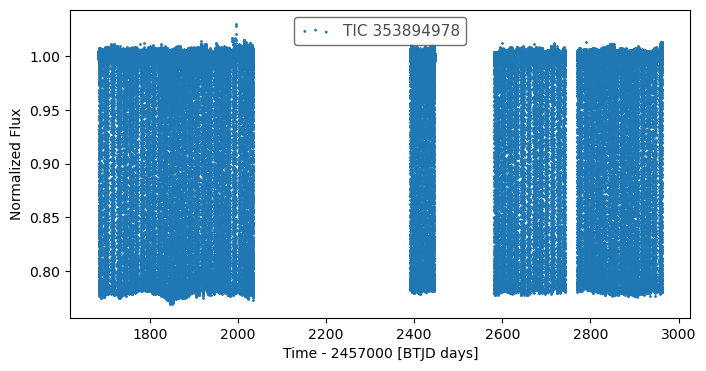

In [5]:
# mask out data you don't like...

fig, ax = plt.subplots(figsize=figsize)
search_result.scatter(ax = ax)

# t0 = 2337.376
# period_triple = 0.774

mask = time < 0  # (time > 2893.16-1) & (time < 2893.16+1) 

time = time[~mask]
flux = flux[~mask]
fluxerr = fluxerr[~mask]

# make sure that therte are no nans!

finite_mask = np.isfinite(time) * np.isfinite(flux) * np.isfinite(fluxerr)

# make a dictionary of the data 

data = pd.DataFrame({'time': time[finite_mask], 'flux': flux[finite_mask], 'err': fluxerr[finite_mask]})


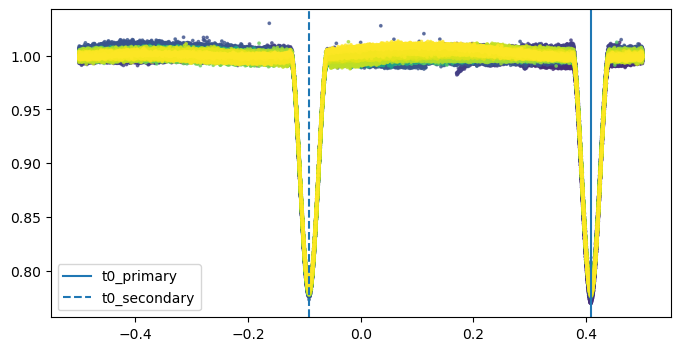

In [17]:
# define the orbital period and the t0 

# primary , or primary and secondary caught in 1 TCE,
# assuming primary / secondary caught in 1 TCE for now
# epoch=1683.9733, duration_hr=5.0161, period=1.670912, label="s0014-s0060:TCE1", 
period = 1.670912 * 2

t0_primary = 1683.9733 + period / 2
t0_secondary = 1683.9733

duration_hr_primary = 5.0161  # used for the window to cut the lighcurve around eclipses in later cells

t0_for_plotting = 0  # keep 0 for plotting purposes
# t0_for_plotting = t0_primary - np.abs(t0_primary - t0_secondary) * 0.25  # use a custom one so that the eclipses are not near the edge (-0.5 or +0.5)

phase = etv_functions.phase_data(data['time'], t0_for_plotting, period)

fig, ax = plt.subplots(figsize = (8,4))

plt.scatter(phase,data['flux'], s = 3, alpha = 0.7, c = data['time'])

# add the phase to the dataframe
data['phase'] = phase

plt.axvline(etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0], label="t0_primary")
plt.axvline(etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0], linestyle="--", label="t0_secondary")
plt.legend()
plt.show();

### Now that the data is ready we can start 

In [7]:
# show data to visualize what's changed in each step below
data  

,time,flux,err,phase
0,1683.354886,1.001724,0.001424,-0.276618
1,1683.356275,1.000383,0.001423,-0.276203
2,1683.357664,1.003524,0.001423,-0.275787
3,1683.359052,0.999456,0.001424,-0.275372
4,1683.360441,1.001970,0.001422,-0.274956
...,...,...,...,...
437249,2962.576026,1.001388,0.001210,-0.485322
437250,2962.577415,0.997157,0.001208,-0.484907
437251,2962.578804,0.999133,0.001208,-0.484491
437252,2962.580193,1.000448,0.001210,-0.484075


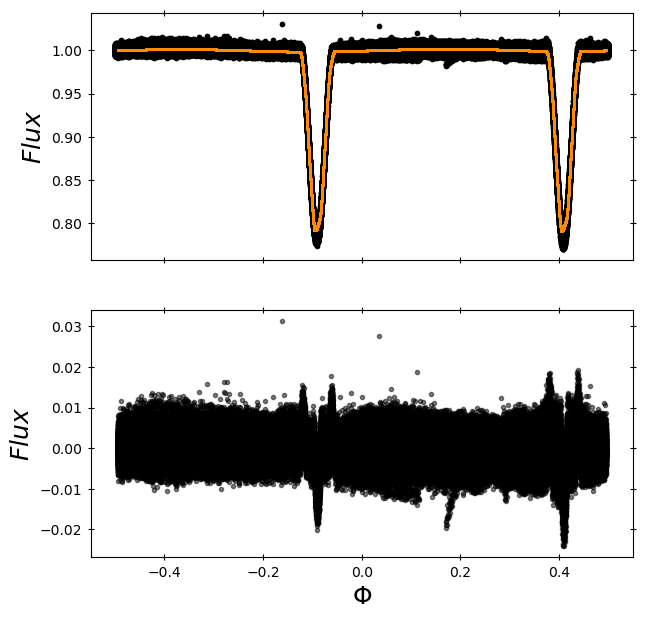

,time,flux,err,phase,flux_sub_binary,binary_model
0,1683.354886,1.001724,0.001424,-0.276618,0.001029,1.000695
1,1683.356275,1.000383,0.001423,-0.276203,-0.000304,1.000687
2,1683.357664,1.003524,0.001423,-0.275787,0.002844,1.000680
3,1683.359052,0.999456,0.001424,-0.275372,-0.001217,1.000672
4,1683.360441,1.001970,0.001422,-0.274956,0.001304,1.000665
...,...,...,...,...,...,...
437249,2962.576026,1.001388,0.001210,-0.485322,0.001156,1.000232
437250,2962.577415,0.997157,0.001208,-0.484907,-0.003081,1.000238
437251,2962.578804,0.999133,0.001208,-0.484491,-0.001112,1.000245
437252,2962.580193,1.000448,0.001210,-0.484075,0.000196,1.000251


In [8]:
# phase fold the data and create an appoximate binary model (top) and subtract it from the data (bottom)
#_, _ , flux_sub_binary, model, _, _ = etv_functions.trend_removal_interact(period, 0, data['time'], data['flux'], data['time'], data['flux'])

data = etv_functions.trend_removal_interact(period, t0_for_plotting, data)
data

10 432891 901
reached the end
10 414071 901
reached the end
10 412251 901
reached the end
10 411744 901
reached the end
10 411540 901
reached the end


,time,flux,err,phase,flux_sub_binary,binary_model,flux_detrended
0,1683.354886,1.001724,0.001424,-0.276618,0.001029,1.000695,1.001232
1,1683.356275,1.000383,0.001423,-0.276203,-0.000304,1.000687,0.999888
2,1683.357664,1.003524,0.001423,-0.275787,0.002844,1.000680,1.003027
3,1683.359052,0.999456,0.001424,-0.275372,-0.001217,1.000672,0.998956
4,1683.360441,1.001970,0.001422,-0.274956,0.001304,1.000665,1.001468
...,...,...,...,...,...,...,...
437249,2962.576026,1.001388,0.001210,-0.485322,0.001156,1.000232,1.001876
437250,2962.577415,0.997157,0.001208,-0.484907,-0.003081,1.000238,0.997649
437251,2962.578804,0.999133,0.001208,-0.484491,-0.001112,1.000245,0.999628
437252,2962.580193,1.000448,0.001210,-0.484075,0.000196,1.000251,1.000948


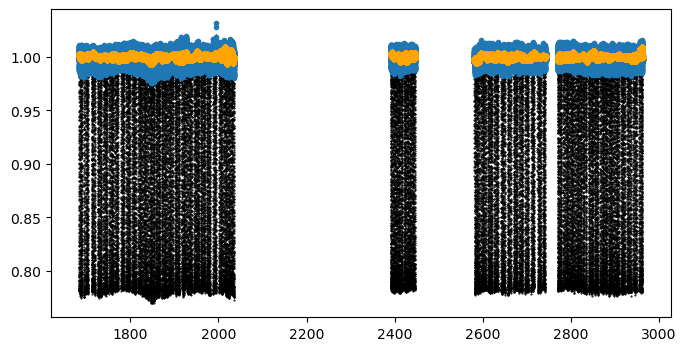

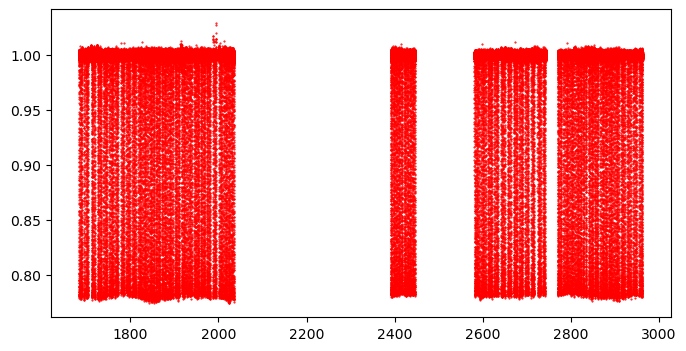

In [9]:
# if you want to detrend the data run this line!

data = etv_functions.detrend_suz(data, T_dur = 10, plot = True)
data

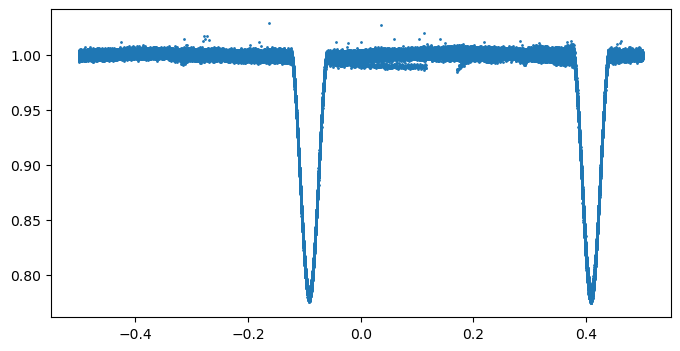

In [10]:
# plot the phase folded data here so that you know at what phase you want to cut the data to model 
fig, ax = plt.subplots(figsize = figsize)
plt.scatter(data.phase, data.flux_detrended, s = 1)
plt.show()

Primary:   1685.6442120000002 0.4084344358051639
Secondary: 1683.9733 -0.09156556419484929
window_width (phase): 0.07505033179485215


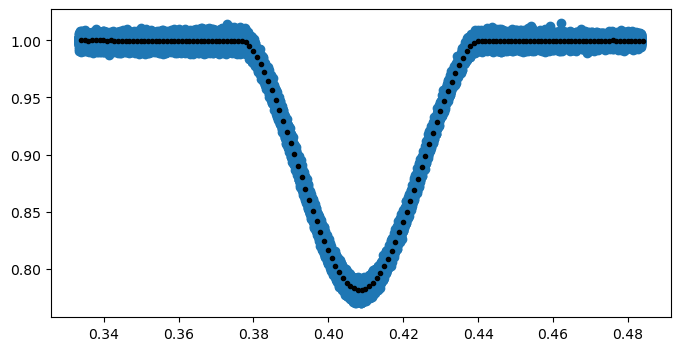

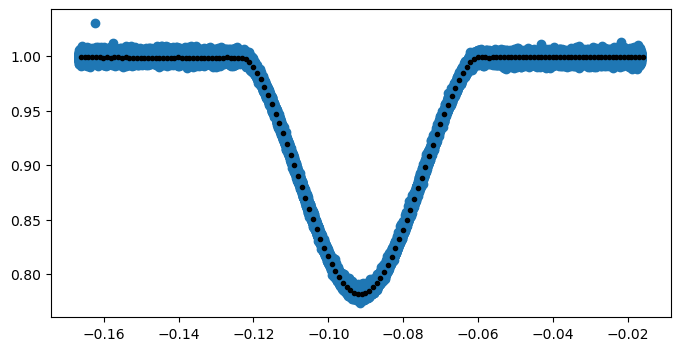

In [18]:
# define the midpoints of the primary and secondary eclipses and the window width

# if these don't look central - change them!! the eclipses should be central
midpoint_p =  etv_functions.phase_data([t0_primary], t0_for_plotting, period)[0]  # convet to time in phase
midpoint_s =  etv_functions.phase_data([t0_secondary], t0_for_plotting, period)[0]

print('Primary:  ', t0_primary, midpoint_p)
print('Secondary:', t0_secondary, midpoint_s)

# change depending on the width of the eclipses, default to be slightly larger than the primary eclipse
window_width = 1.2 * duration_hr_primary / 24 / period
# window_width = 0.05
print("window_width (phase):", window_width)


data_primary = data[(data['phase'] > midpoint_p - window_width) & (data['phase'] < midpoint_p + window_width) ]
data_secondary = data[(data['phase'] > midpoint_s - window_width) & (data['phase'] < midpoint_s + window_width) ]

ph_binned,flux_binned,err_binned = etv_functions.run_binning_phased(data_primary.phase, data_primary.flux, yerr=data_primary.err,nbins=1000)
ph_binned_s,flux_binned_s,err_binned_s = etv_functions.run_binning_phased(data_secondary.phase, data_secondary.flux, yerr=data_secondary.err,nbins=1000)


# -- -- -- -- -- -- -- -- -- 

fig = plt.subplots(figsize=figsize, sharex=True)
plt.errorbar(ph_binned, flux_binned, yerr=err_binned, fmt=".k", capsize=0, zorder = 2)
plt.scatter(data_primary.phase, data_primary.flux, zorder = -2)
plt.show()

# -- -- -- -- -- -- -- -- -- 
fig = plt.subplots(figsize=figsize, sharex=True)
plt.errorbar(ph_binned_s, flux_binned_s, yerr=err_binned_s, fmt=".k", capsize=0, zorder = 2)
plt.scatter(data_secondary.phase, data_secondary.flux, zorder = -2)
plt.show() 

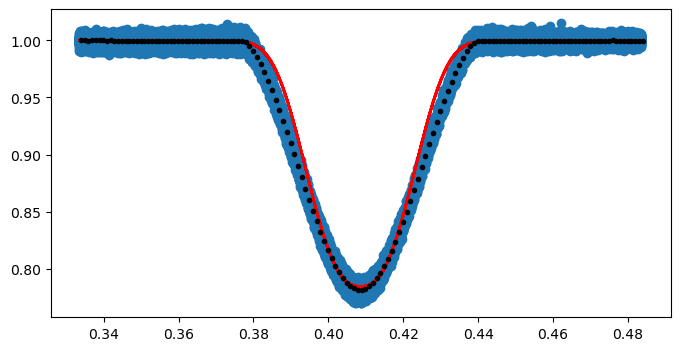

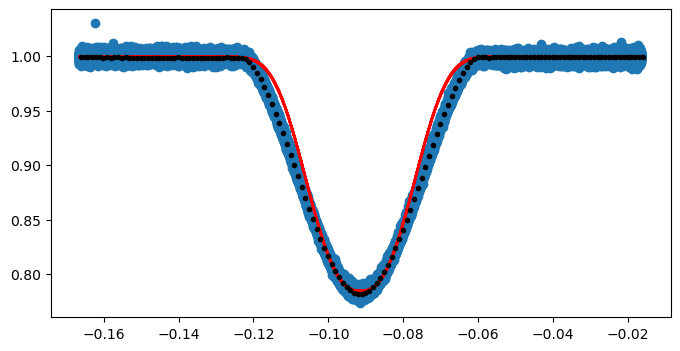

In [19]:
### # you need initial guesses!! The order is :
# alpha0, alpha1, t0, d, Tau - CHANGE THESE TO YOUR OWN INITIAL GUESSES
# median flux, -eclipse depth, t0, related to duration, related to shape (U or V) 
# t0 in normalixed phase
start_vals = [1, -0.215, midpoint_p, 0.012, 1.3]
start_vals_s = [1, -0.215, midpoint_s, 0.012, 1.3]

# - - -- - 

etv_functions.plot_initial_guess(data_primary, ph_binned, flux_binned, err_binned, *start_vals)
etv_functions.plot_initial_guess(data_secondary, ph_binned_s, flux_binned_s, err_binned_s, *start_vals_s)


100%|██████████████████████████████████████████████████████████| 1000/1000 [09:31<00:00,  1.75it/s]


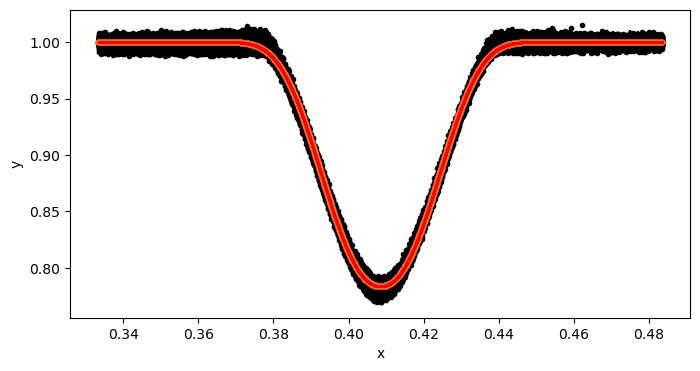

100%|██████████████████████████████████████████████████████████| 1000/1000 [09:20<00:00,  1.78it/s]


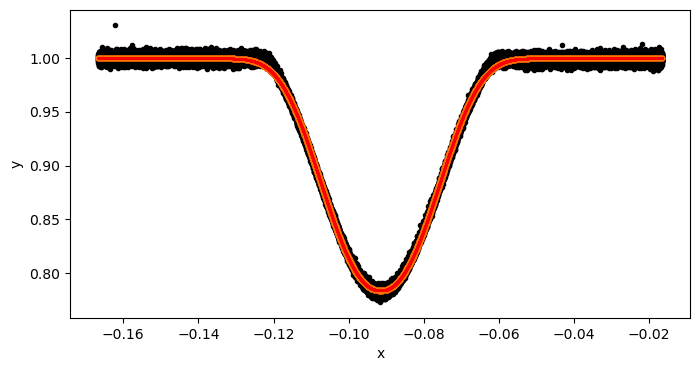

In [20]:
# run the initial model fit using MCMC for the primary and secondary eclipses 

mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau = etv_functions.run_mcmc_initial_fit(data_primary, start_vals, nruns = 1000, plot_chains = False, plot = True)
mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s = etv_functions.run_mcmc_initial_fit(data_secondary, start_vals_s, nruns = 1000, plot_chains = False, plot = True)
!$NOTIFY_CMD "Initial fit done"

382

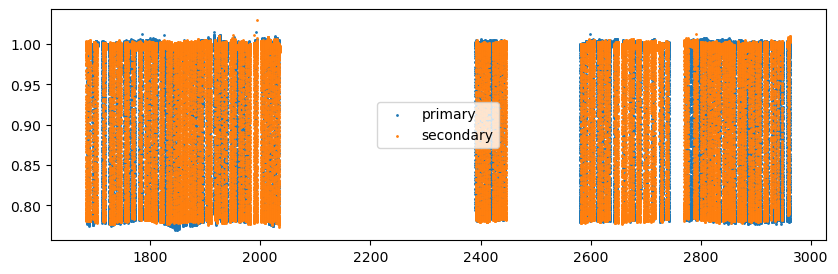

In [23]:
fig = plt.subplots(figsize=(10, 3), sharex=True)
plt.scatter(data_primary.time,data_primary.flux , s = 1, label = 'primary')
plt.scatter(data_secondary.time,data_secondary.flux , s = 1, label = 'secondary')
plt.legend()

# calculate the number of transits there are within the data 
n_transits = int((max(data_primary.time) - min(data_primary.time)) / period)
n_transits

1685.6442120000002 3.341824 1685.6442120000002


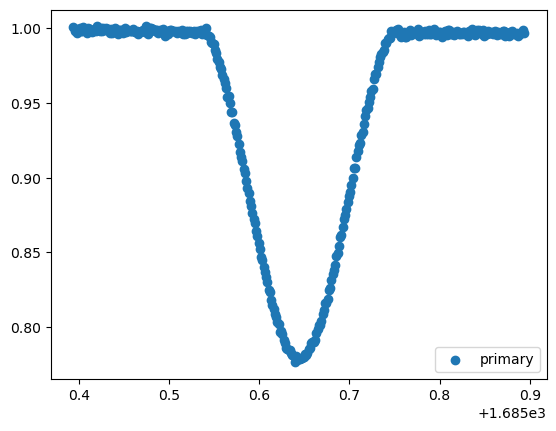

1685.6442120000002 3.341824 1688.9860360000002


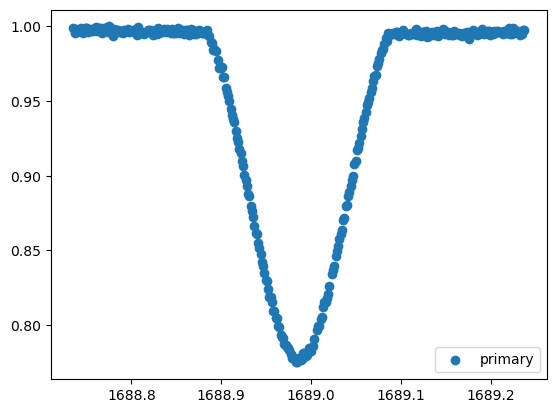

1685.6442120000002 3.341824 1692.32786


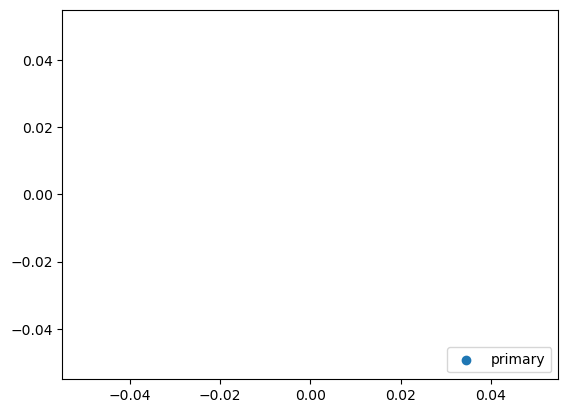

1683.9733 3.341824 1683.9733


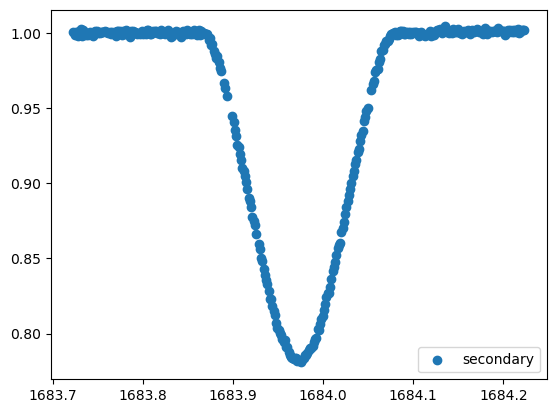

1683.9733 3.341824 1687.3151240000002


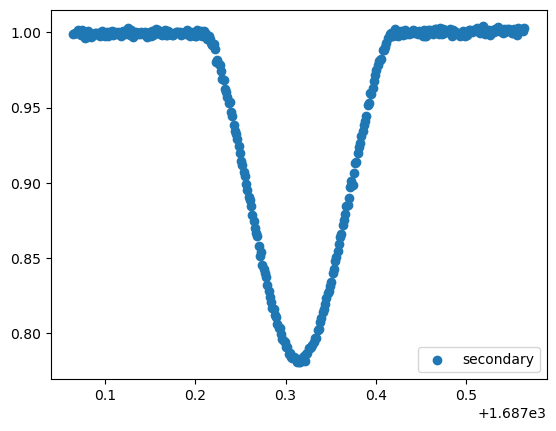

1683.9733 3.341824 1690.656948


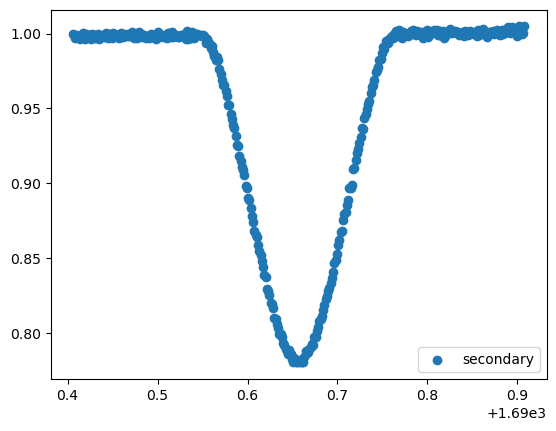

In [24]:
tr_index = range(0,n_transits)

for i in tr_index[0:3]:        
    transit_time = t0_primary+(period*i)
    x = np.array(data_primary.time)
    y = np.array(data_primary.flux) 
    yerr = np.array(data_primary.err)
    
    print (t0_primary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="primary")
    plt.legend(loc="lower right")
    plt.show()
    

for i in tr_index[0:3]:        
    transit_time = t0_secondary+(period*i)
    x = np.array(data_secondary.time)
    y = np.array(data_secondary.flux) 
    yerr = np.array(data_secondary.err)
    
    print (t0_secondary, period, transit_time)
    
    mask = (x > (transit_time - (0.2*period))) & (x < (transit_time + (0.2*period))) 
    
    x = np.array(x[mask])
    y = np.array(y[mask]) 
    yerr = np.array(yerr[mask])
    fig, ax = plt.subplots()
    plt.scatter(x,y, label="secondary")
    plt.legend(loc="lower right")
    plt.show()

In [25]:
print("Primary   - Start params")
print(*start_vals)
print("Primary   - Initial params")
print(mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau)

print("Secondary - Start params")
print(*start_vals_s)
print("Secondary - Initial params")
print(mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s)

Primary   - Start params
1 -0.215 0.4084344358051639 0.012 1.3
Primary   - Initial params
1.00029733877068 -0.21644068259987398 0.4084573204559342 0.014175335945694775 1.1087406998131772
Secondary - Start params
1 -0.215 -0.09156556419484929 0.012 1.3
Secondary - Initial params
0.9995033583125017 -0.2153388480950119 -0.09155924521145649 0.014157474054175173 1.1115983743234632


Fitting individual primary eclipses...
Creating new manifest file
1685.6442120000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


  0%|                                                                    | 0/10000 [00:00<?, ?it/s]C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.46it/s]


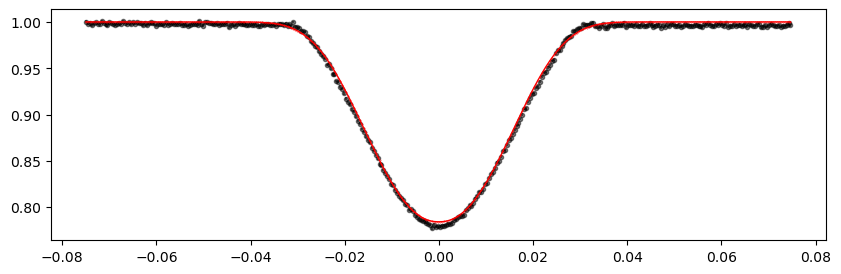

1688.9860360000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1326.95it/s]


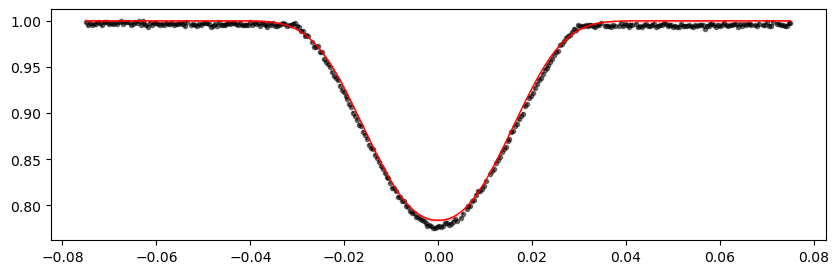

1695.6696840000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1331.56it/s]


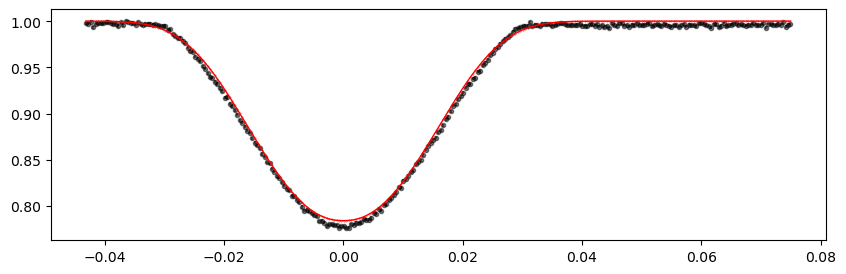

1699.011508 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.03it/s]


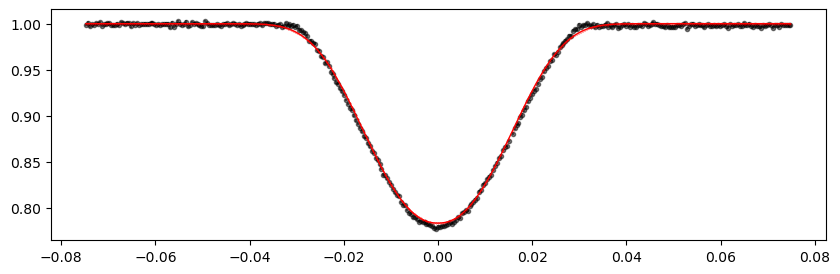

1702.3533320000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.33it/s]


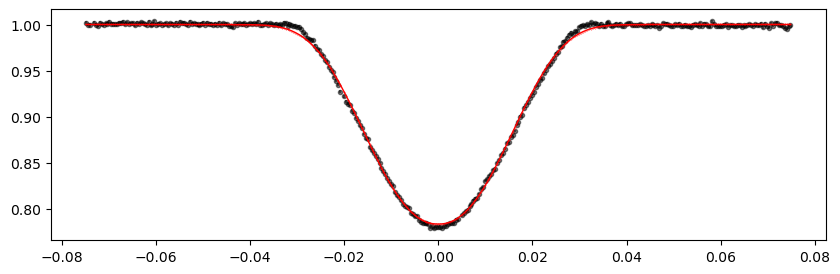

1705.6951560000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.50it/s]


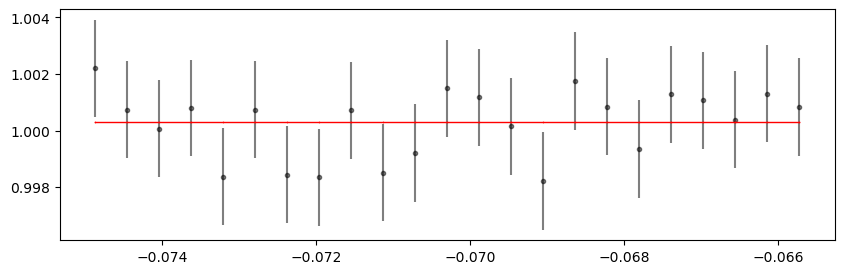

1712.3788040000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.38it/s]


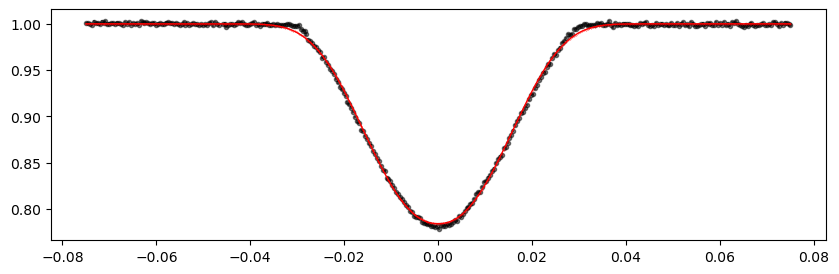

1715.7206280000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.86it/s]


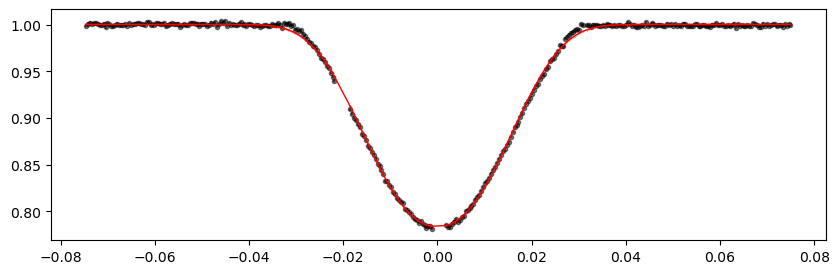

1719.0624520000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.37it/s]


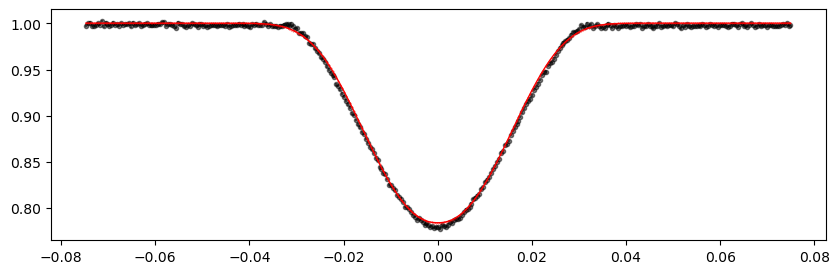

1725.7461 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.78it/s]


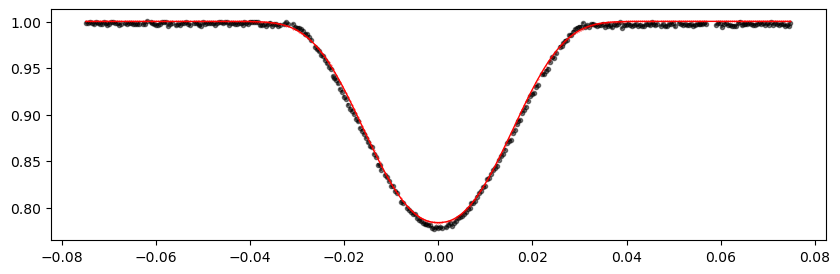

1729.0879240000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.22it/s]


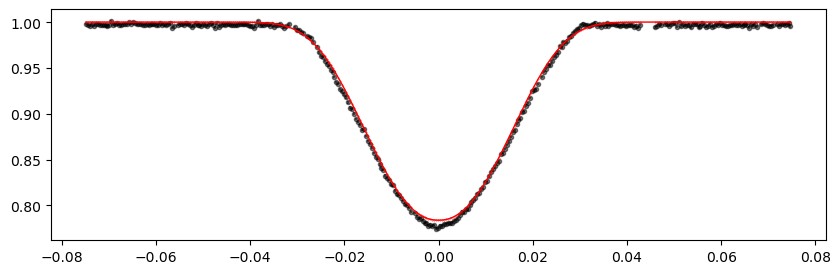

1732.4297480000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.50it/s]


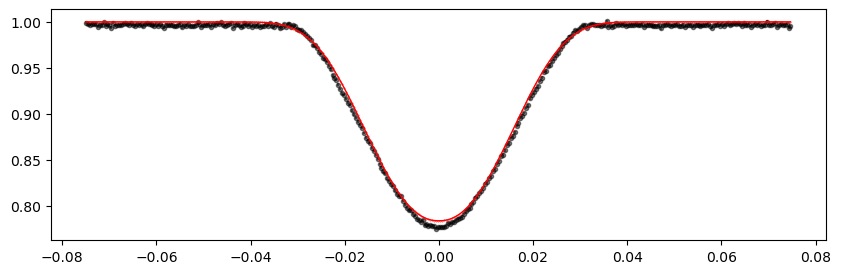

1739.1133960000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.30it/s]


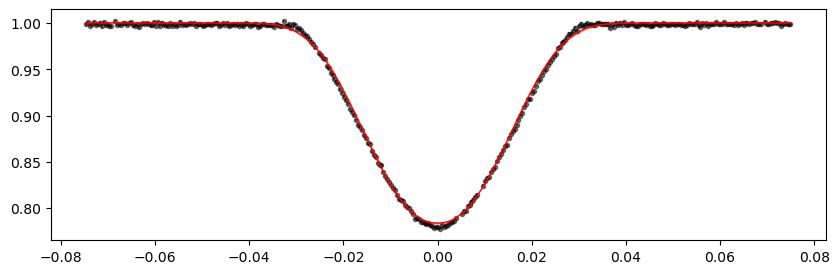

1742.45522 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.71it/s]


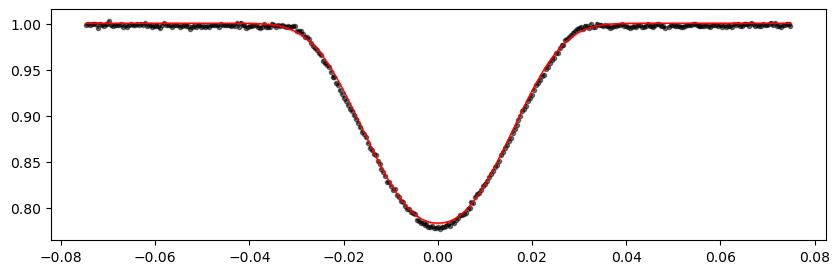

1745.7970440000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.23it/s]


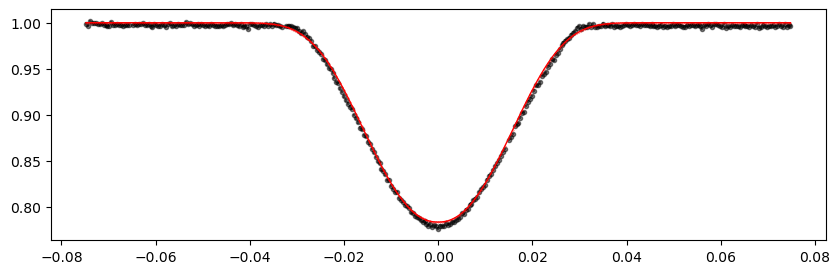

1749.1388680000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1322.01it/s]


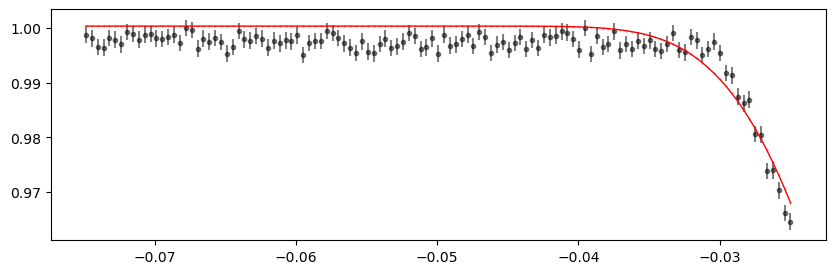

1752.480692 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.13it/s]


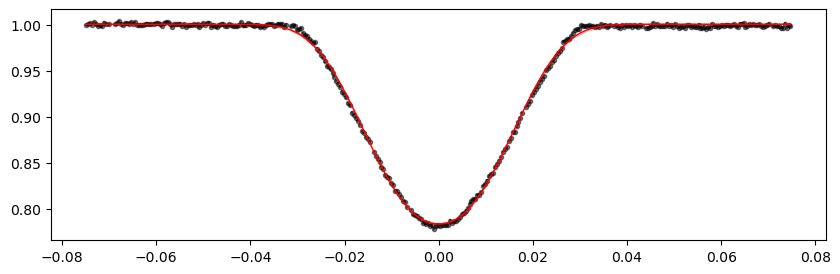

1755.8225160000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.93it/s]


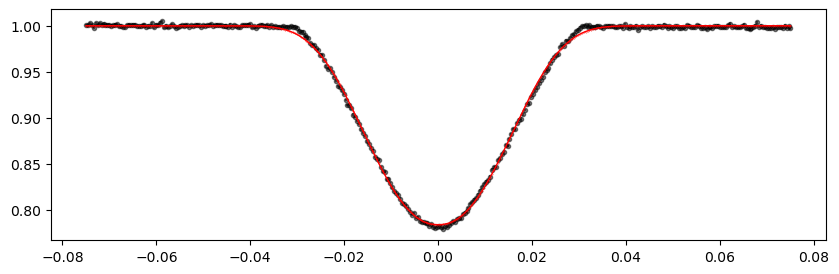

1759.1643400000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.94it/s]


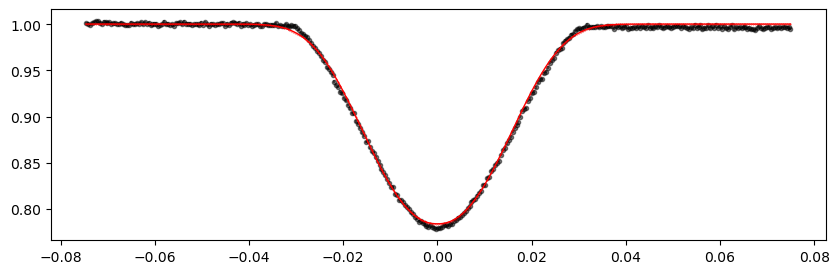

1762.5061640000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.82it/s]


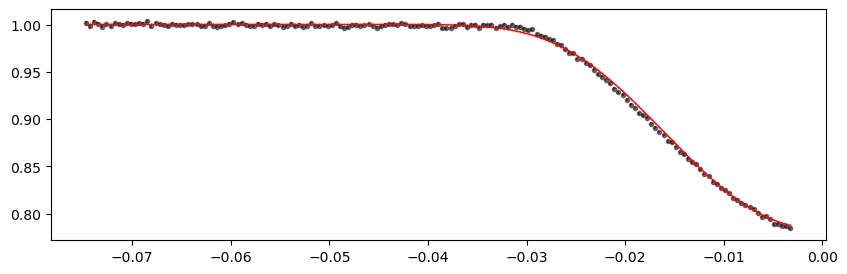

1765.8479880000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.00it/s]


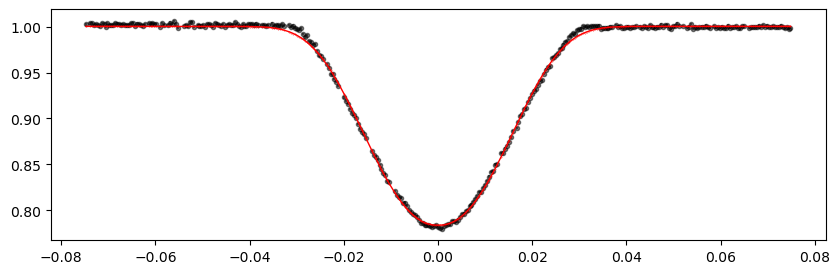

1769.189812 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.40it/s]


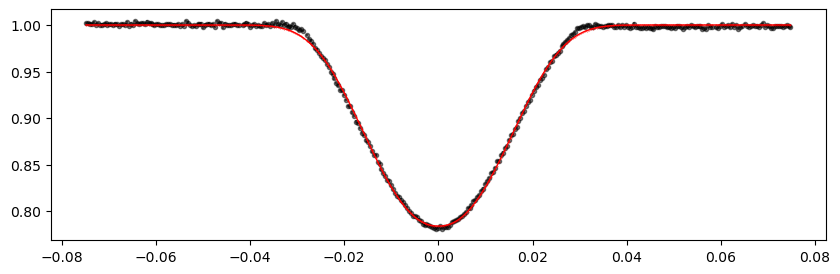

1772.5316360000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.84it/s]


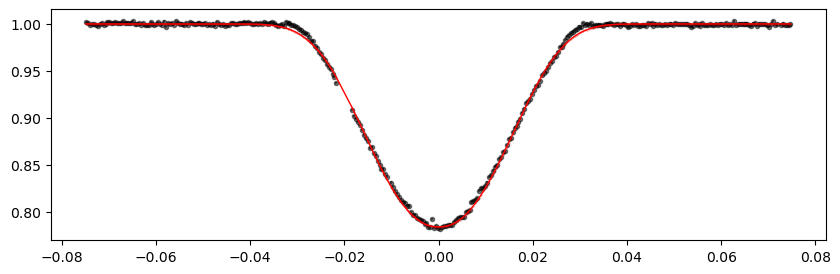

1779.215284 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.17it/s]


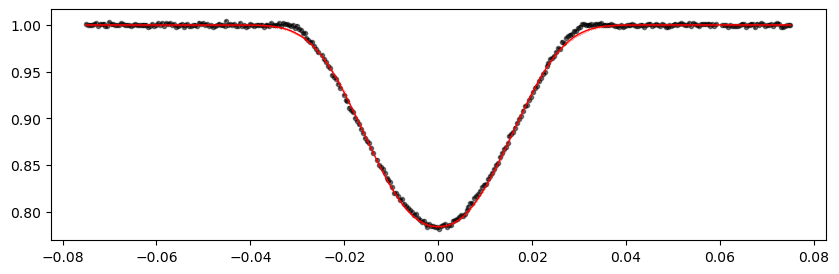

1782.5571080000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1378.66it/s]


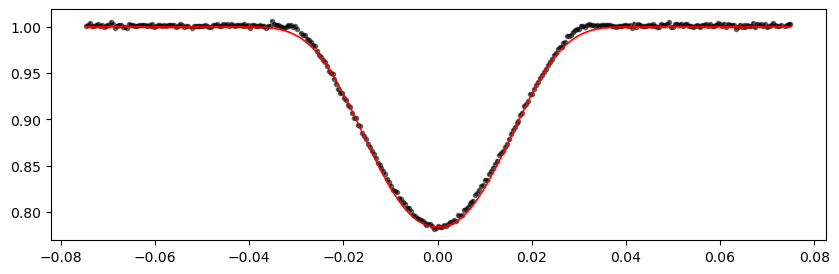

1785.898932 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.50it/s]


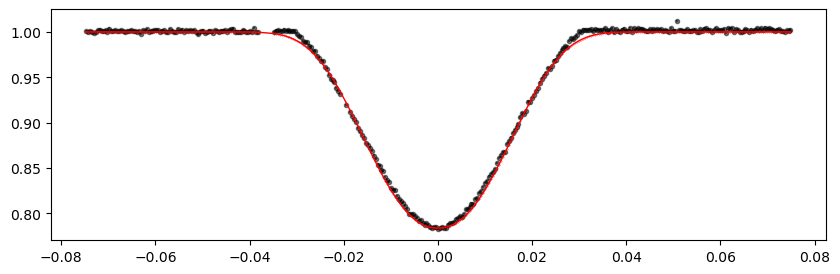

1792.5825800000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.99it/s]


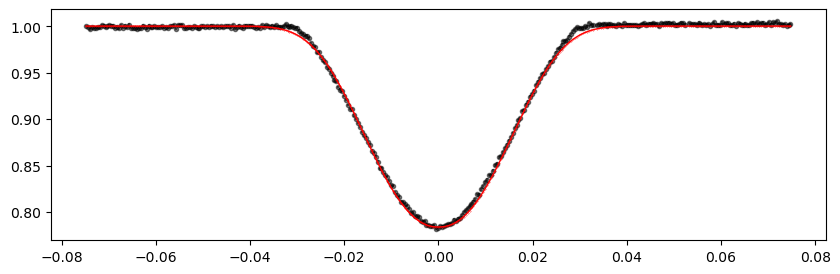

1795.924404 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.92it/s]


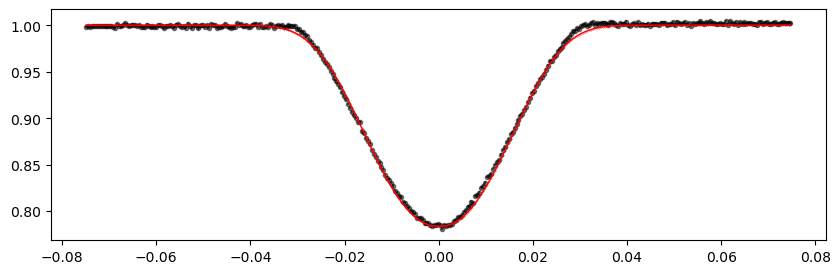

1799.2662280000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.74it/s]


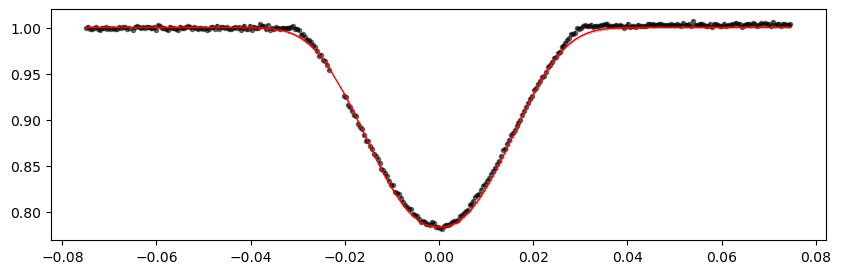

1805.9498760000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.59it/s]


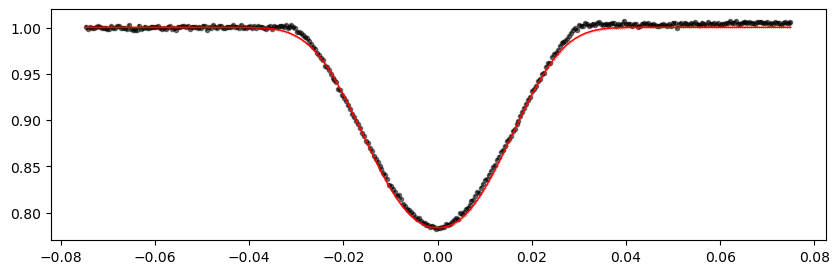

1809.2917000000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.09it/s]


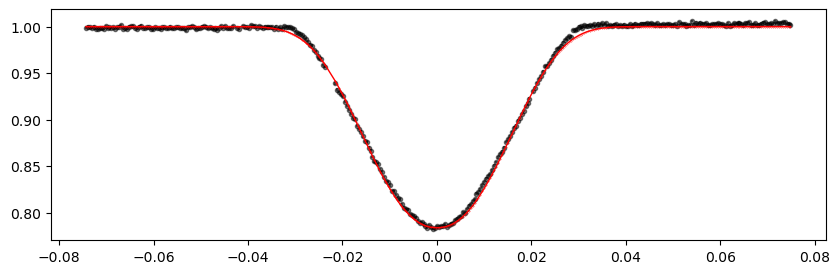

1812.633524 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.87it/s]


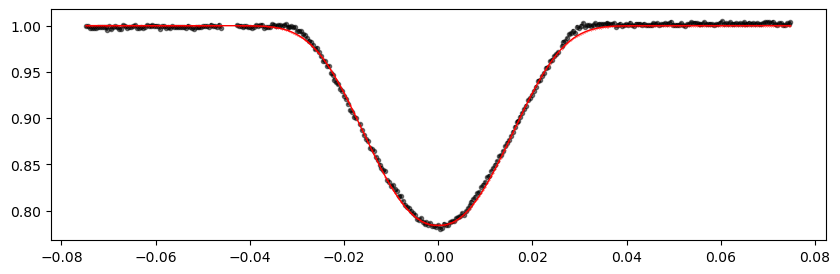

1815.9753480000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1387.94it/s]


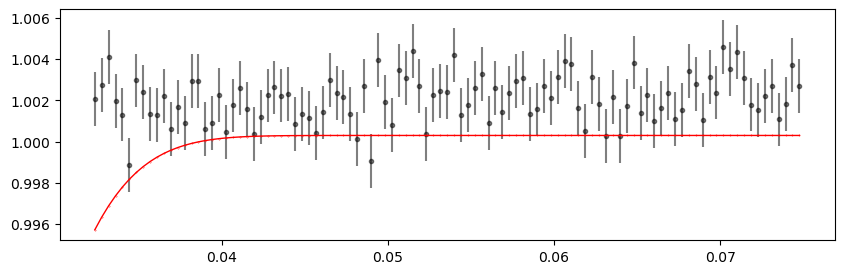

1819.317172 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1373.79it/s]


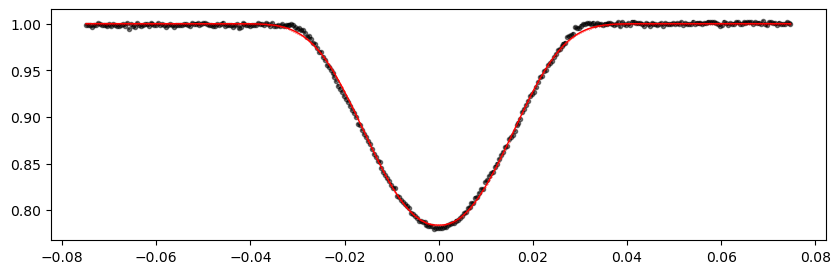

1822.6589960000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.80it/s]


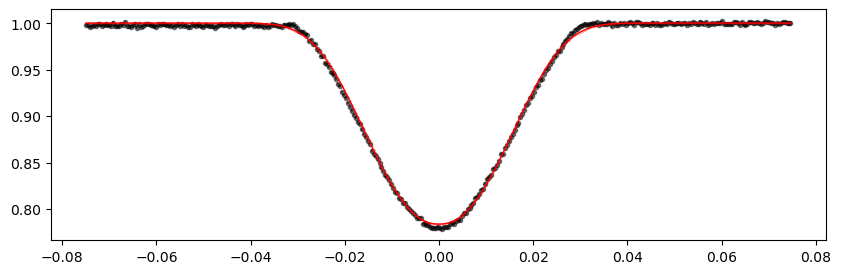

1826.0008200000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.65it/s]


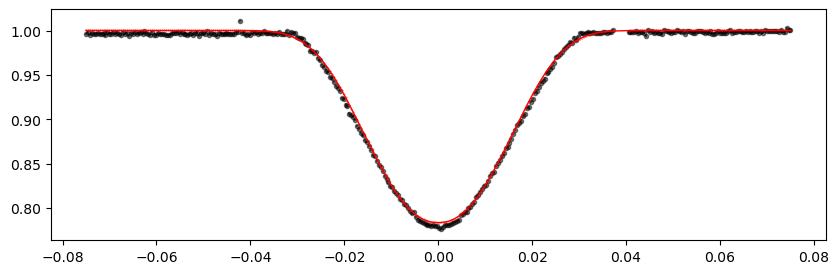

1829.342644 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.72it/s]


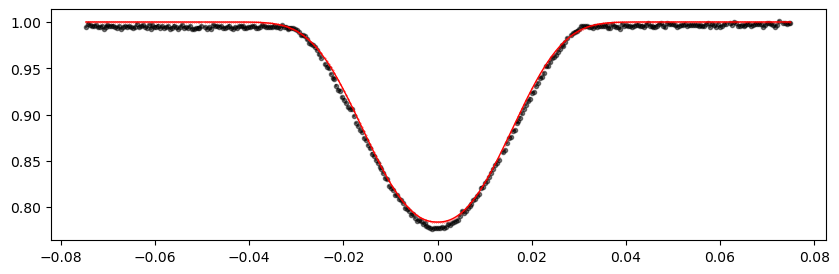

1832.6844680000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.91it/s]


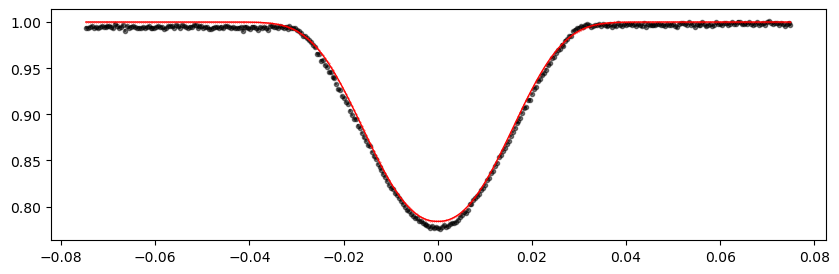

1836.0262920000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1318.83it/s]


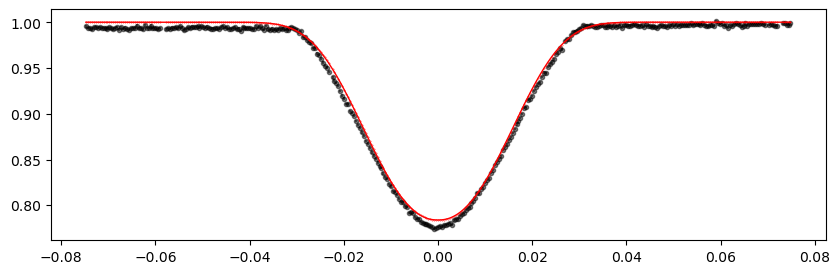

1839.368116 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.54it/s]


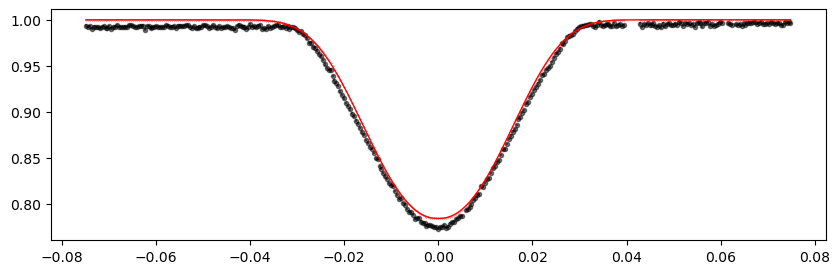

1842.7099400000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.57it/s]


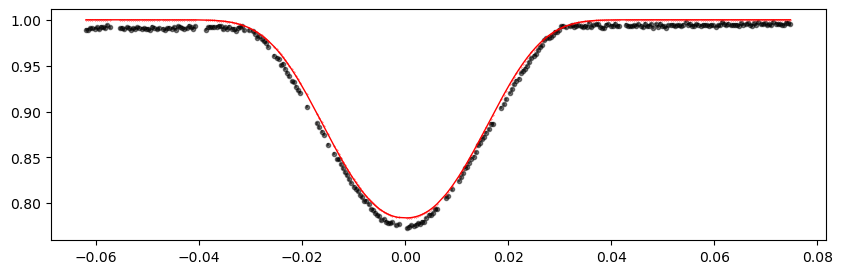

1846.0517640000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.57it/s]


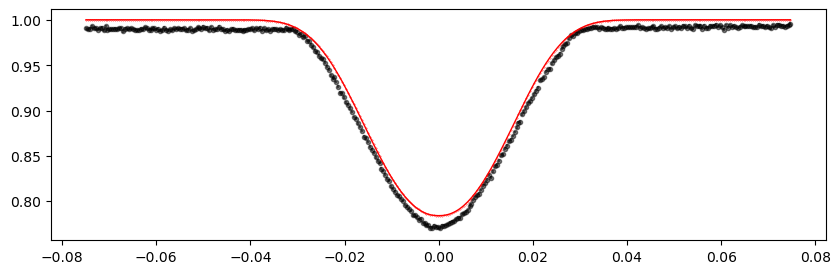

1849.3935880000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1376.86it/s]


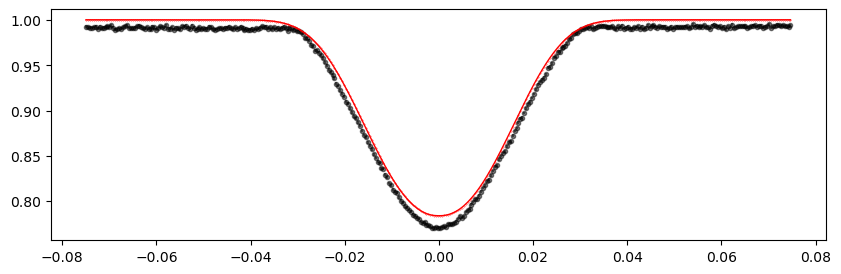

1852.7354120000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.91it/s]


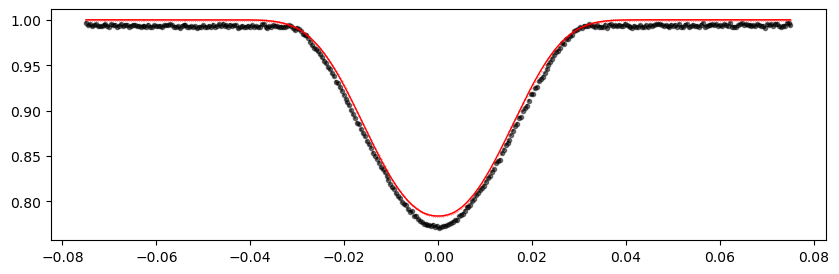

1859.4190600000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.65it/s]


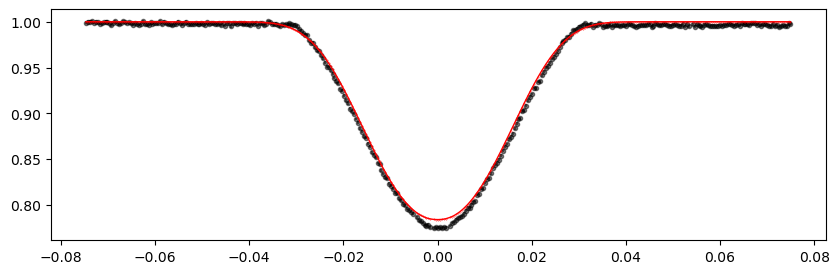

1862.7608840000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1373.97it/s]


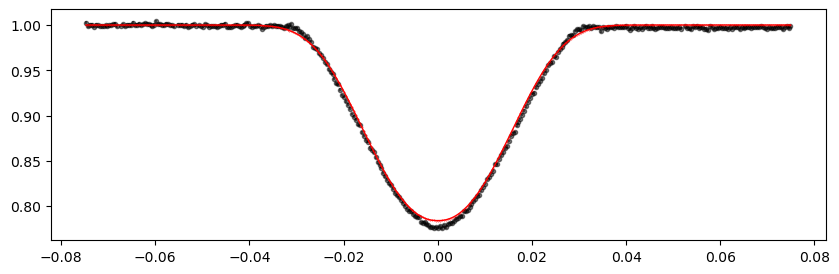

1866.1027080000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.54it/s]


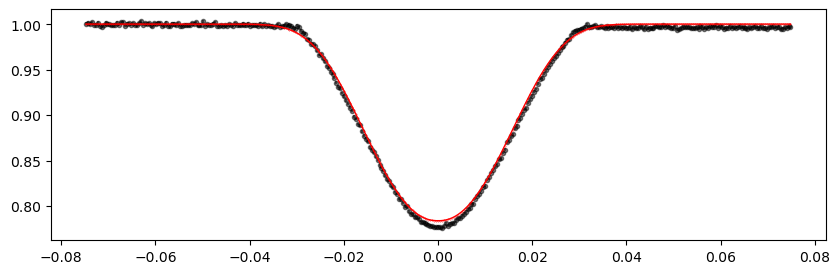

1872.786356 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1374.93it/s]


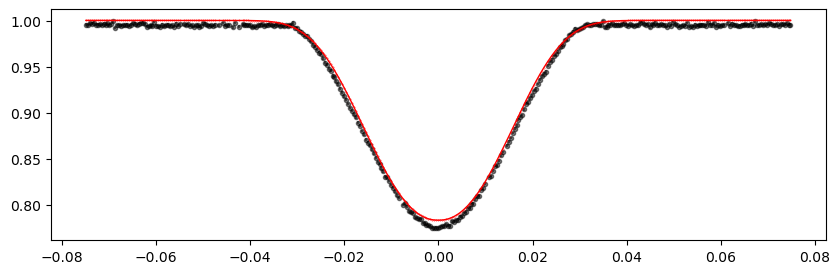

1876.1281800000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.01it/s]


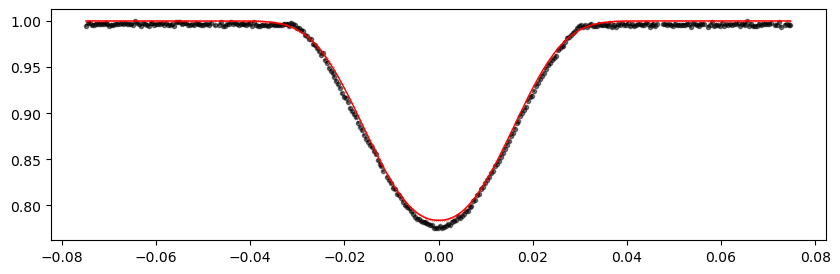

1879.4700040000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.80it/s]


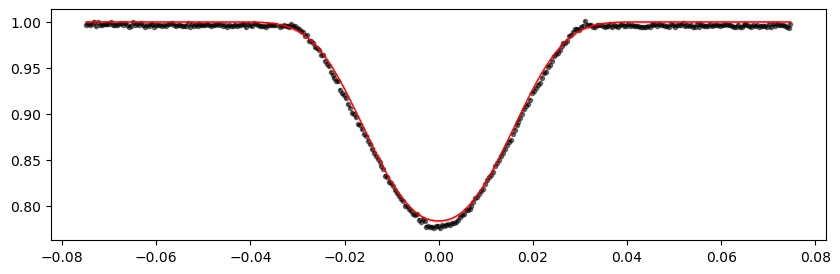

1882.811828 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1378.54it/s]


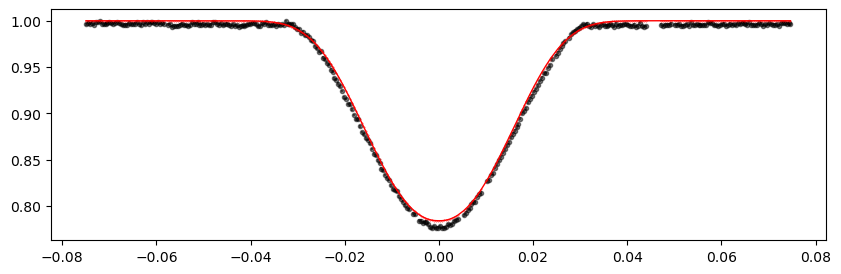

1886.1536520000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.67it/s]


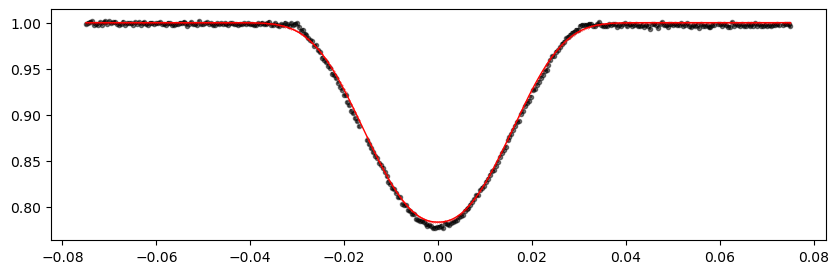

1889.495476 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.53it/s]


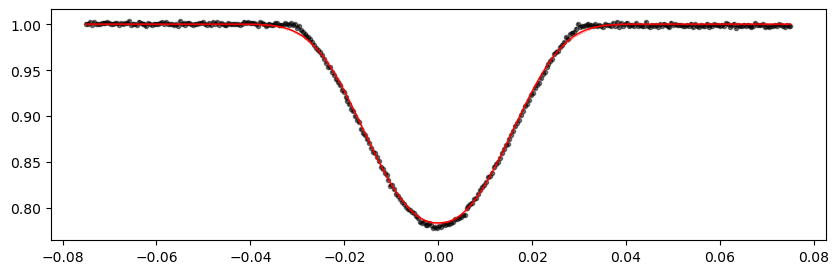

1892.8373000000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.80it/s]


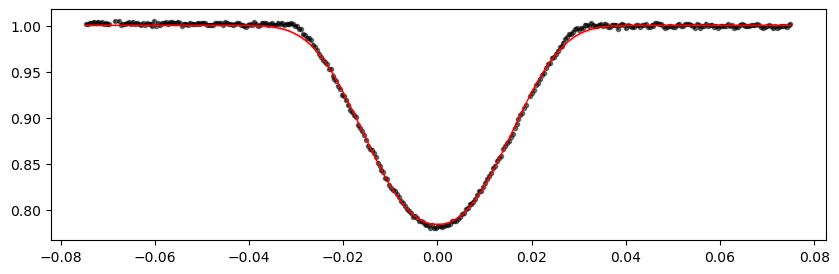

1896.1791240000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.61it/s]


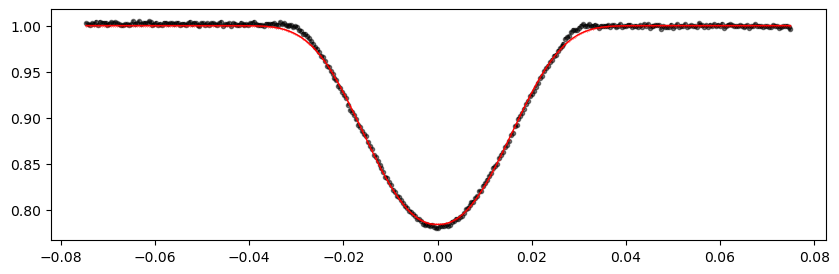

1902.8627720000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.55it/s]


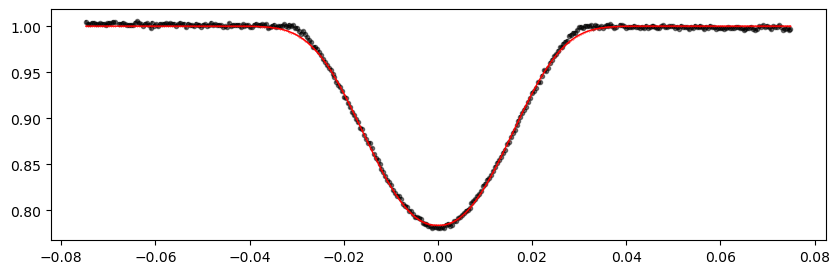

1906.204596 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.79it/s]


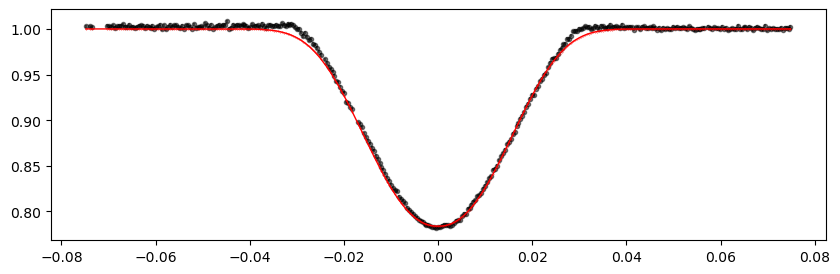

1909.5464200000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.07it/s]


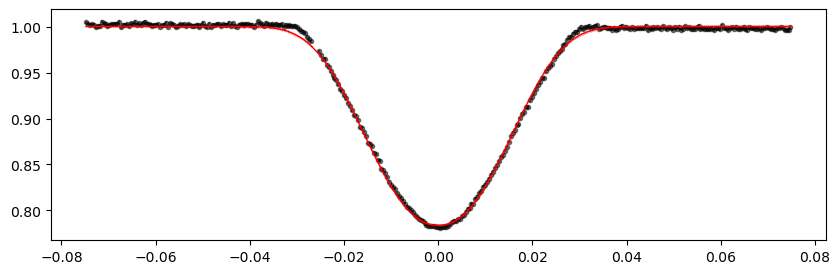

1916.230068 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.70it/s]


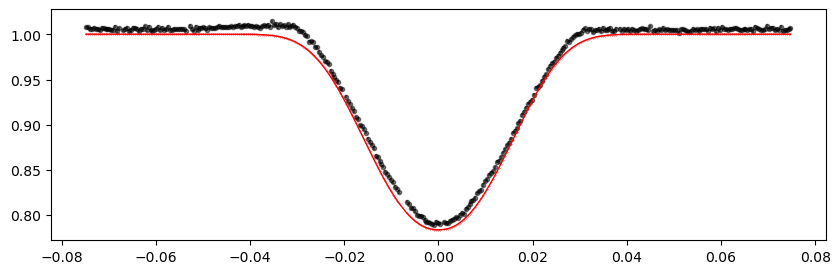

1919.5718920000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.66it/s]


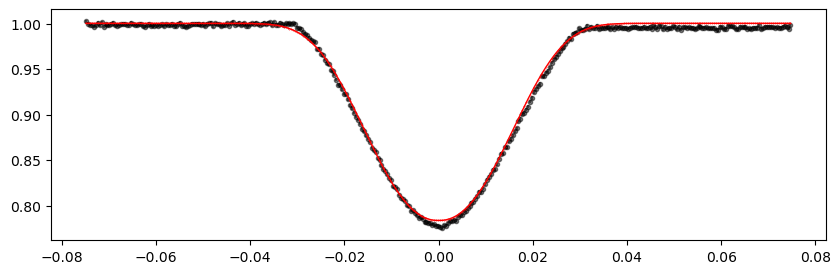

1922.913716 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.64it/s]


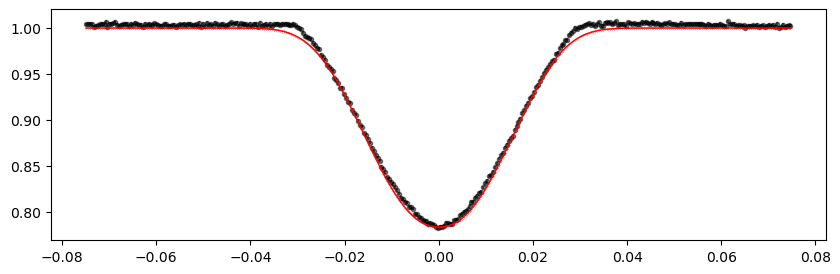

1926.25554 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.28it/s]


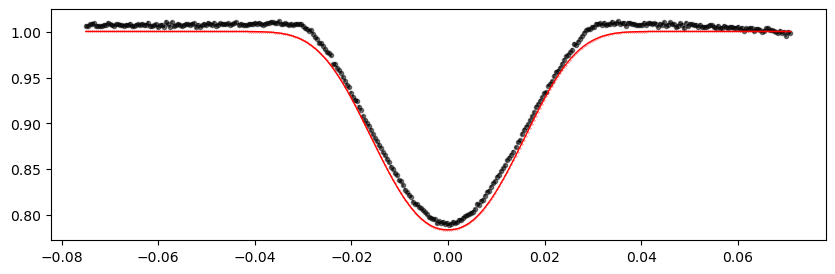

1929.5973640000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.30it/s]


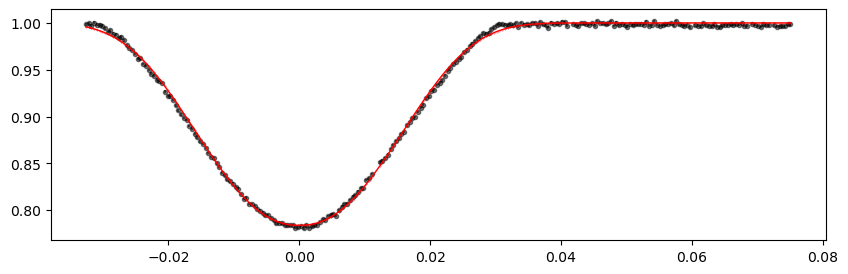

1932.939188 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.85it/s]


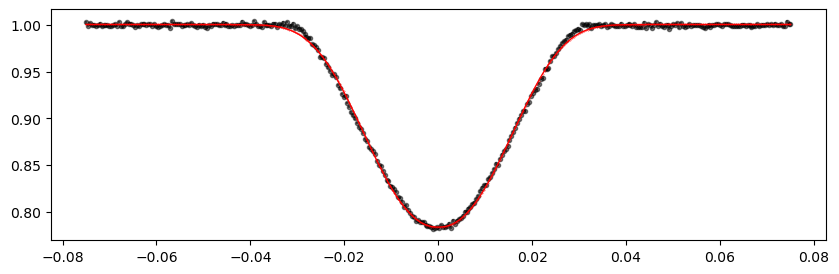

1936.2810120000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.75it/s]


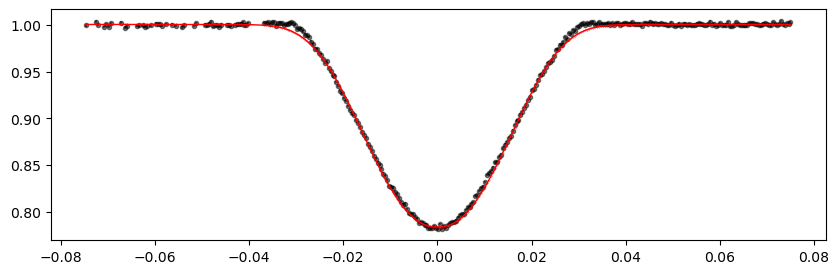

1939.6228360000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.93it/s]


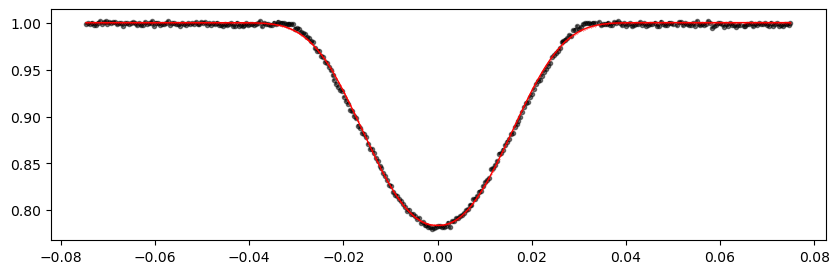

1946.3064840000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1390.79it/s]


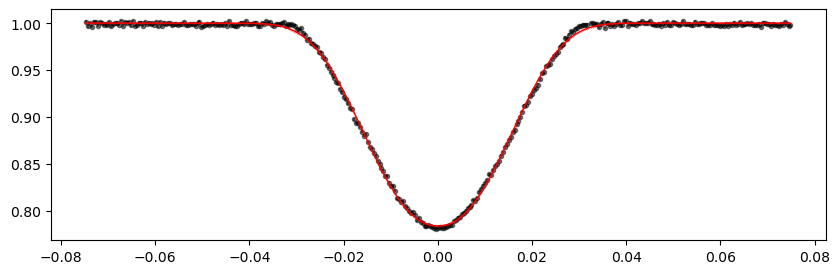

1949.6483080000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1379.03it/s]


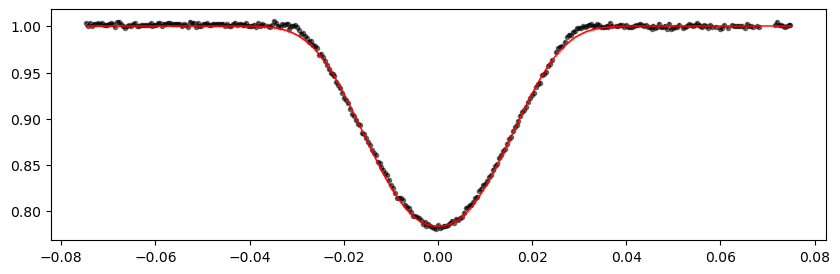

1952.9901320000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.90it/s]


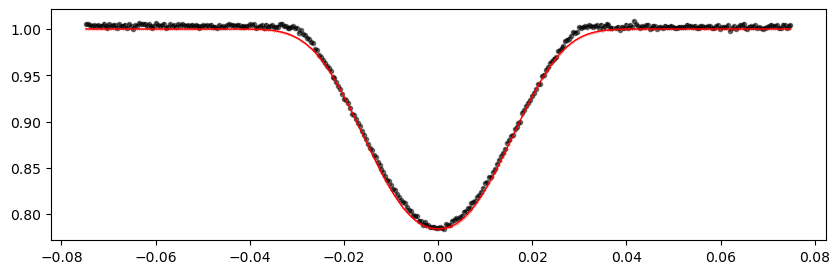

1956.3319560000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1371.70it/s]


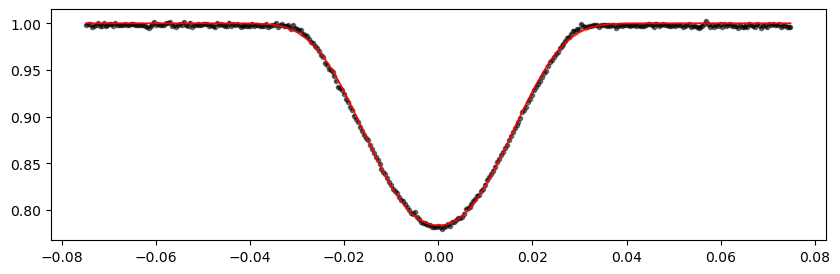

1959.67378 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1378.76it/s]


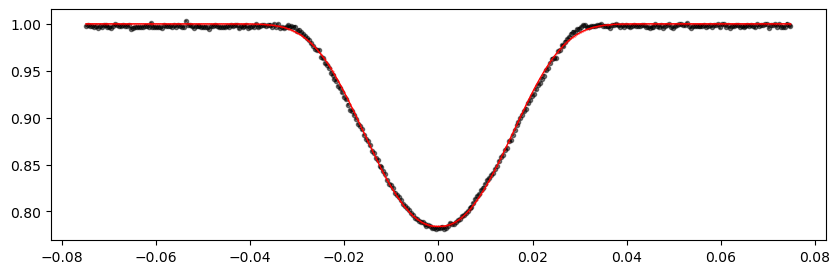

1963.0156040000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.92it/s]


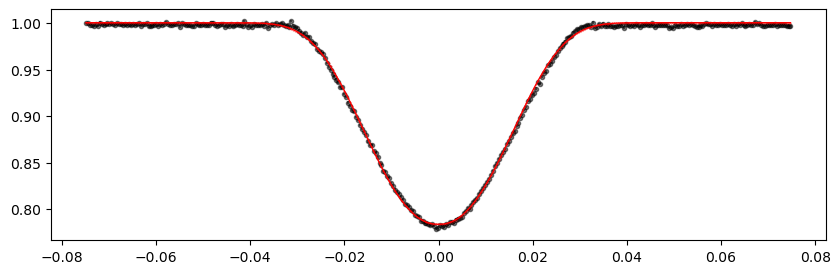

1966.3574280000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.05it/s]


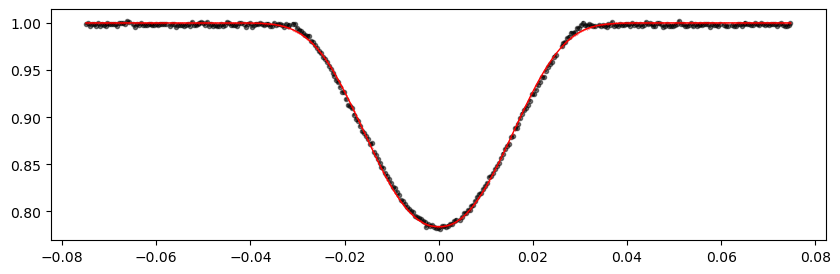

1969.6992520000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1324.24it/s]


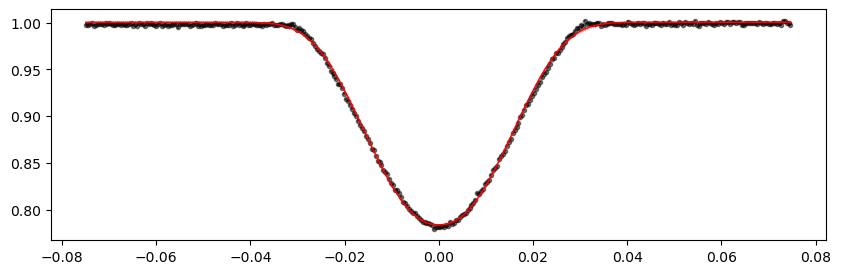

1973.0410760000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.61it/s]


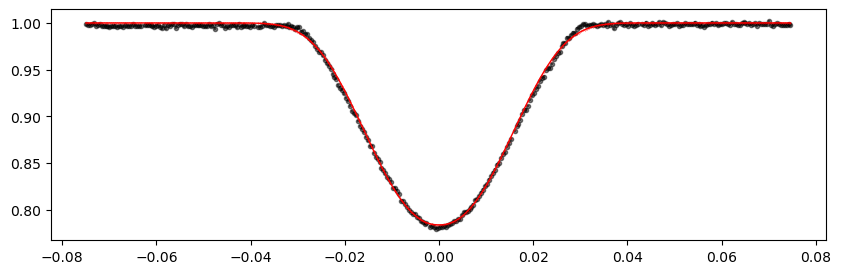

1976.3829 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.26it/s]


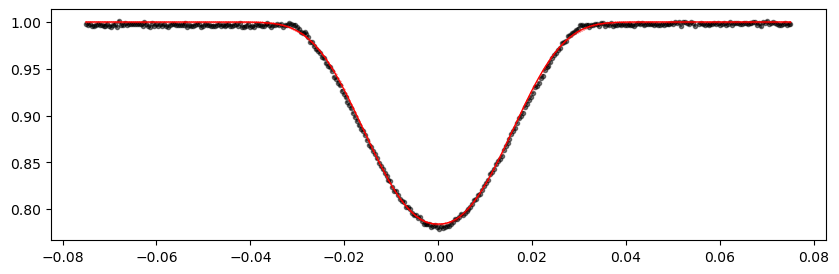

1979.7247240000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.59it/s]


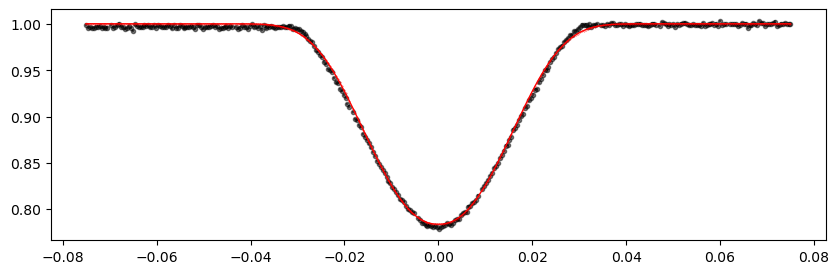

1989.7501960000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1371.34it/s]


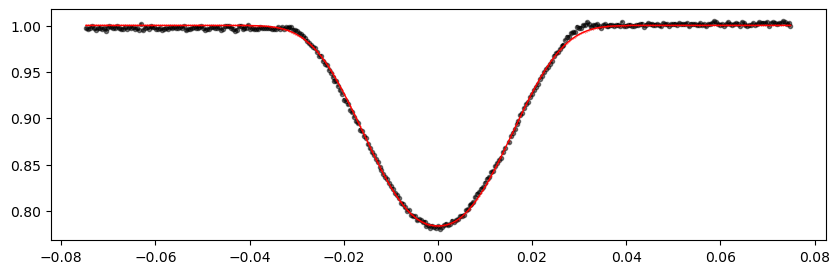

1993.09202 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1373.37it/s]


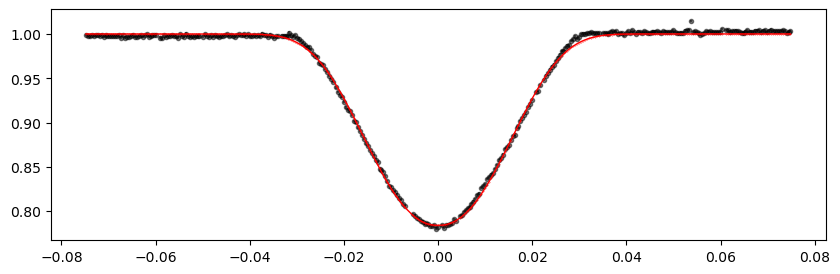

2003.117492 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.67it/s]


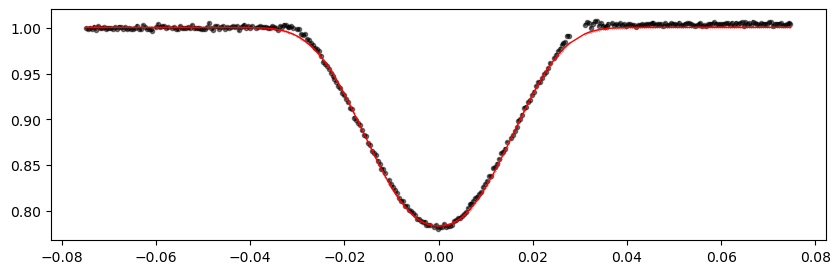

2006.4593160000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.78it/s]


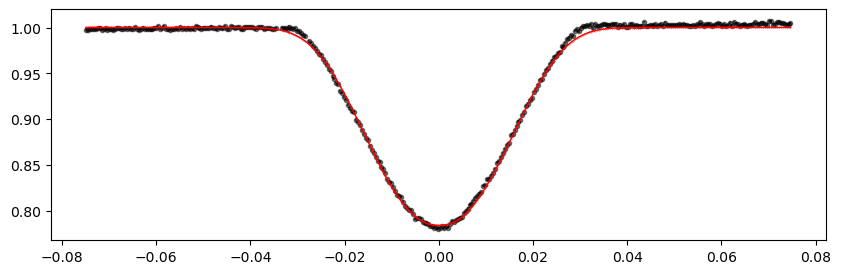

2013.1429640000001 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.74it/s]


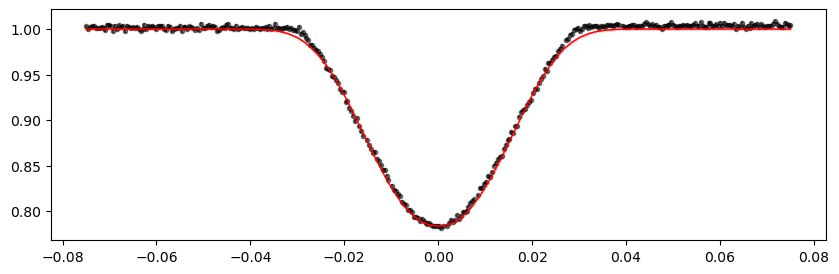

2016.4847880000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.76it/s]


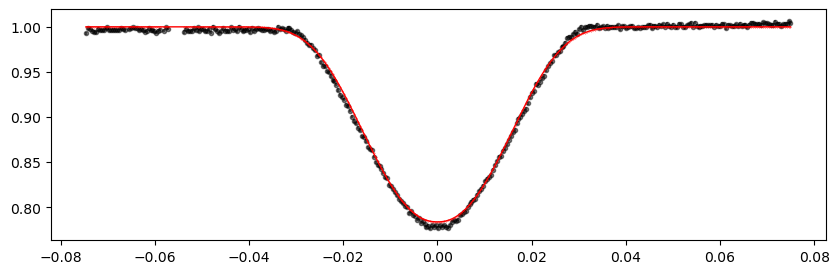

2019.826612 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.62it/s]


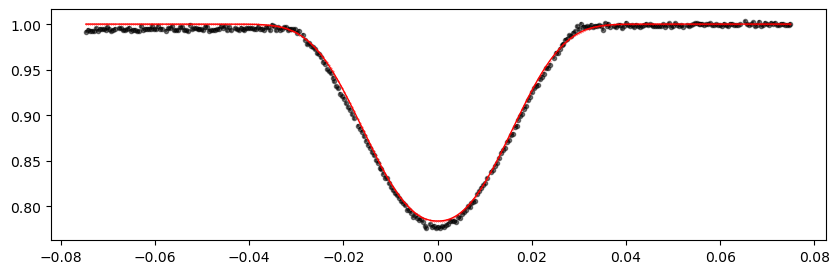

2023.1684360000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.95it/s]


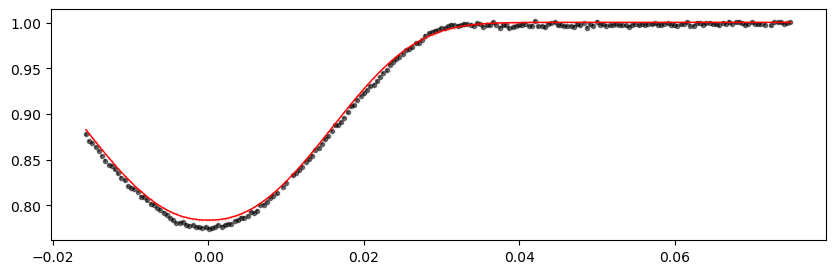

2026.51026 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.27it/s]


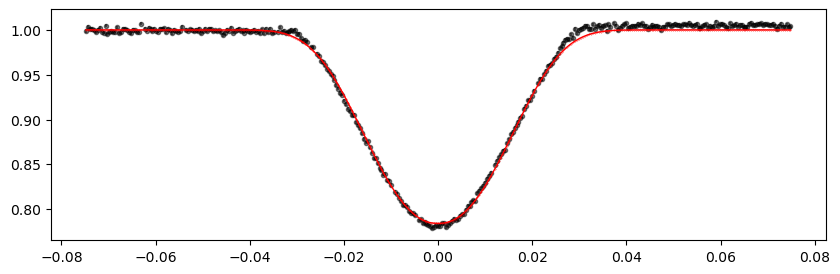

2029.852084 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1353.56it/s]


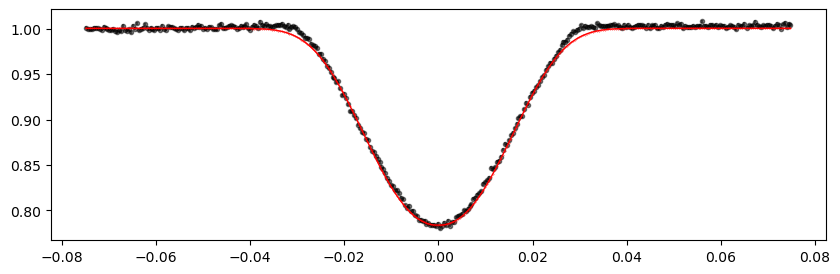

2033.1939080000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.04it/s]


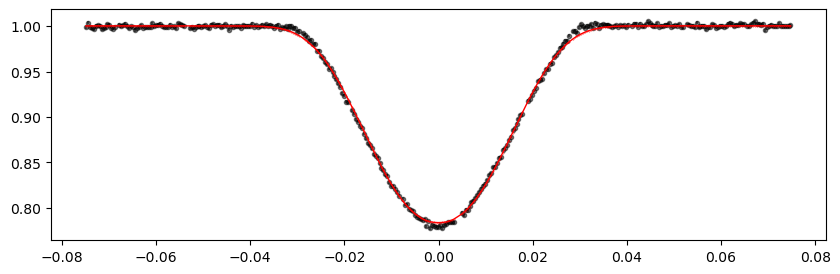

2390.769076 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.10it/s]


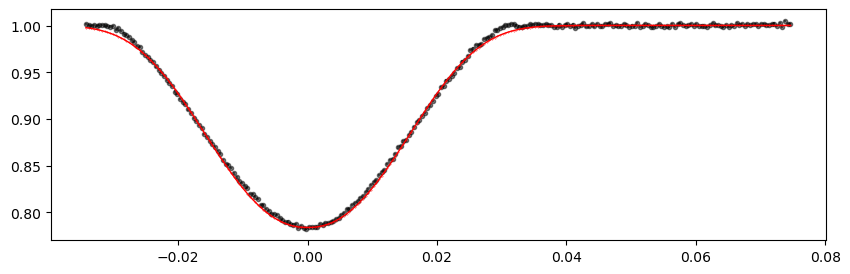

2394.1109 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1295.10it/s]


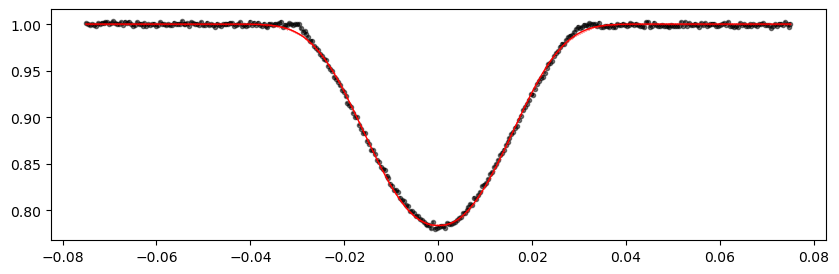

2397.452724 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1327.05it/s]


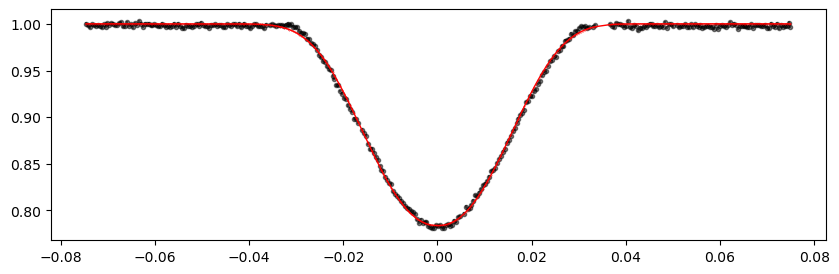

2400.794548 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.63it/s]


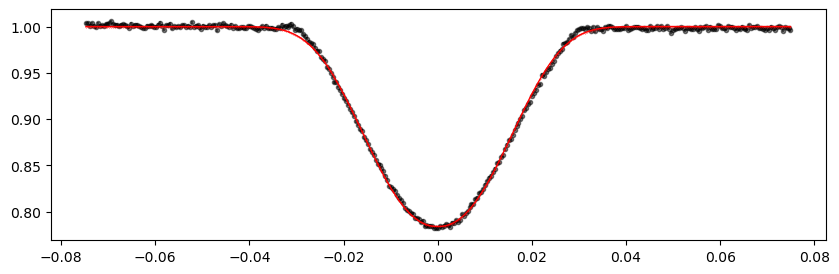

2404.136372 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1335.31it/s]


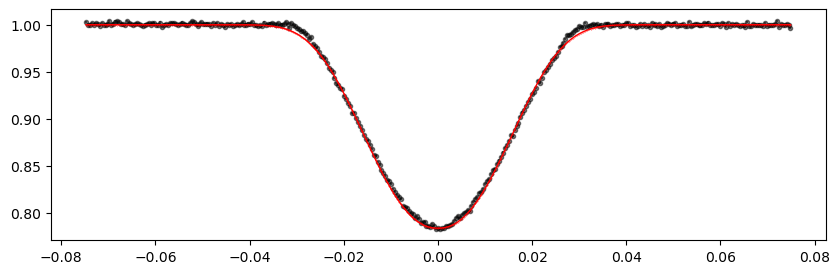

2407.478196 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.58it/s]


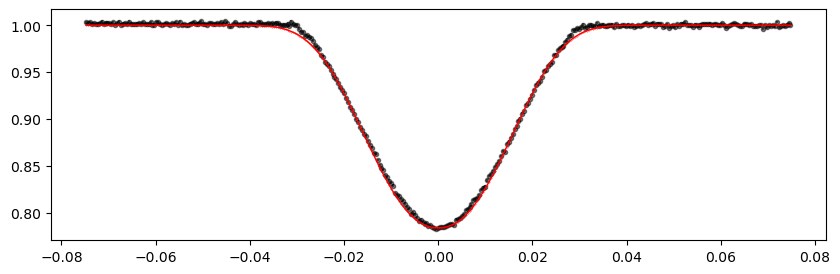

2410.82002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.33it/s]


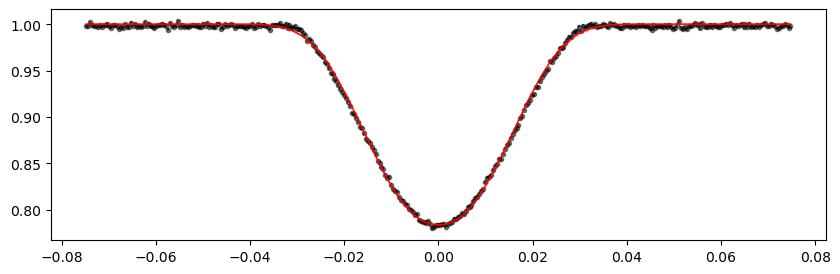

2414.161844 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.15it/s]


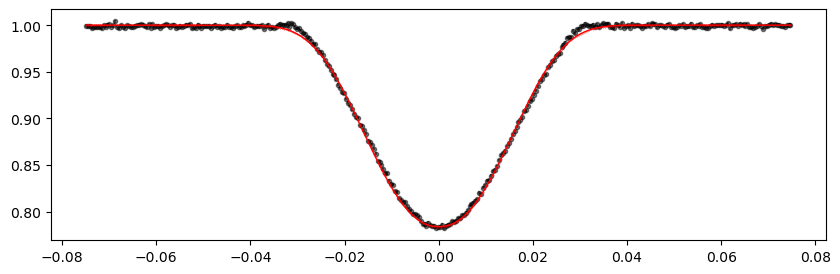

2417.5036680000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.64it/s]


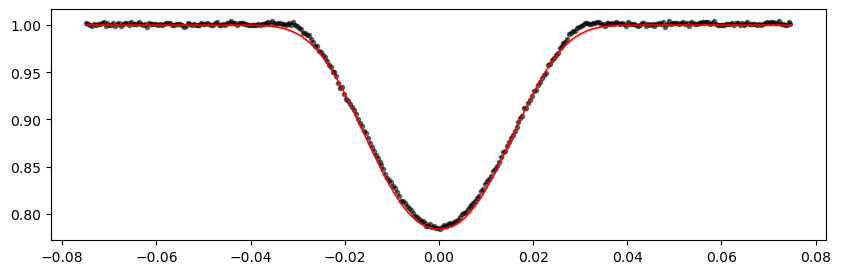

2420.8454920000004 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.46it/s]


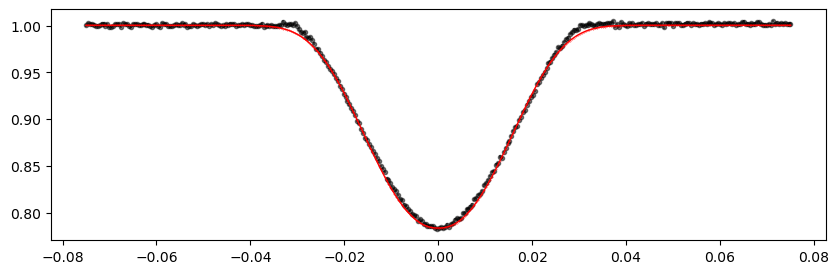

2424.187316 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.31it/s]


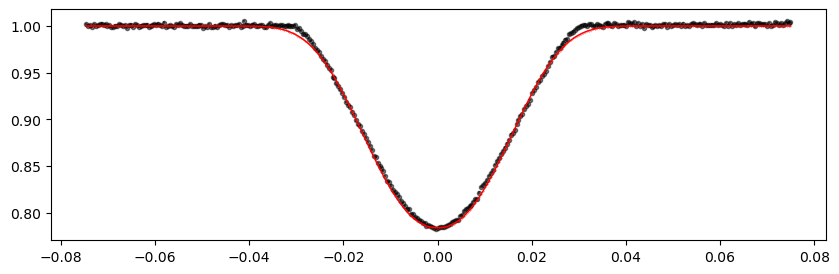

2427.52914 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.23it/s]


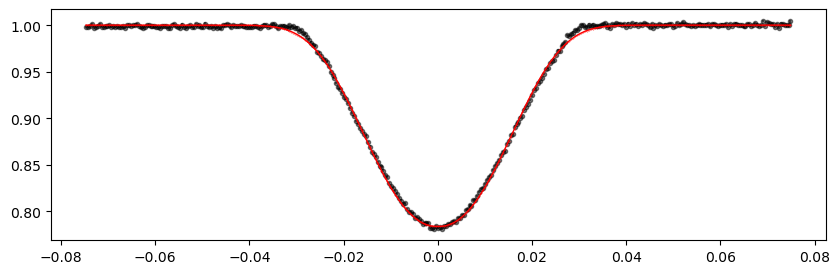

2430.870964 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.49it/s]


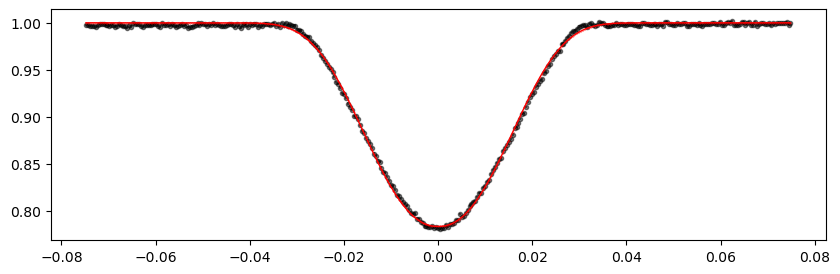

2434.2127880000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.19it/s]


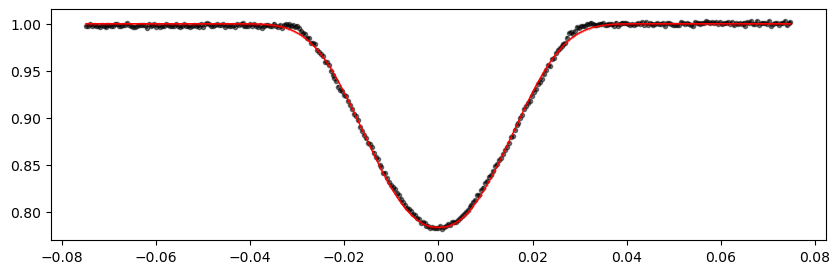

2437.554612 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.63it/s]


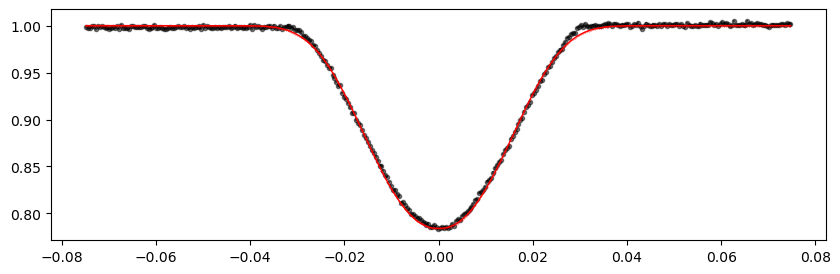

2440.896436 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.61it/s]


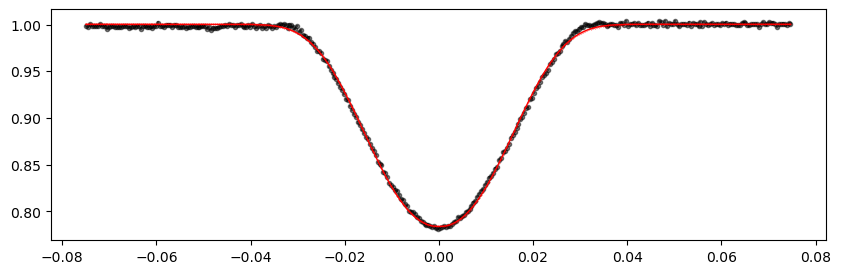

2444.23826 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1327.21it/s]


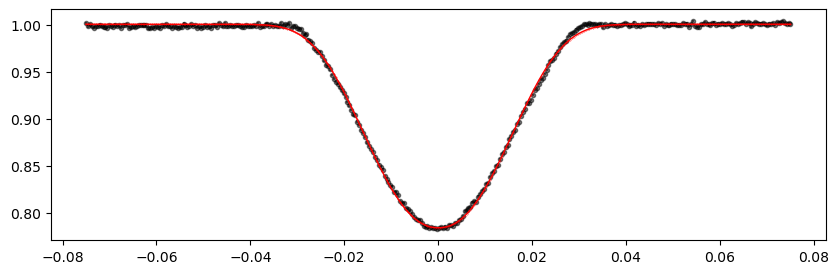

2581.253044 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.76it/s]


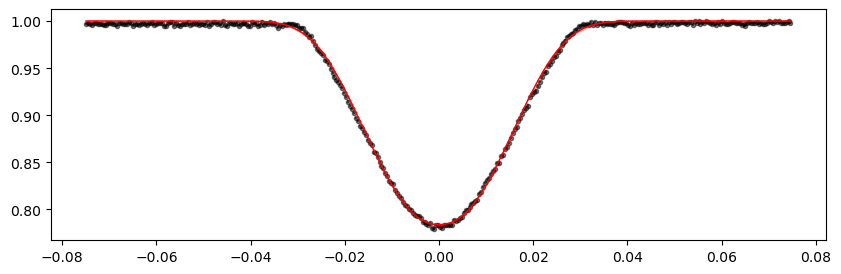

2584.594868 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.39it/s]


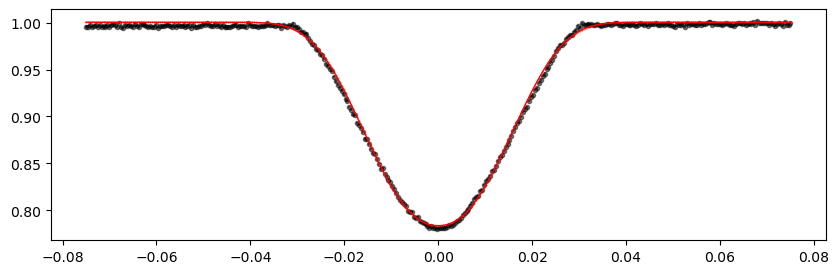

2587.936692 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.28it/s]


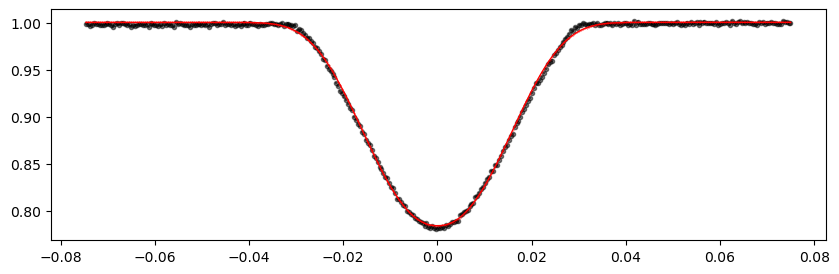

2591.2785160000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.55it/s]


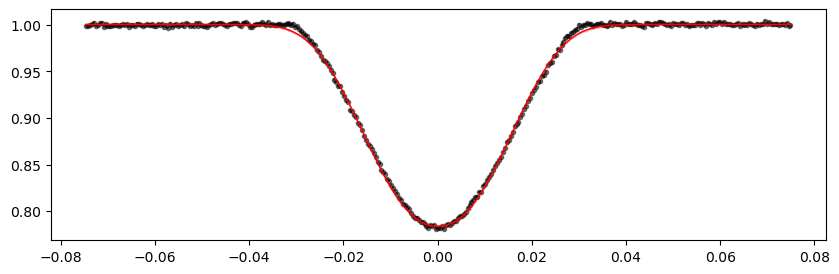

2597.962164 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.59it/s]


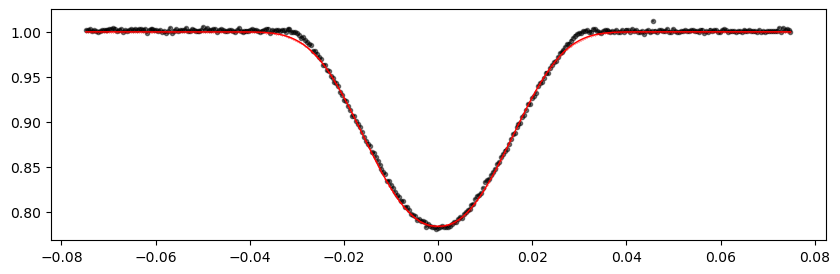

2601.303988 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1324.74it/s]


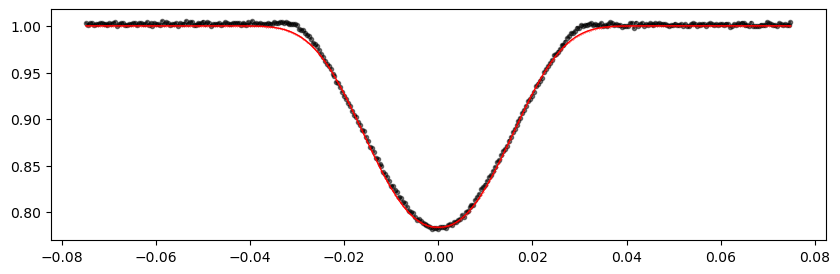

2604.645812 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1321.87it/s]


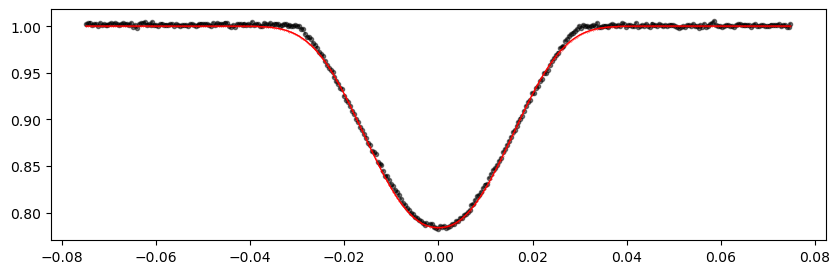

2611.32946 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.25it/s]


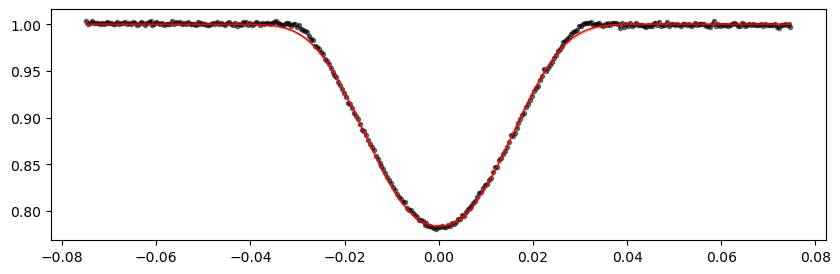

2614.671284 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.02it/s]


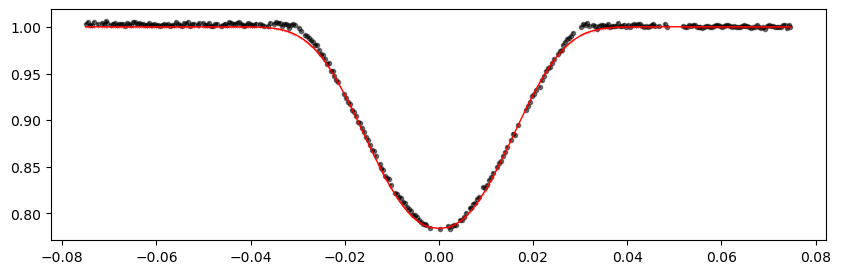

2618.013108 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.83it/s]


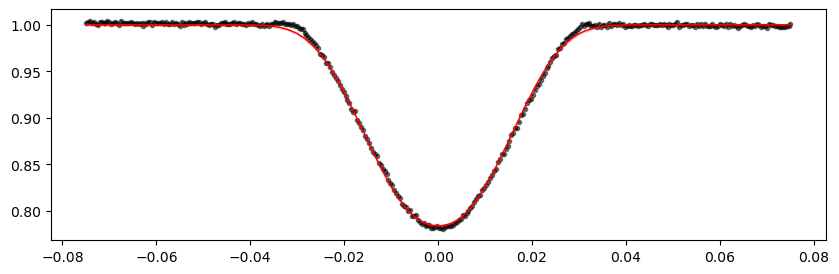

2621.354932 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.79it/s]


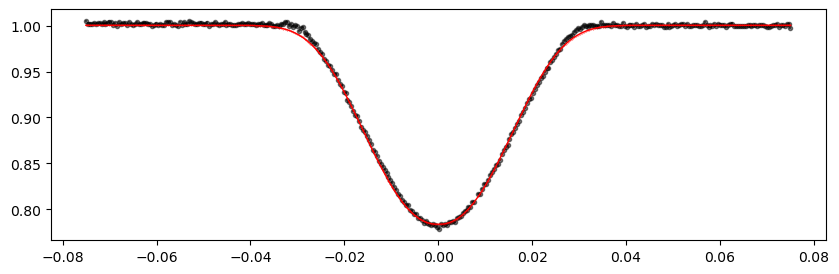

2628.0385800000004 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.70it/s]


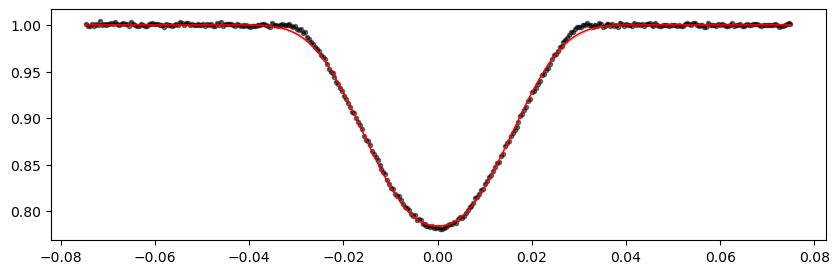

2631.380404 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.91it/s]


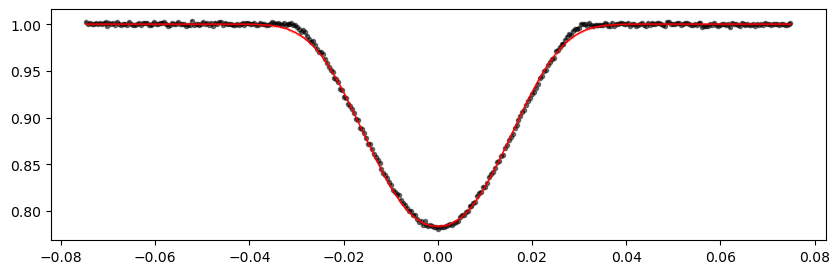

2634.722228 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.54it/s]


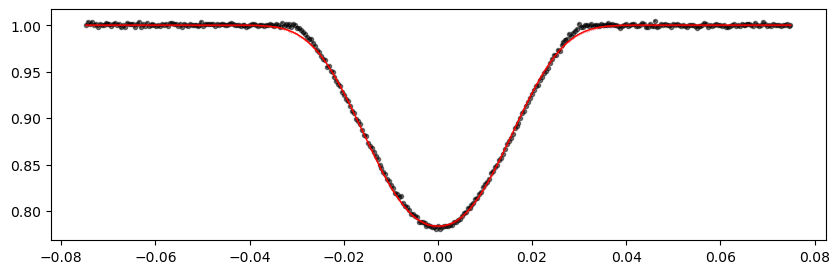

2641.4058760000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.89it/s]


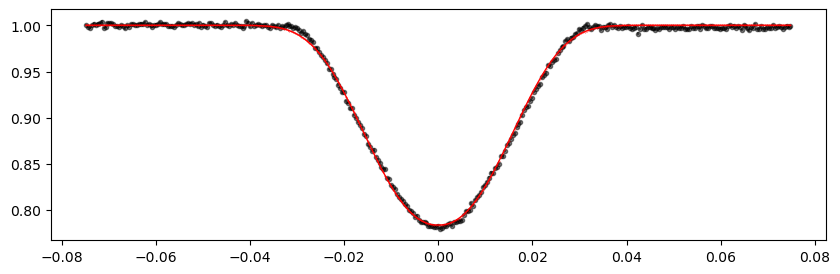

2644.7477 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.83it/s]


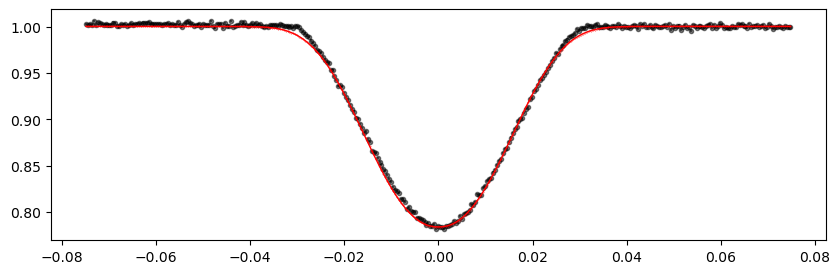

2648.089524 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.47it/s]


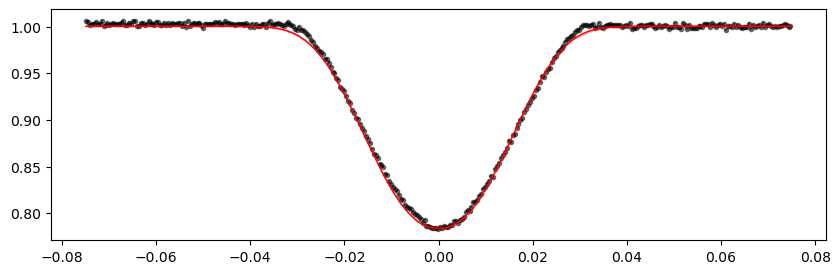

2658.1149960000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1377.02it/s]


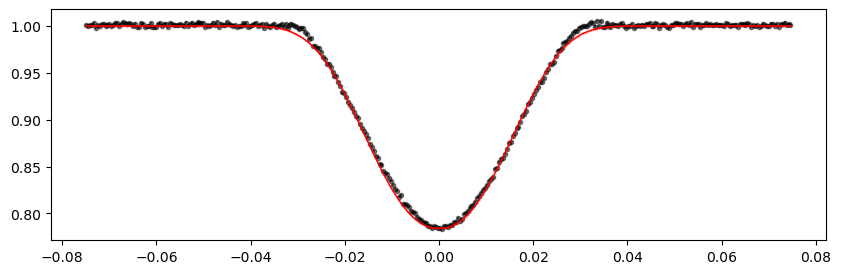

2661.4568200000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.20it/s]


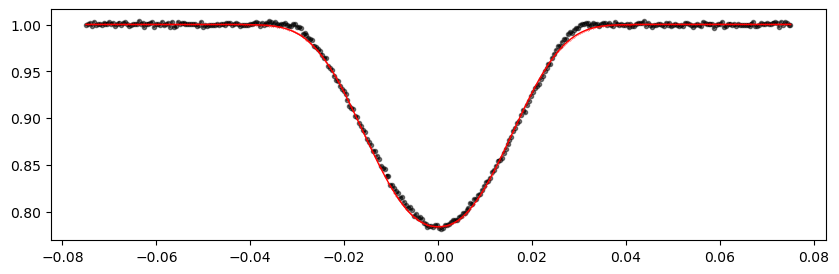

2671.482292 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.15it/s]


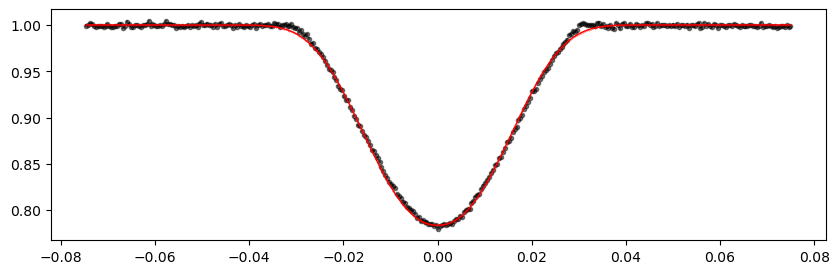

2674.8241160000002 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.73it/s]


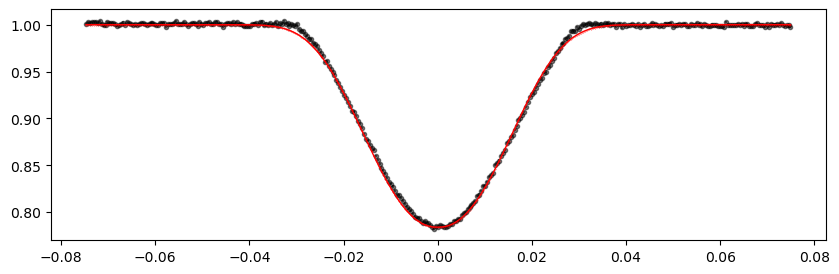

2678.16594 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.75it/s]


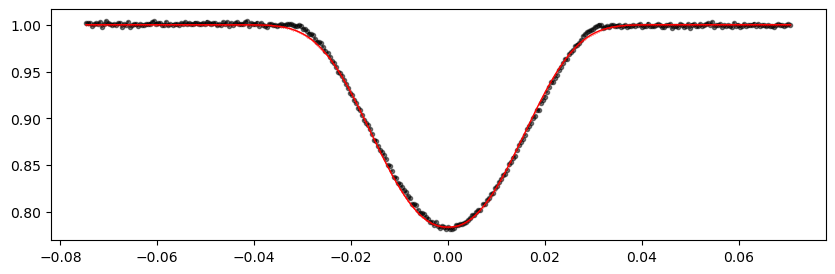

2684.849588 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.65it/s]


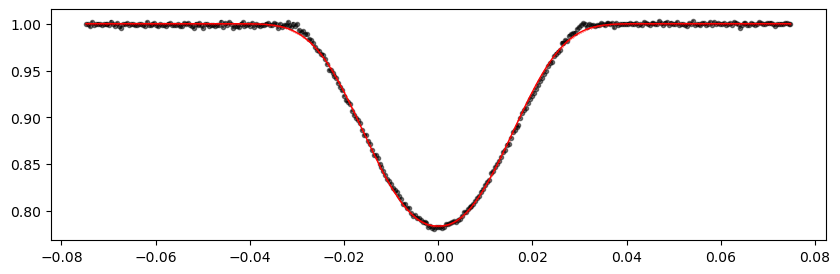

2688.191412 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.60it/s]


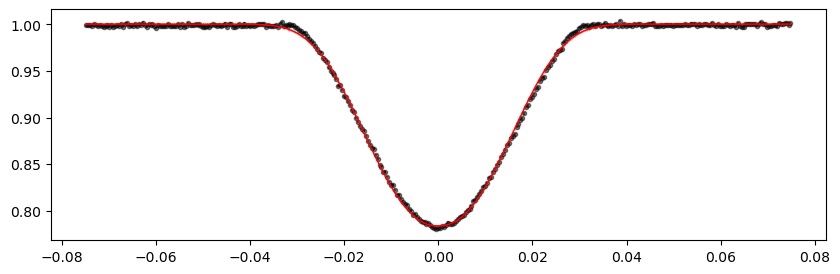

2691.533236 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.94it/s]


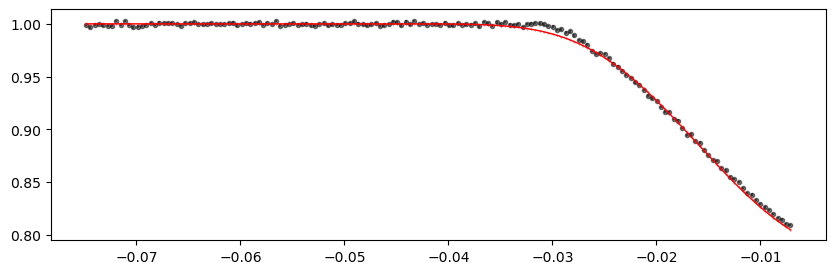

2698.2168840000004 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.58it/s]


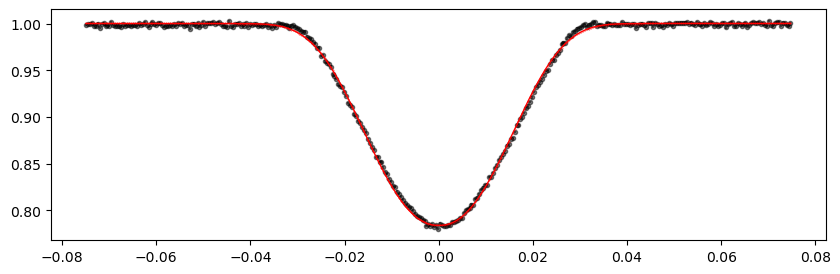

2701.558708 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.63it/s]


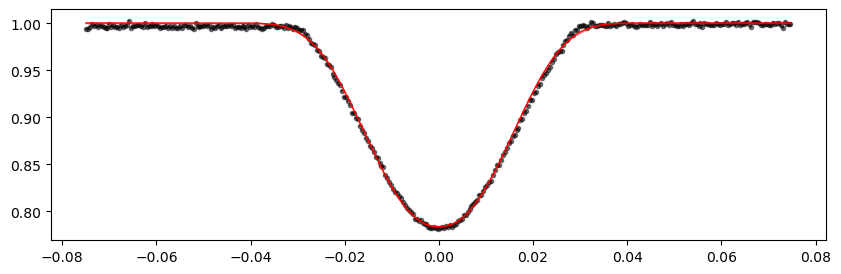

2704.900532 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.76it/s]


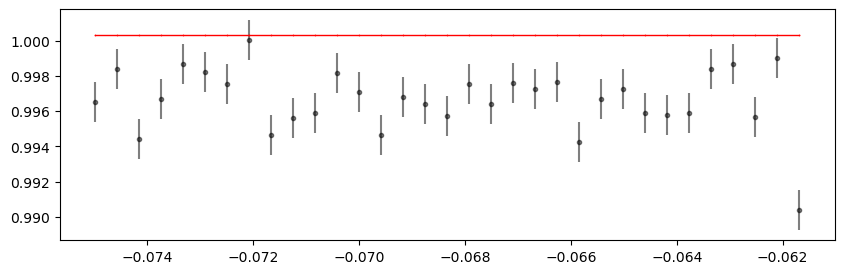

2711.58418 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.73it/s]


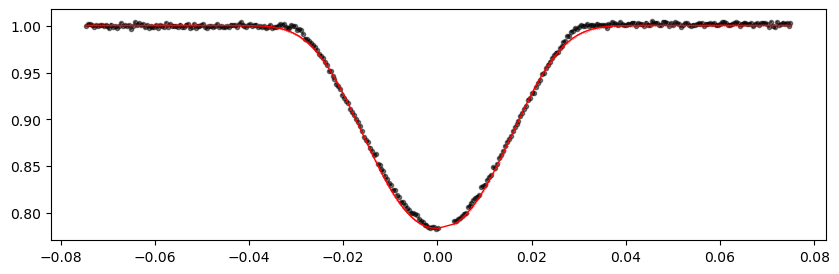

2714.926004 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1383.78it/s]


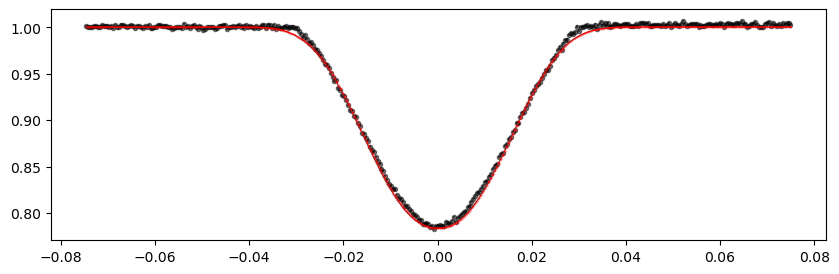

2724.951476 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.77it/s]


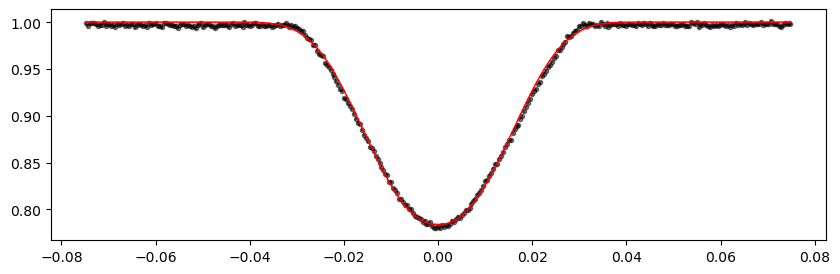

2728.2933000000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.96it/s]


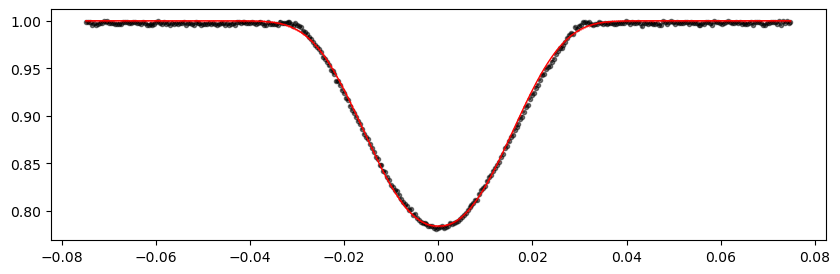

2731.6351240000004 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.58it/s]


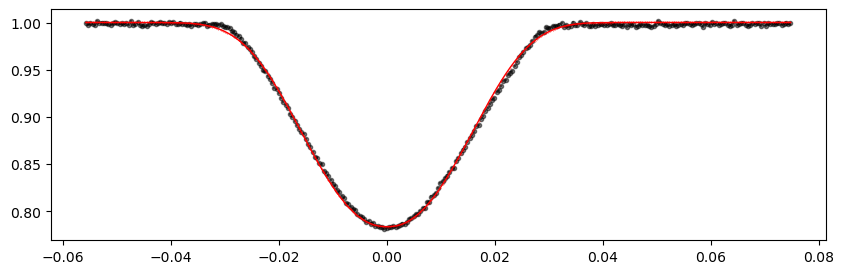

2738.318772 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.67it/s]


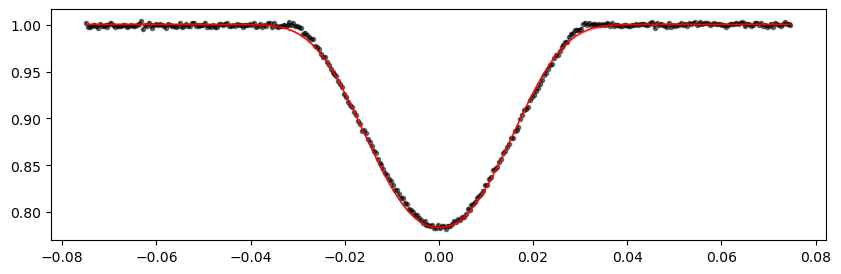

2741.660596 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1371.04it/s]


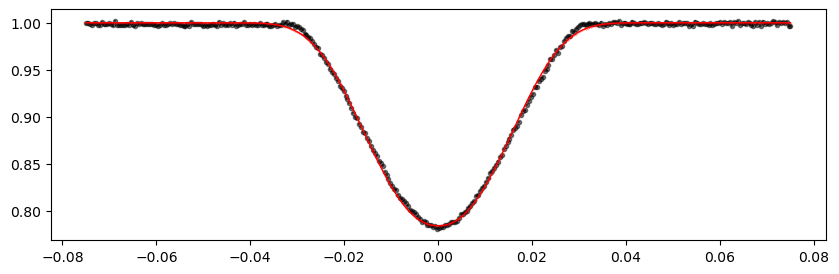

2771.737012 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.23it/s]


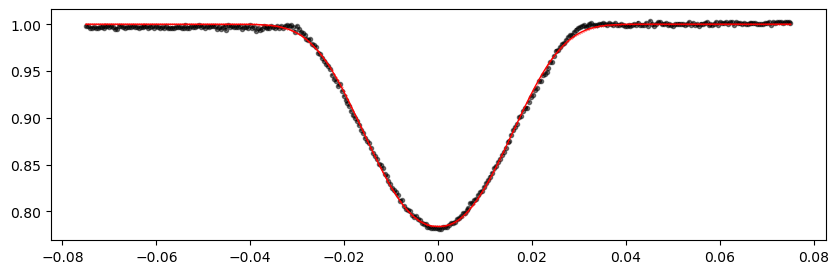

2775.078836 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1341.57it/s]


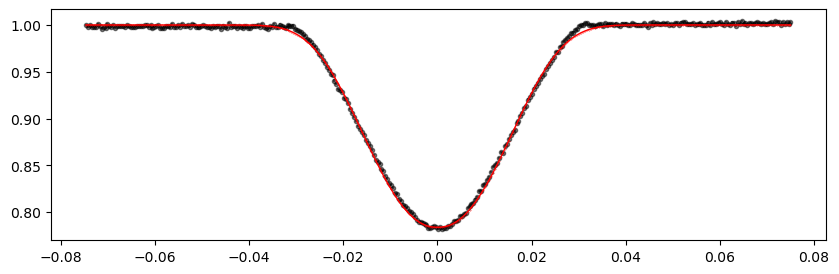

2778.42066 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.81it/s]


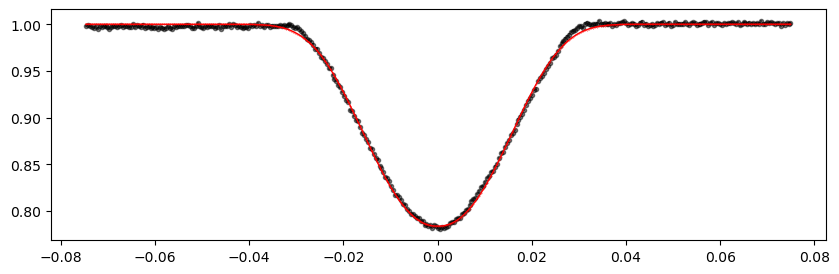

2781.762484 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.84it/s]


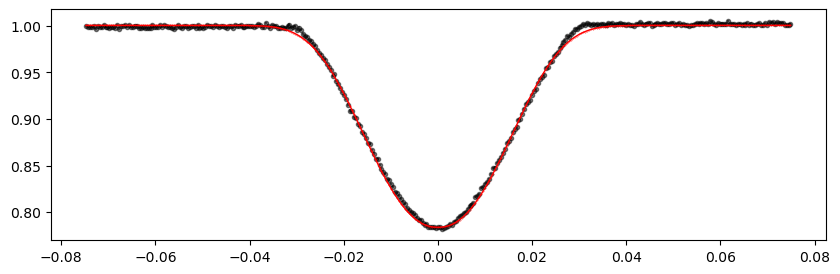

2785.104308 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1371.98it/s]


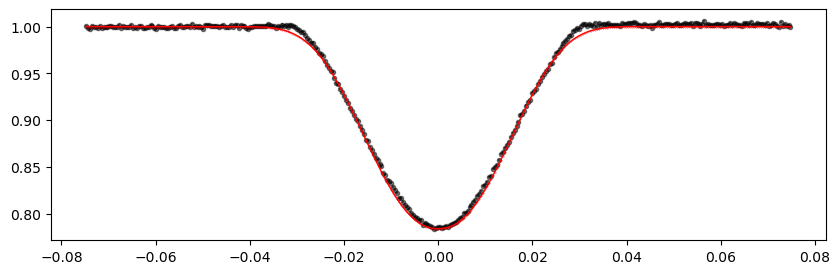

2788.446132 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.60it/s]


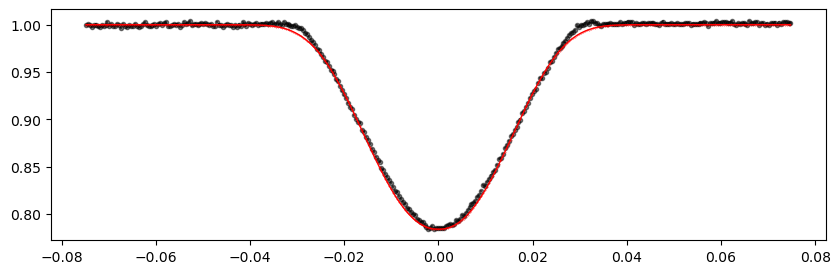

2791.787956 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.67it/s]


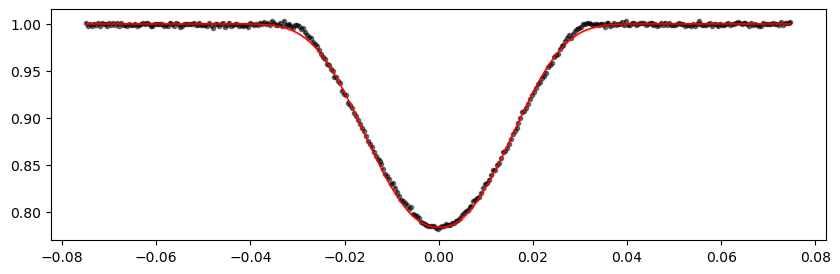

2795.12978 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.88it/s]


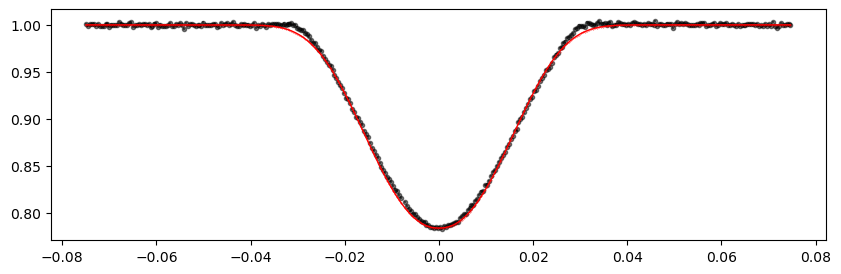

2798.4716040000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.82it/s]


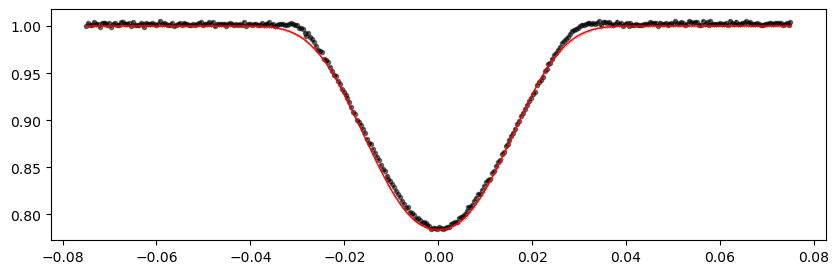

2801.8134280000004 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.69it/s]


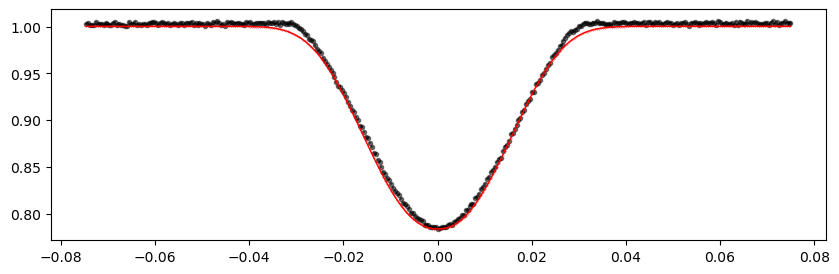

2805.155252 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.58it/s]


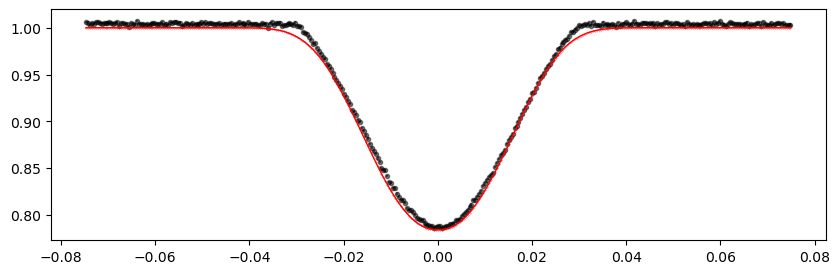

2808.497076 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1378.44it/s]


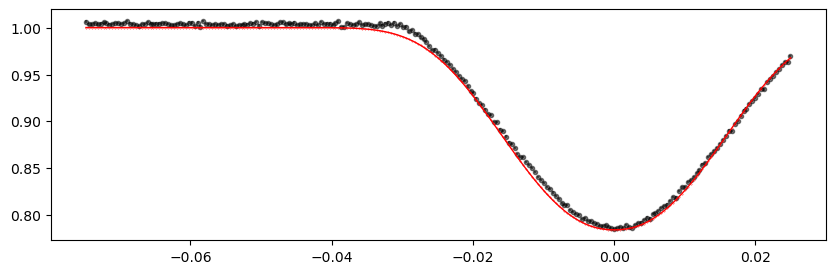

2811.8389 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.79it/s]


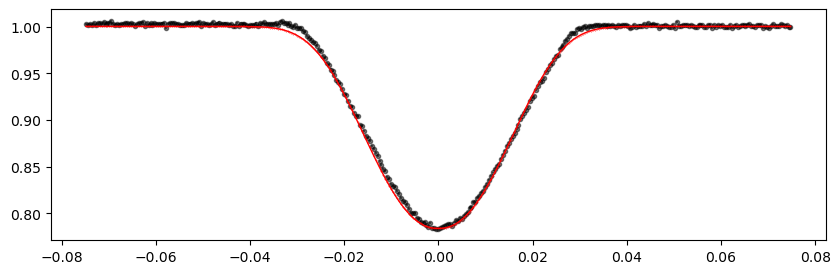

2815.180724 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1381.53it/s]


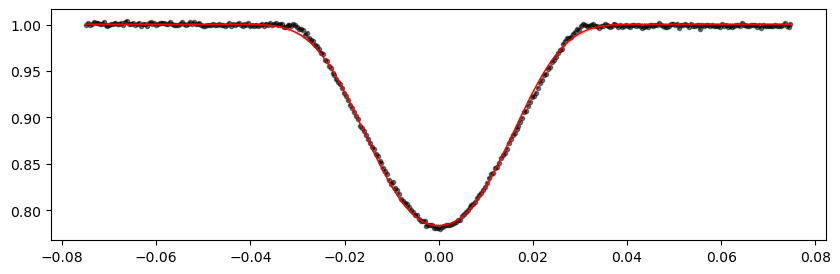

2818.522548 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.84it/s]


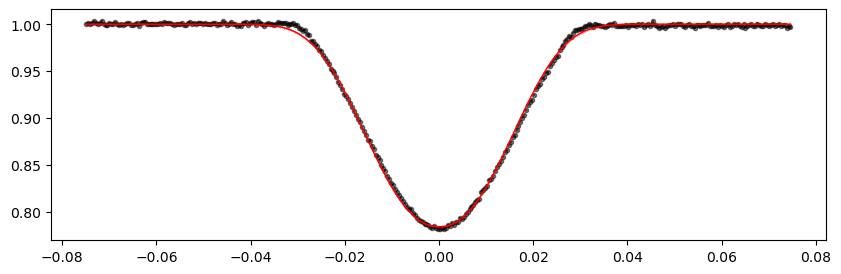

2821.864372 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.16it/s]


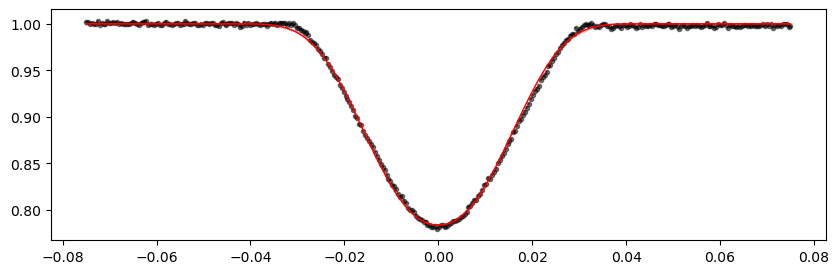

2825.206196 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.86it/s]


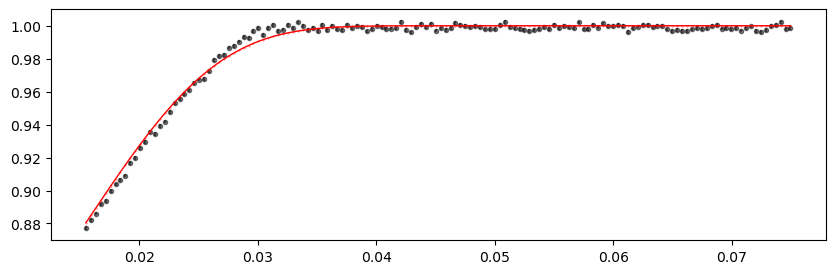

2828.54802 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.69it/s]


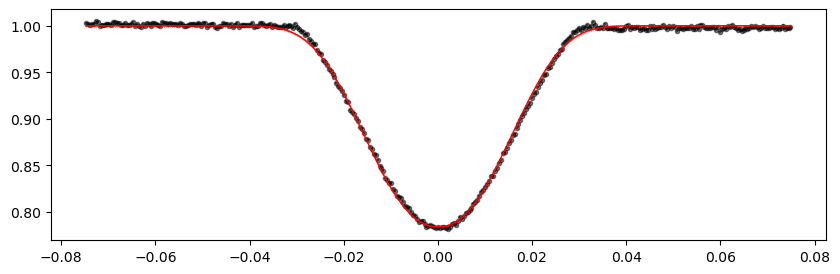

2831.8898440000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.21it/s]


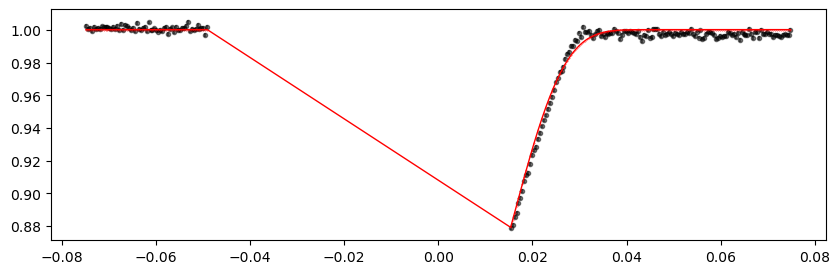

2835.2316680000004 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.77it/s]


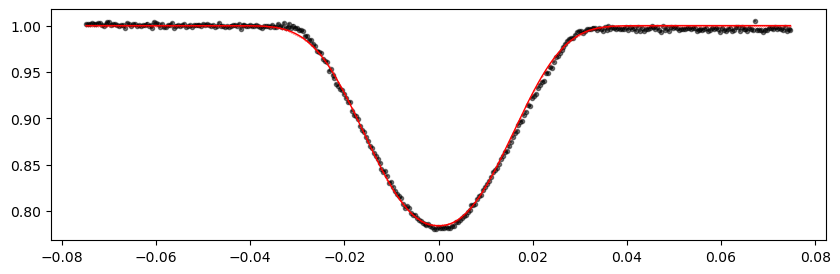

2838.5734920000004 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.74it/s]


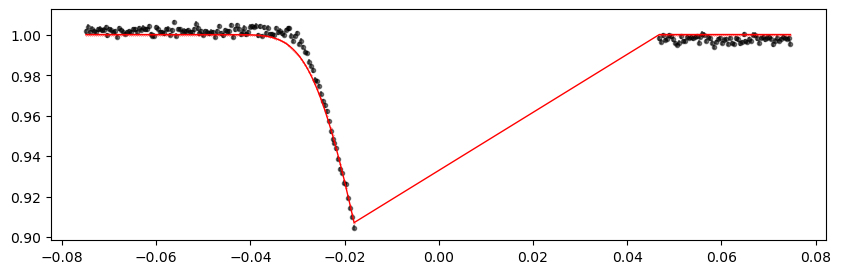

2841.915316 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1305.57it/s]


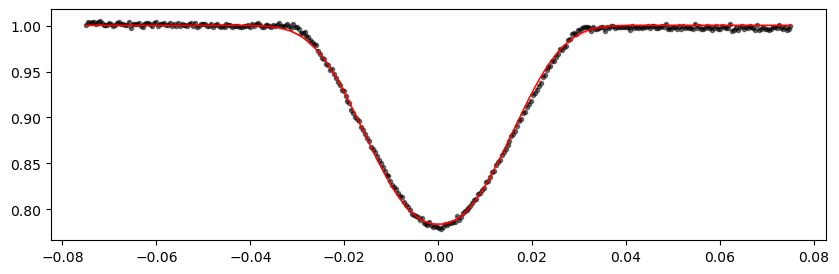

2845.25714 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1112.26it/s]


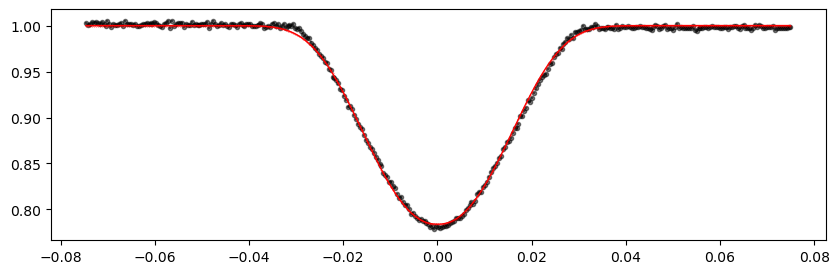

2848.598964 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|███████████████████████████████████████████████████████| 10000/10000 [00:10<00:00, 983.66it/s]


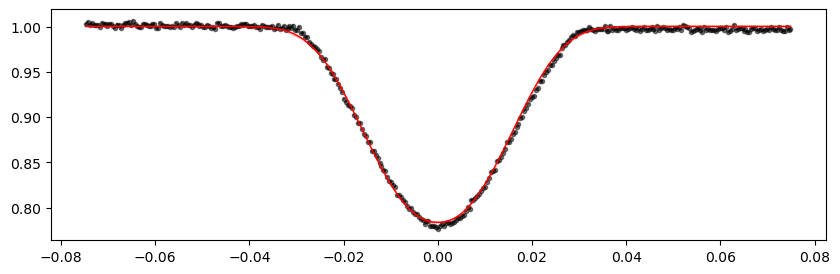

2851.940788 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:08<00:00, 1152.38it/s]


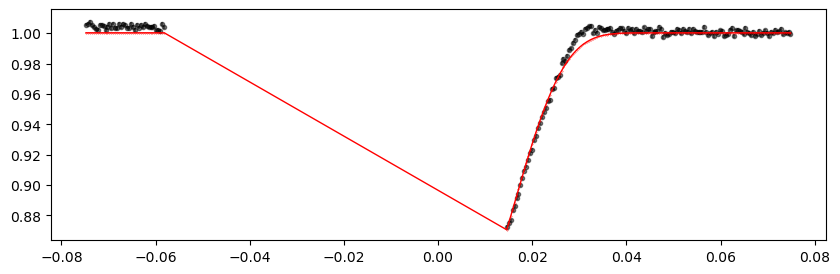

2855.282612 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.03it/s]


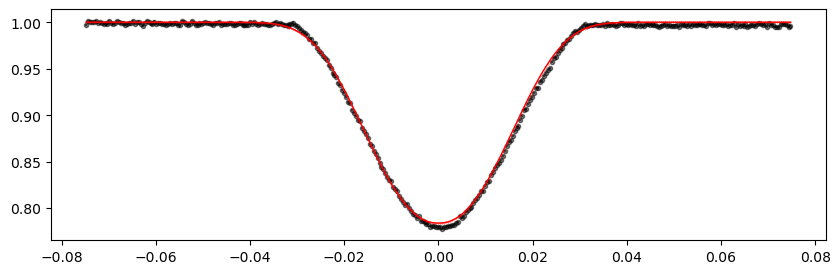

2858.624436 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.85it/s]


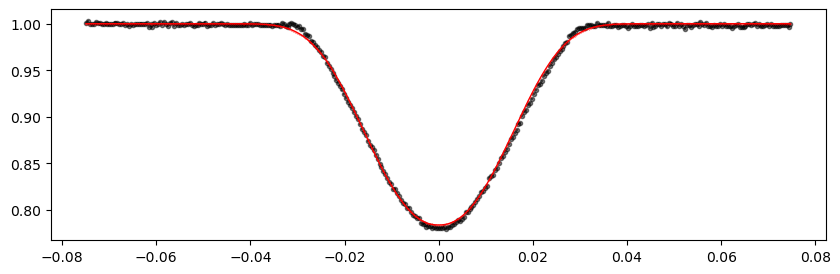

2861.96626 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.07it/s]


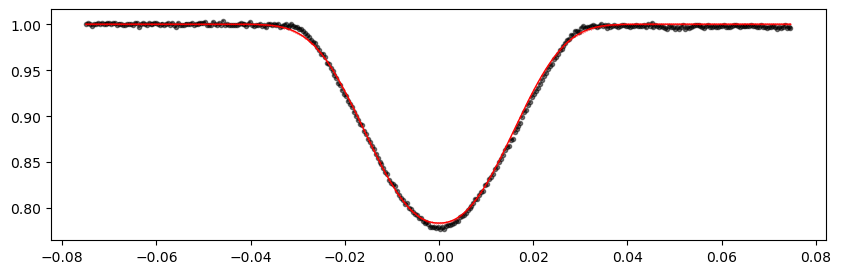

2868.6499080000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.68it/s]


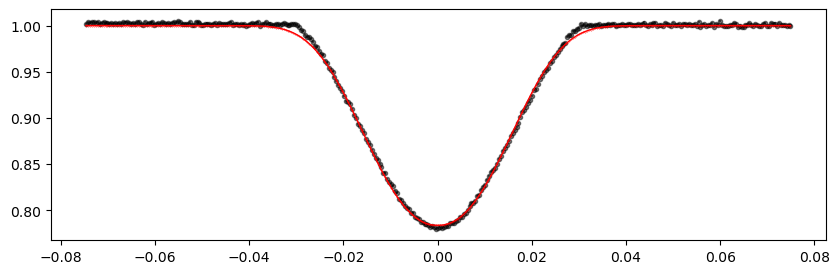

2871.9917320000004 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.07it/s]


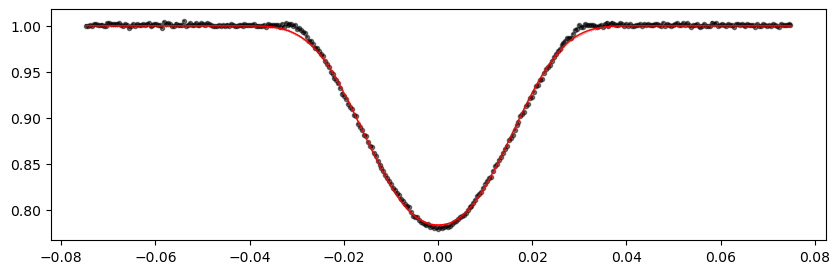

2875.333556 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.96it/s]


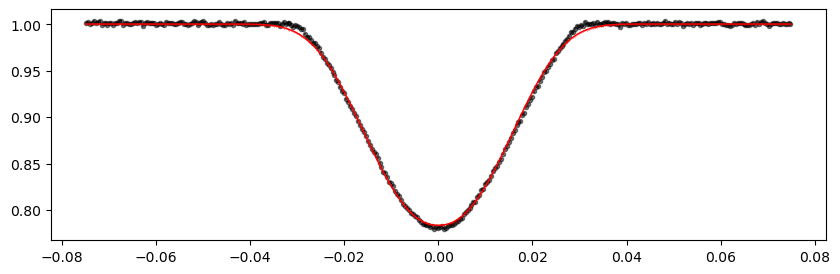

2878.67538 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.49it/s]


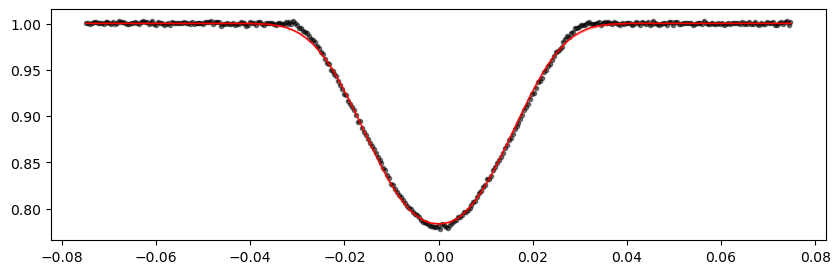

2882.017204 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.04it/s]


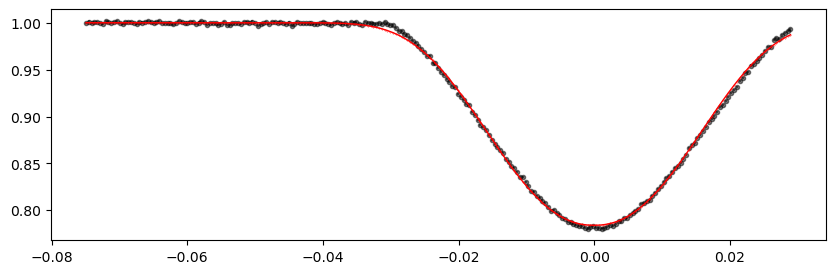

2885.359028 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.98it/s]


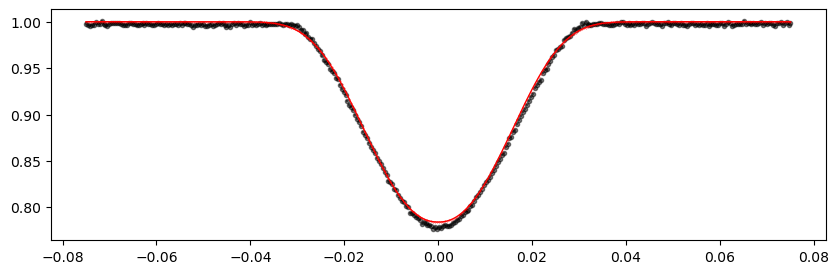

2888.700852 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.04it/s]


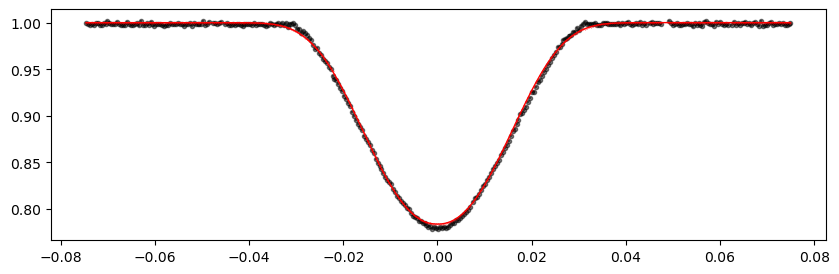

2892.042676 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.76it/s]


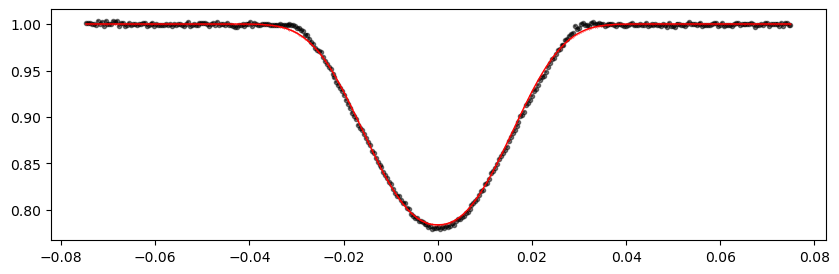

2895.3845 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.80it/s]


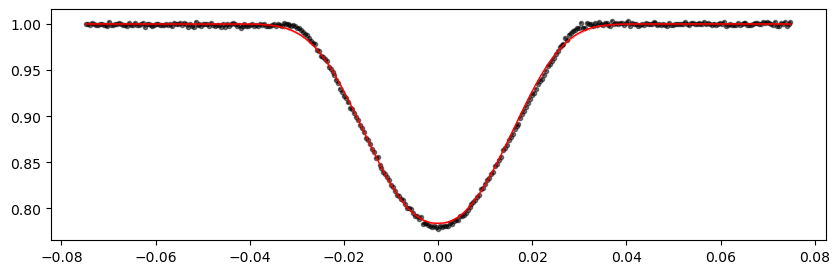

2898.726324 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1368.82it/s]


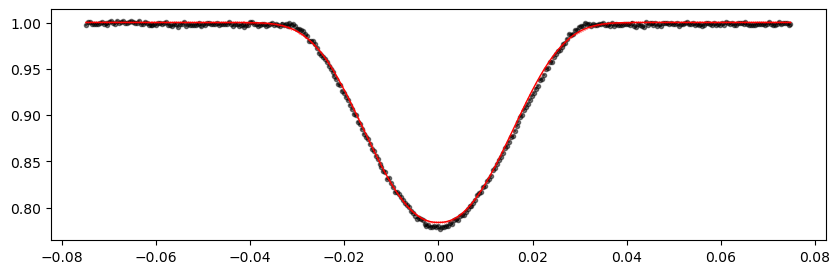

2902.0681480000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.08it/s]


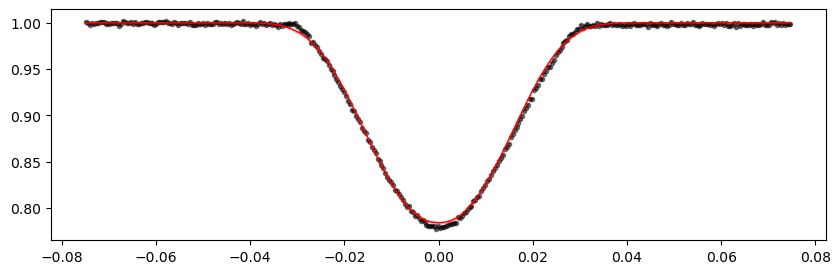

2905.4099720000004 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.85it/s]


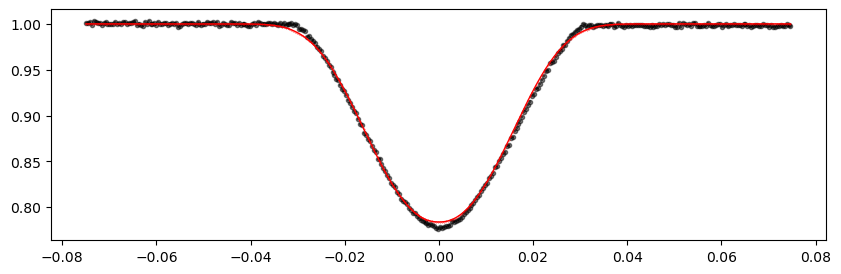

2908.751796 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.83it/s]


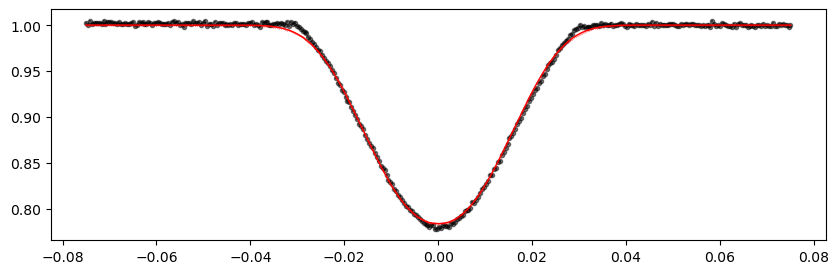

2912.09362 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.23it/s]


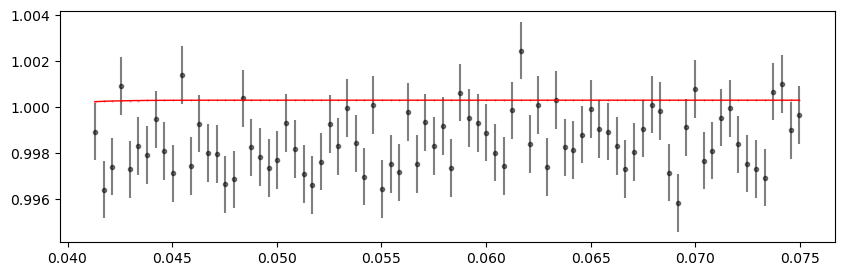

2915.435444 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.51it/s]


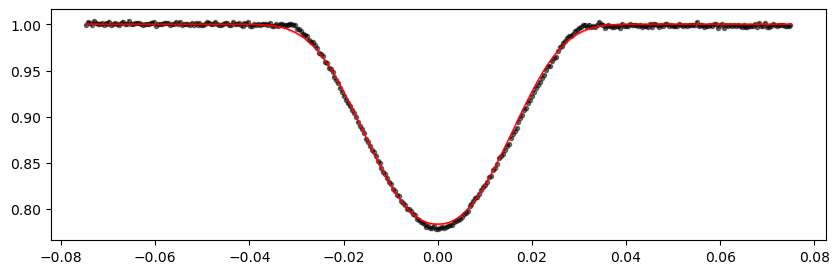

2918.777268 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.65it/s]


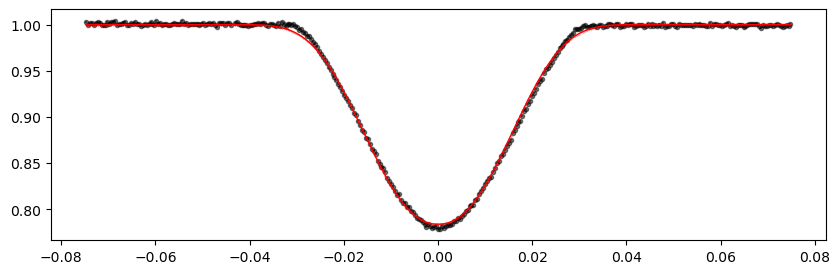

2922.119092 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.89it/s]


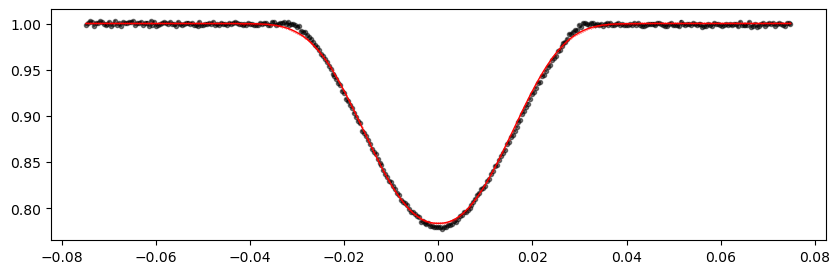

2928.80274 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1387.63it/s]


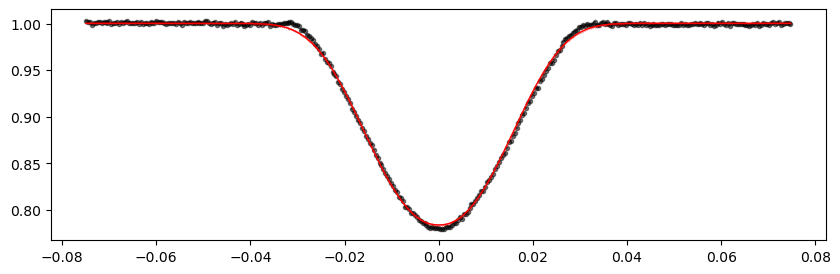

2932.144564 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1376.97it/s]


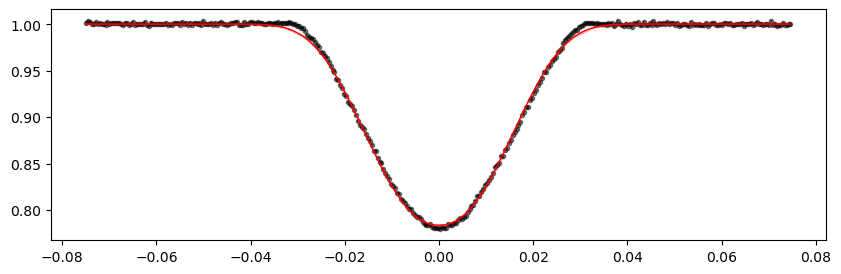

2935.4863880000003 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.63it/s]


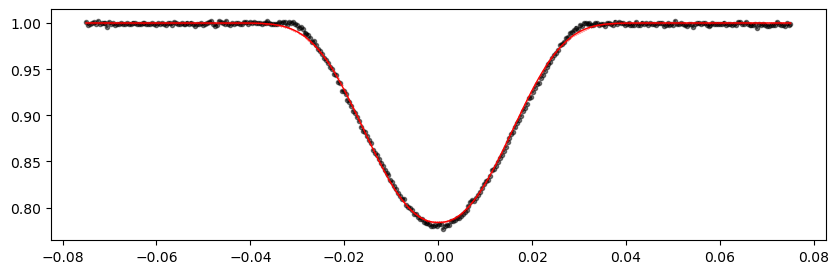

2942.1700360000004 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.92it/s]


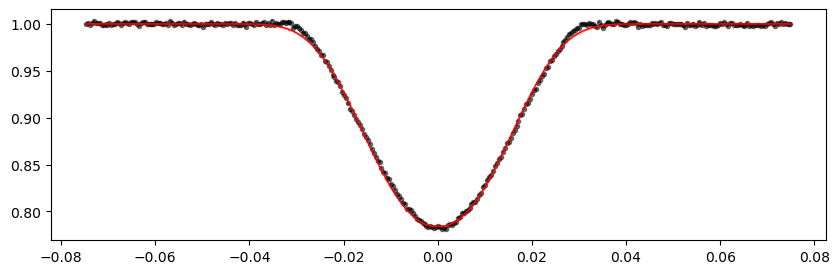

2945.51186 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.02it/s]


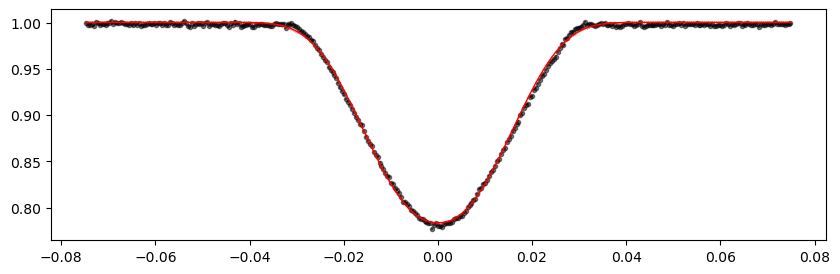

2948.853684 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.25it/s]


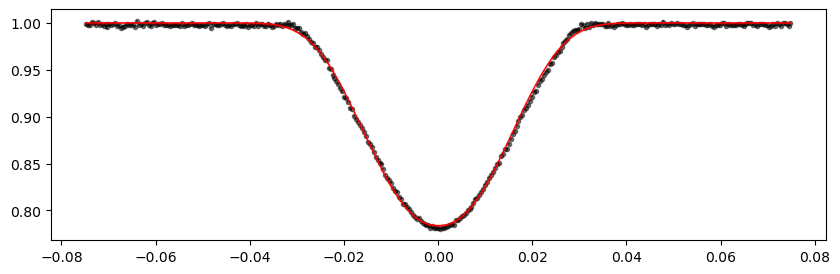

2955.537332 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.67it/s]


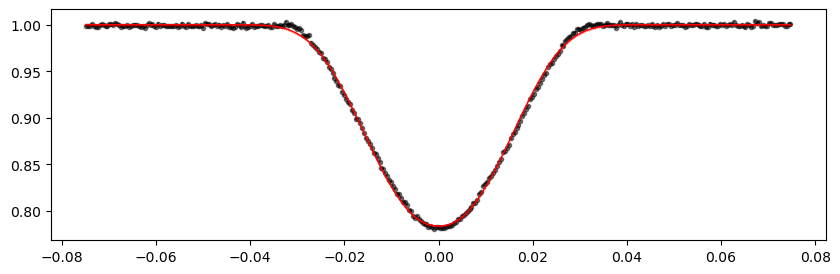

2958.879156 1.00029733877068 -0.21644068259987398 0.4084573204559342


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.30it/s]


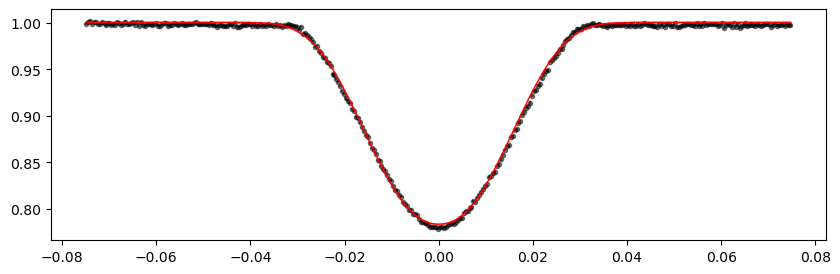

In [27]:
%matplotlib inline

print("Fitting individual primary eclipses...")
etv_functions.fit_each_eclipse(data_primary, n_transits, t0_primary, period, mean_alpha0, mean_alpha1, mean_t0, mean_d, mean_Tau, outfile_path)
!$NOTIFY_CMD "Individual primary eclipses fit done"

Fitting individual secondary eclipses...
Creating new manifest file
1683.9733 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


  0%|                                                                    | 0/10000 [00:00<?, ?it/s]C:\pkg\_winNonPortables\miniforge3\envs\my_lk_plus\lib\site-packages\emcee\moves\red_blue.py:99: RuntimeWarning: invalid value encountered in scalar subtract
  lnpdiff = f + nlp - state.log_prob[j]
100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.72it/s]


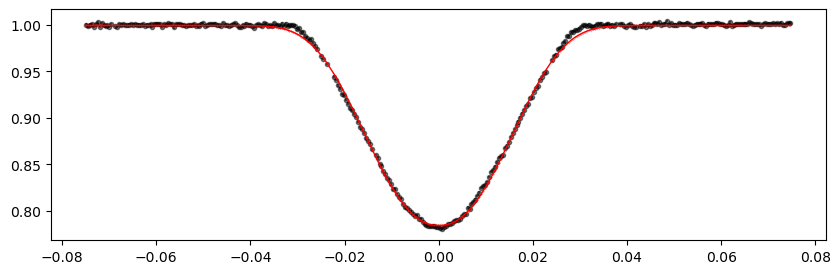

1687.3151240000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.86it/s]


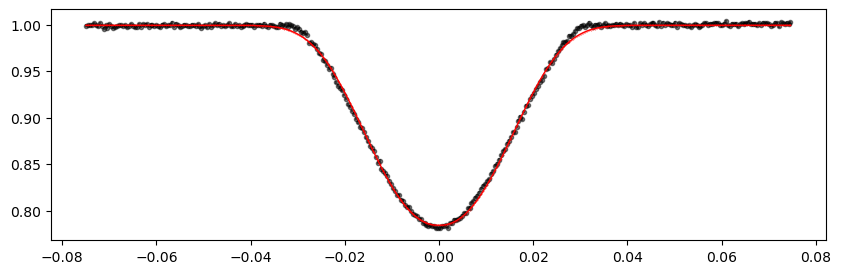

1690.656948 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1330.73it/s]


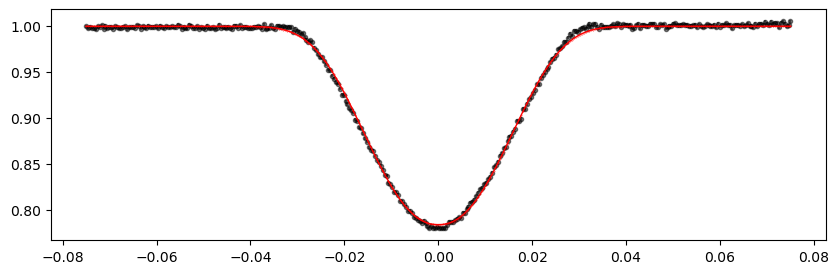

1697.340596 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.65it/s]


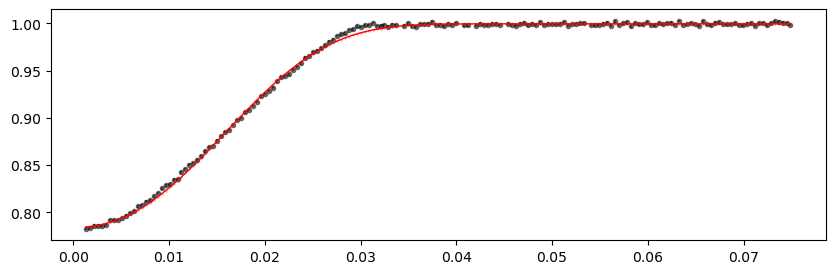

1700.68242 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.37it/s]


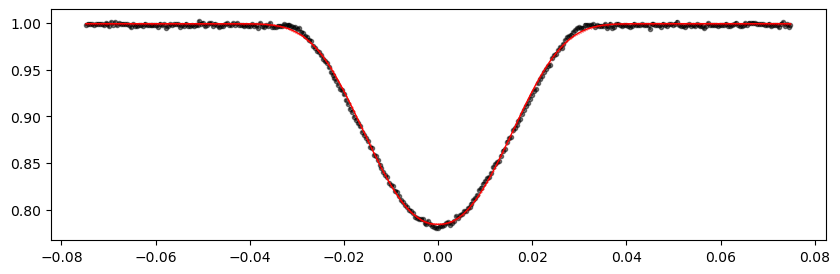

1704.0242440000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.10it/s]


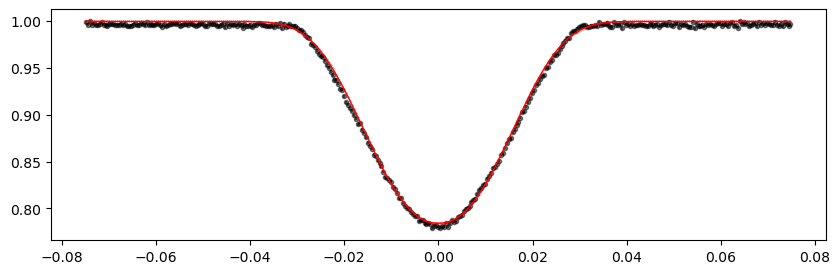

1714.0497160000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.67it/s]


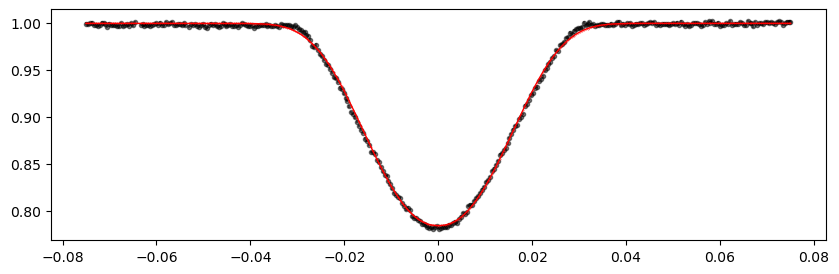

1717.39154 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.64it/s]


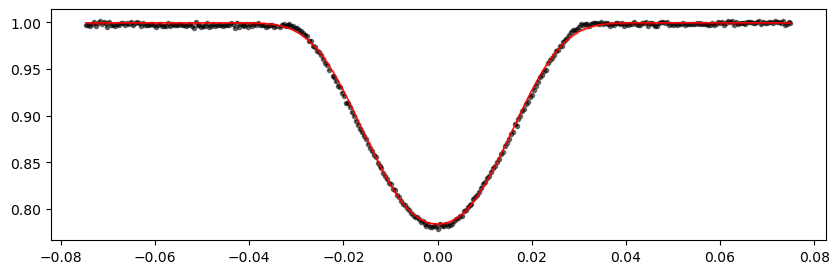

1720.7333640000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.39it/s]


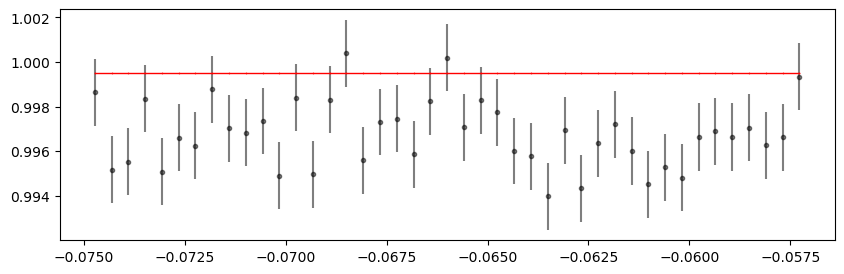

1727.417012 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.94it/s]


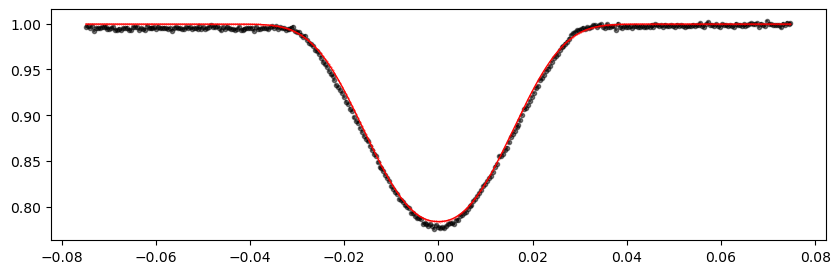

1730.7588360000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.02it/s]


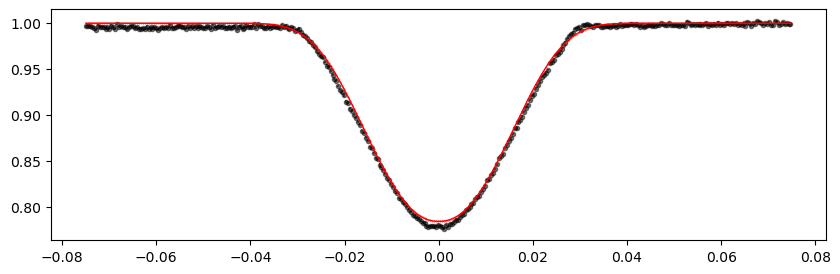

1734.10066 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.08it/s]


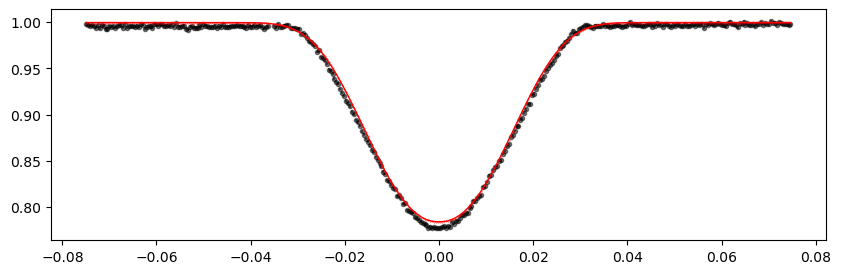

1740.784308 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1350.45it/s]


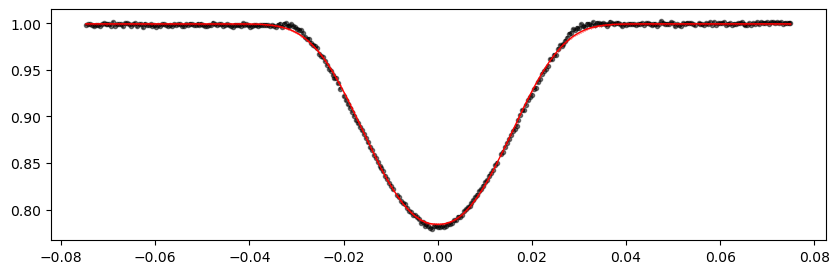

1744.126132 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.31it/s]


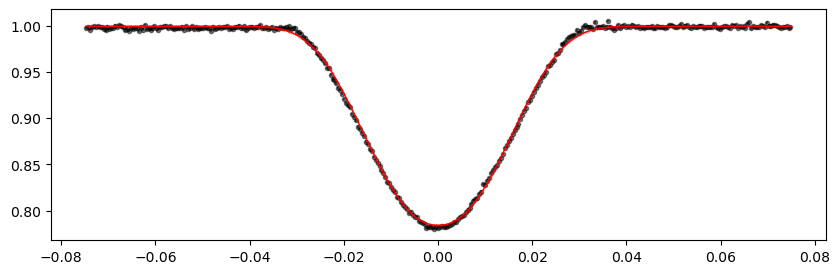

1747.4679560000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1337.27it/s]


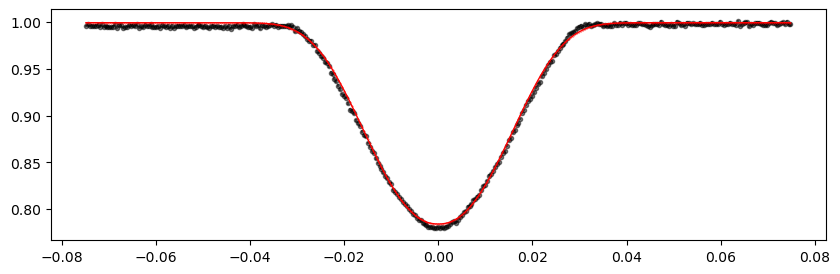

1754.1516040000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.73it/s]


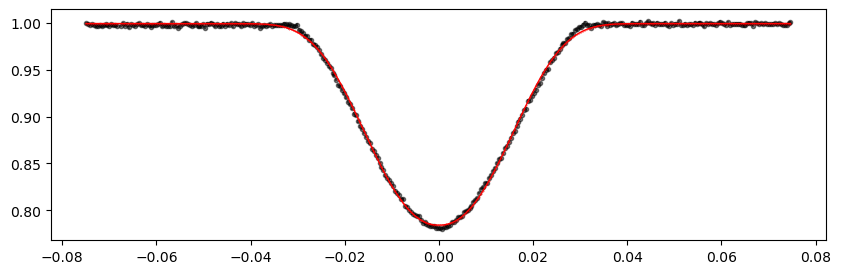

1757.4934280000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.04it/s]


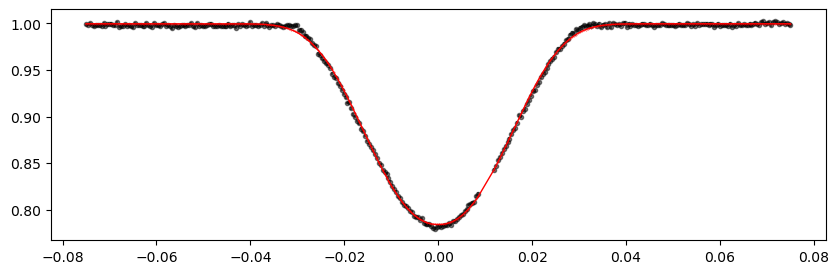

1760.835252 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.04it/s]


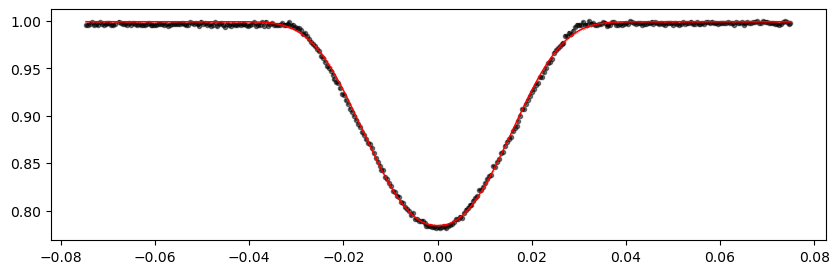

1767.5189 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.18it/s]


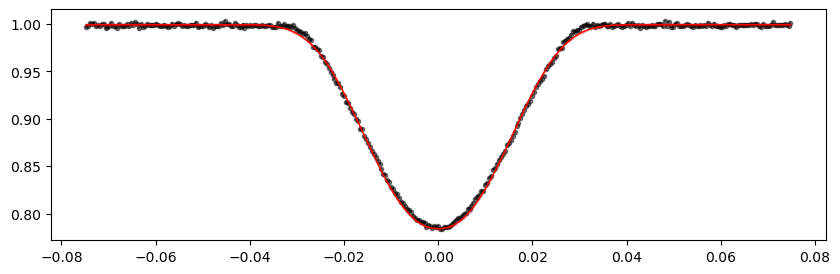

1770.8607240000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.14it/s]


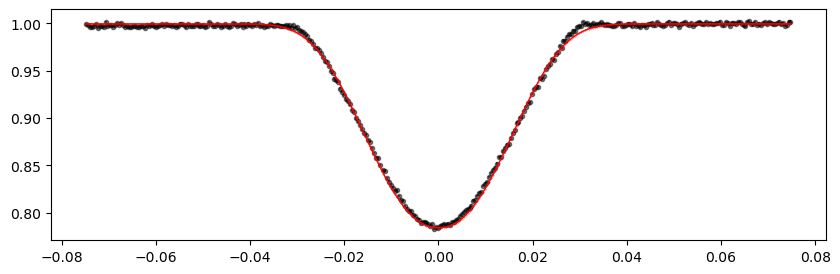

1774.2025480000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.57it/s]


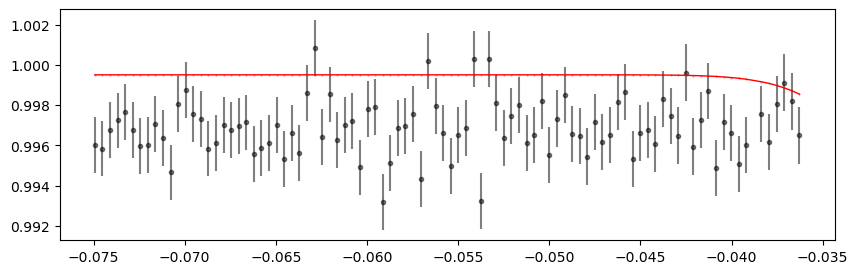

1777.544372 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.23it/s]


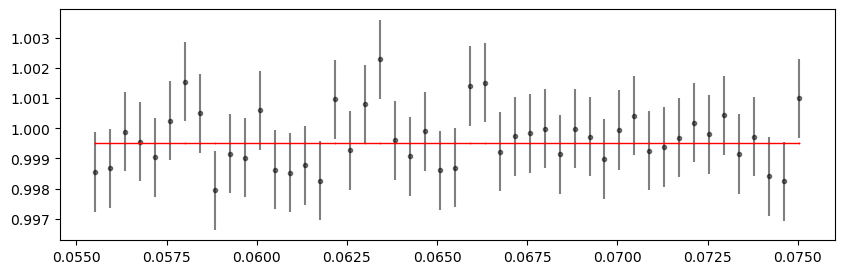

1780.8861960000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.56it/s]


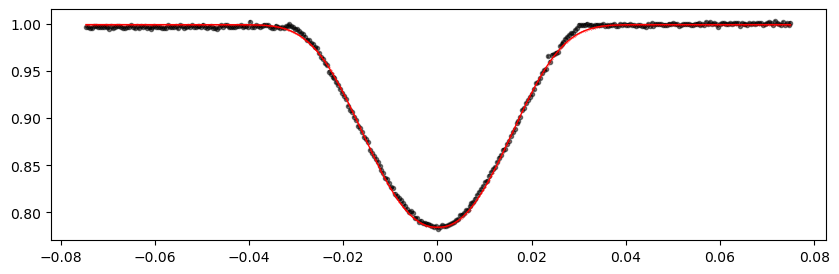

1784.22802 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.18it/s]


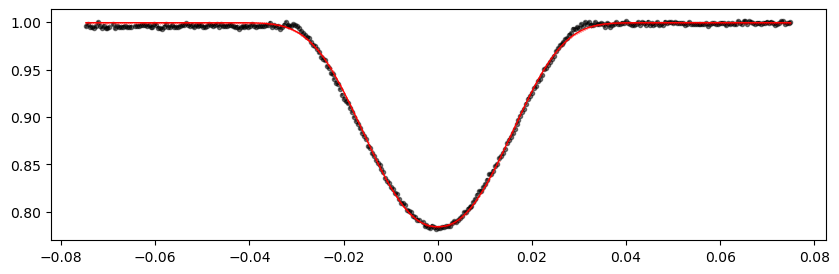

1787.569844 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1339.86it/s]


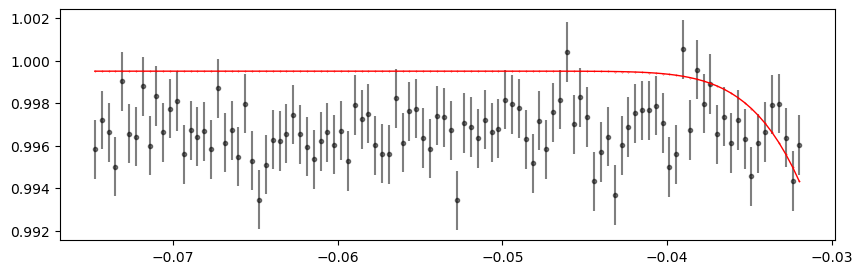

1790.9116680000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1332.21it/s]


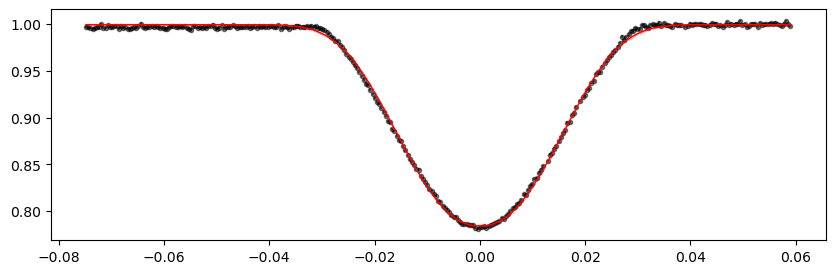

1794.253492 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.09it/s]


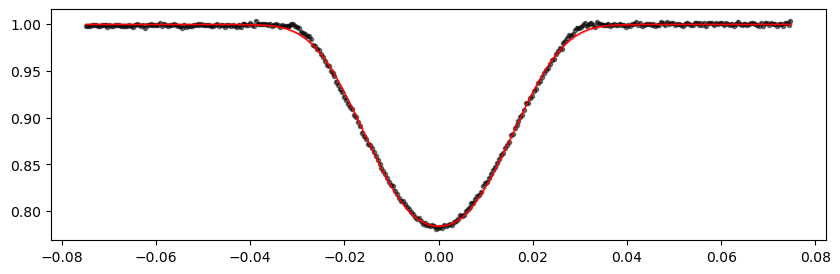

1797.5953160000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1359.74it/s]


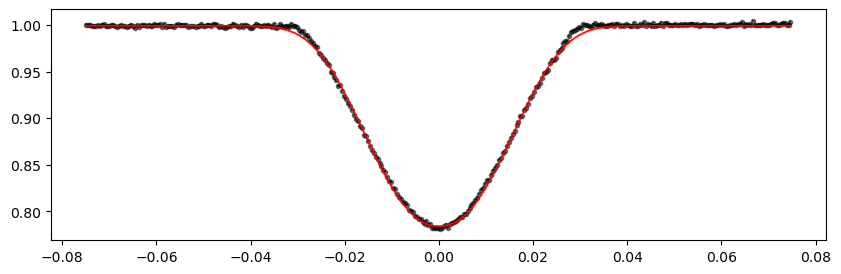

1800.93714 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.35it/s]


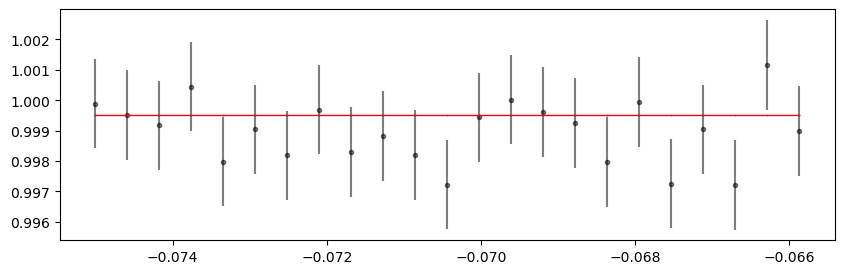

1804.278964 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.75it/s]


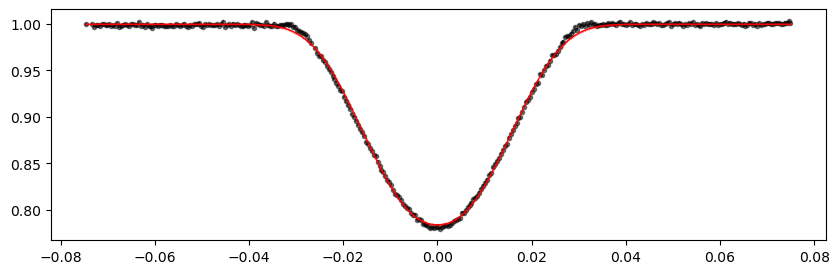

1807.6207880000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.81it/s]


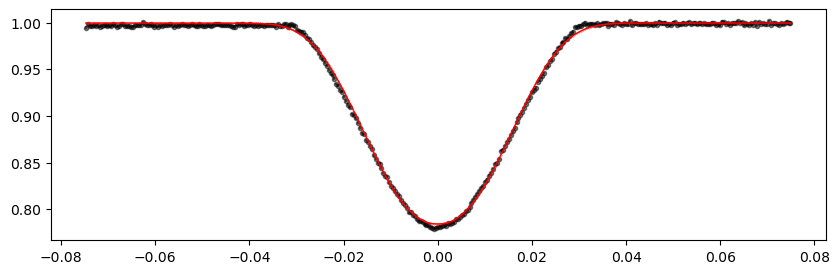

1810.962612 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.16it/s]


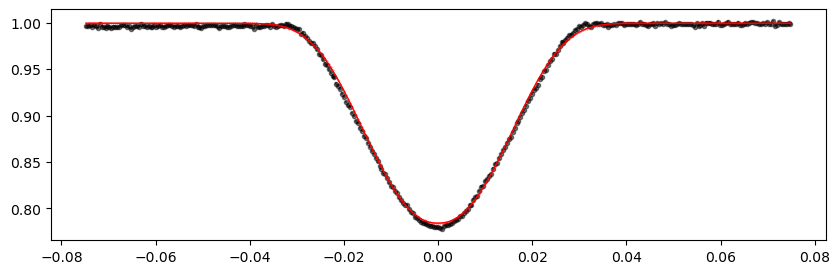

1817.64626 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.86it/s]


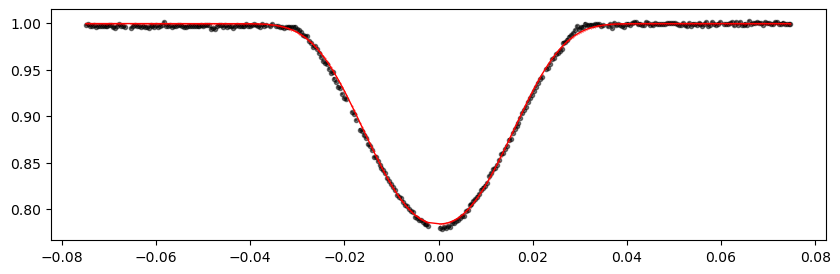

1820.988084 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.02it/s]


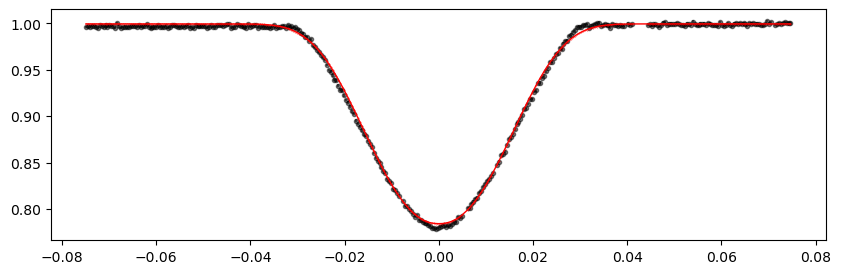

1824.3299080000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.01it/s]


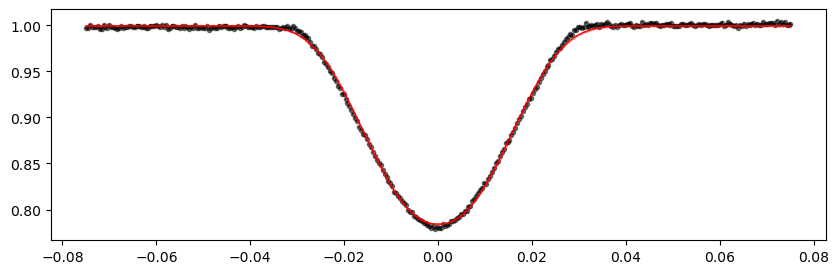

1827.671732 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.95it/s]


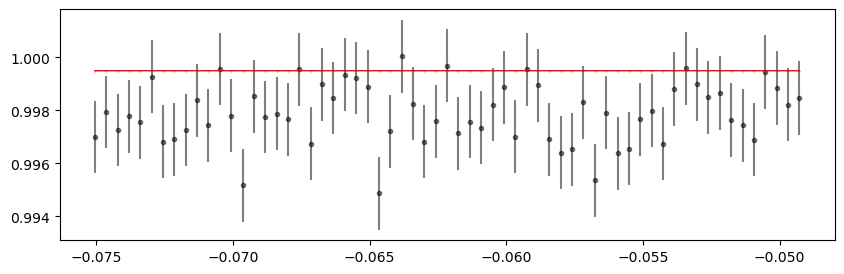

1831.013556 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.55it/s]


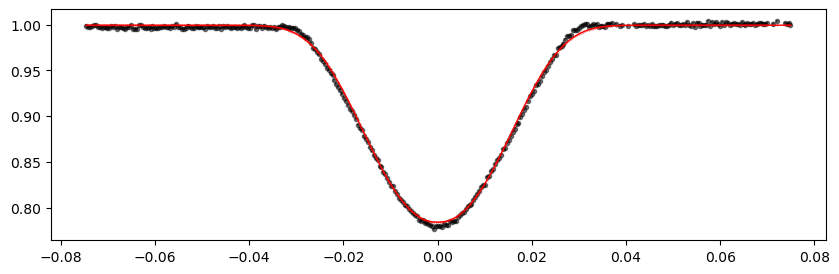

1834.3553800000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.29it/s]


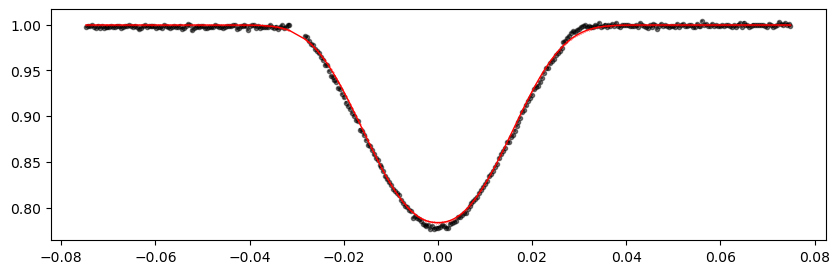

1837.697204 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.07it/s]


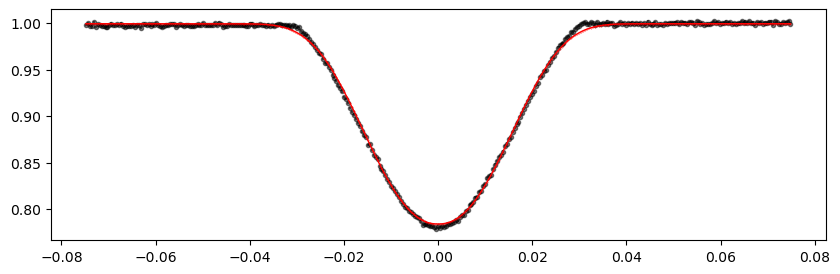

1841.0390280000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1324.69it/s]


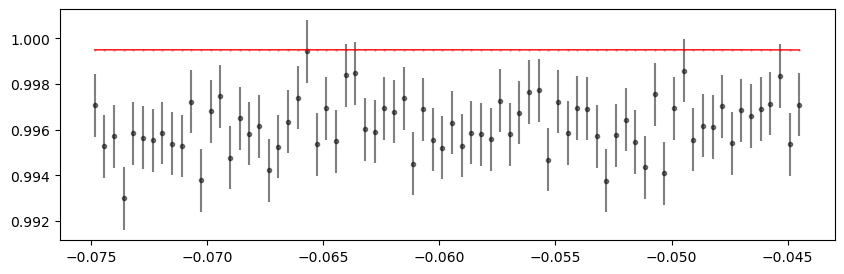

1844.3808520000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.76it/s]


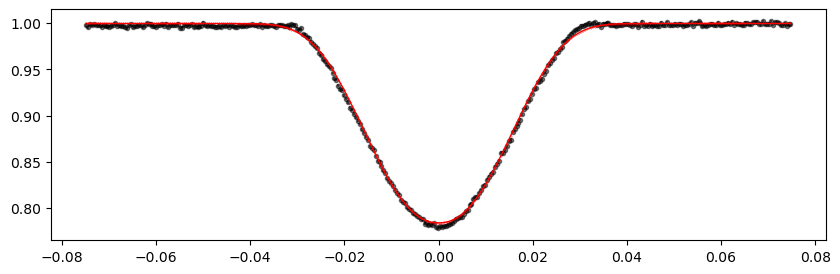

1847.722676 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.17it/s]


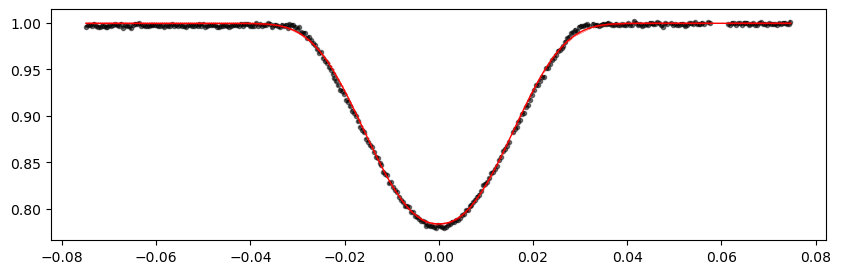

1851.0645000000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.30it/s]


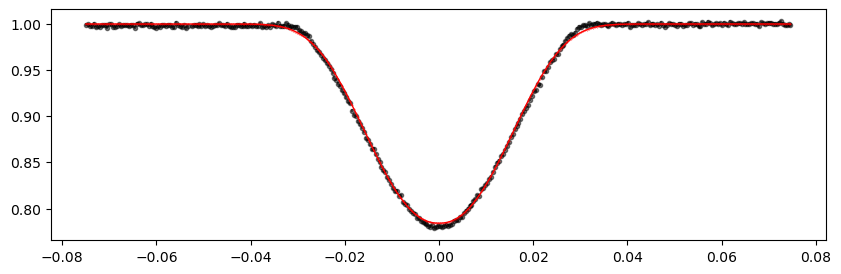

1854.406324 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1330.81it/s]


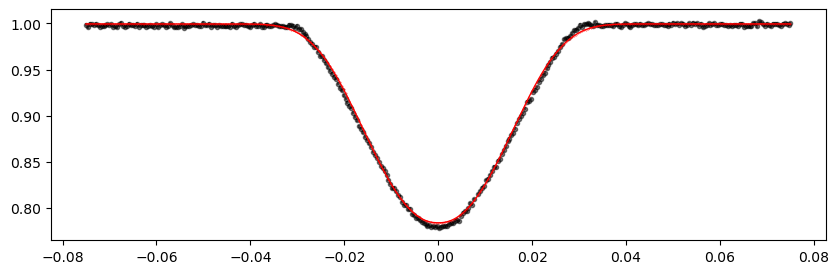

1857.7481480000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.52it/s]


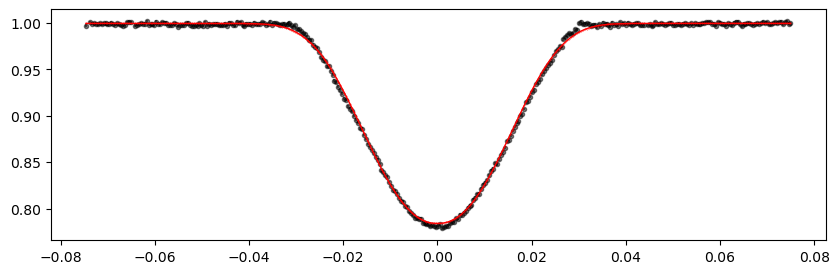

1861.0899720000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.84it/s]


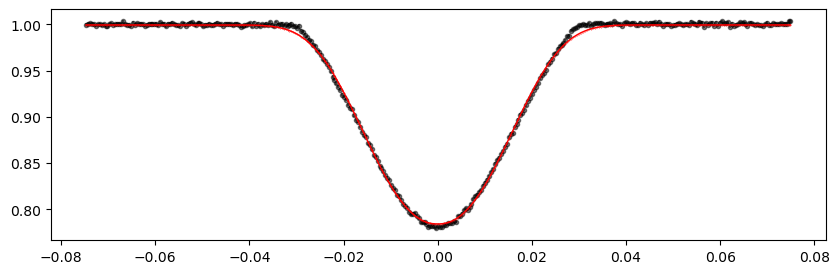

1864.431796 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1334.06it/s]


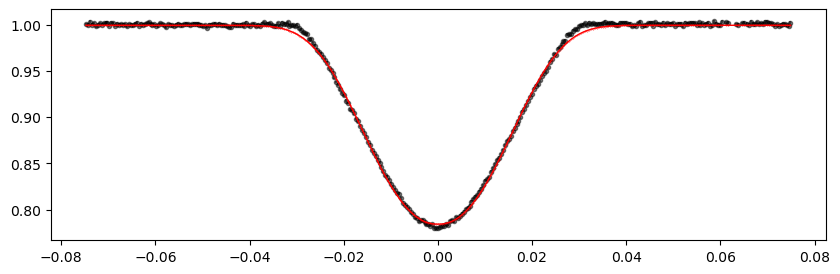

1867.7736200000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1347.41it/s]


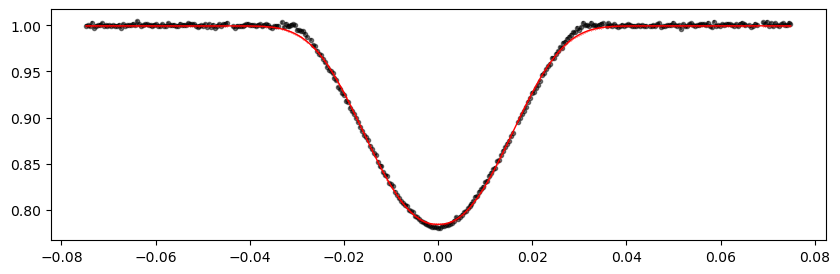

1871.115444 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1340.18it/s]


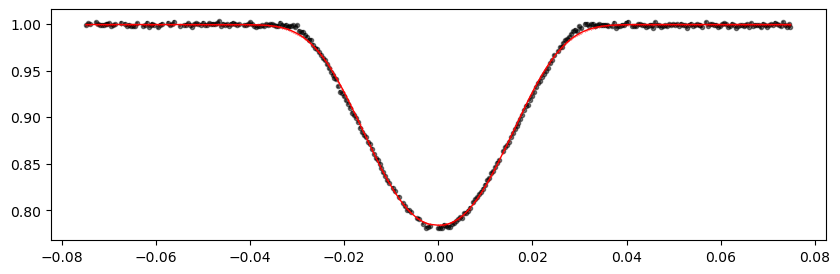

1874.457268 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.86it/s]


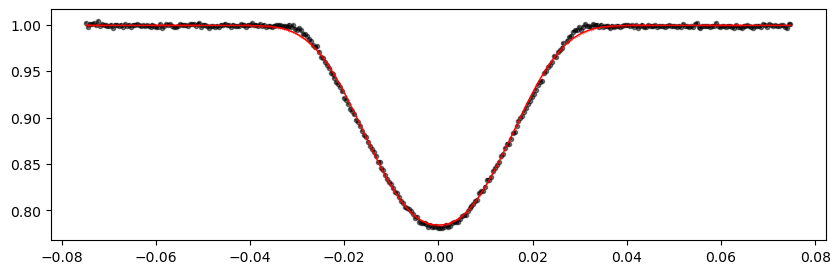

1877.7990920000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1346.05it/s]


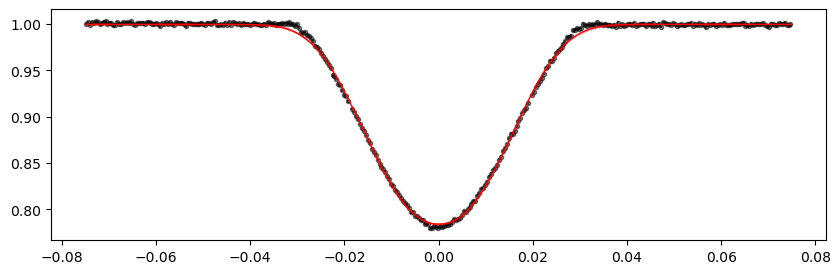

1881.140916 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.57it/s]


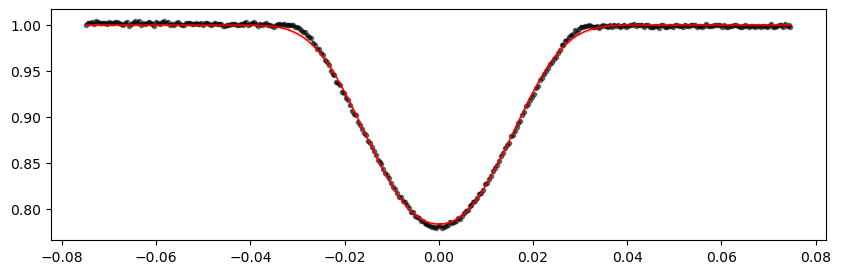

1887.824564 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1336.50it/s]


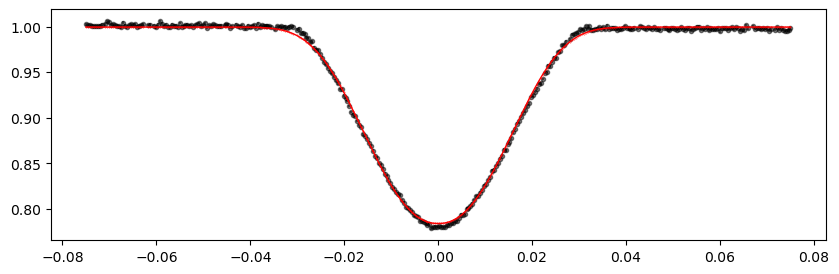

1891.166388 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.37it/s]


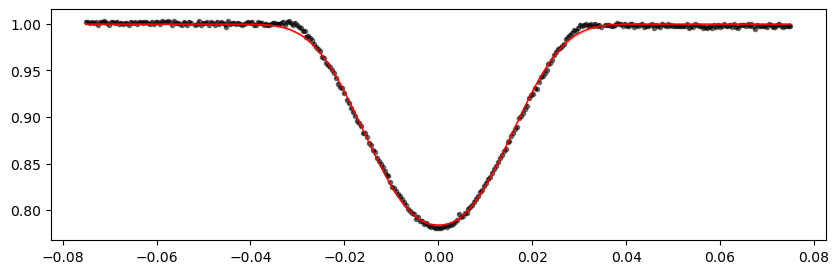

1894.5082120000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.54it/s]


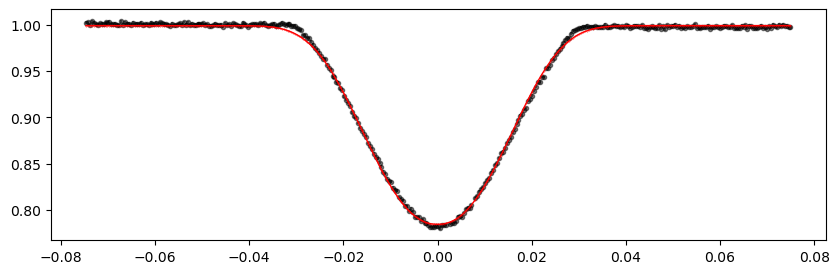

1897.850036 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.79it/s]


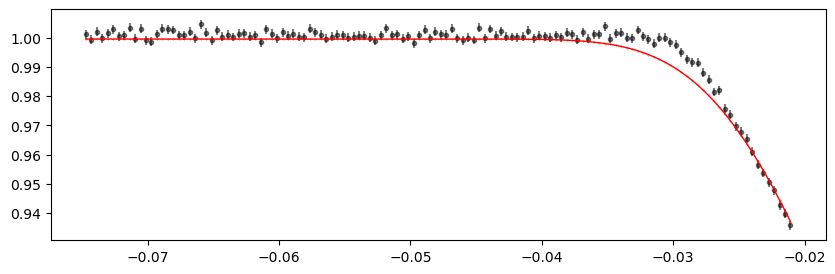

1901.1918600000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.46it/s]


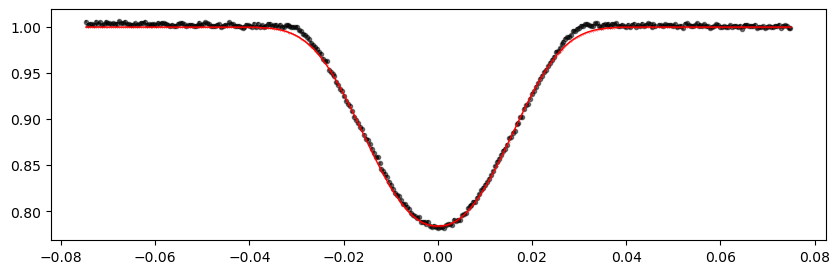

1904.533684 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1357.10it/s]


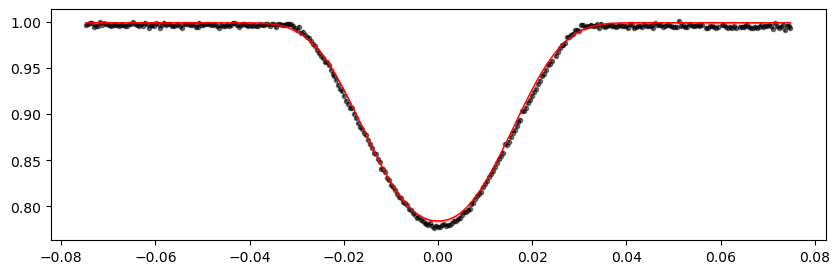

1907.875508 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1343.30it/s]


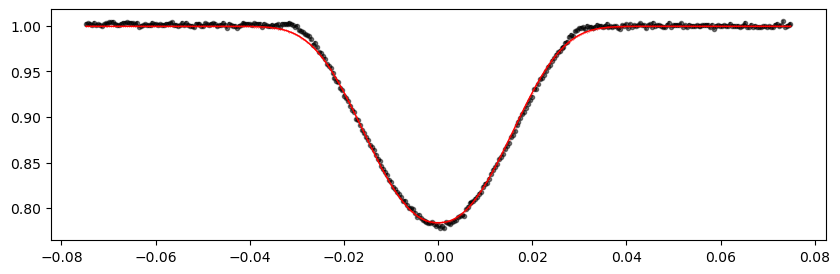

1911.2173320000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.37it/s]


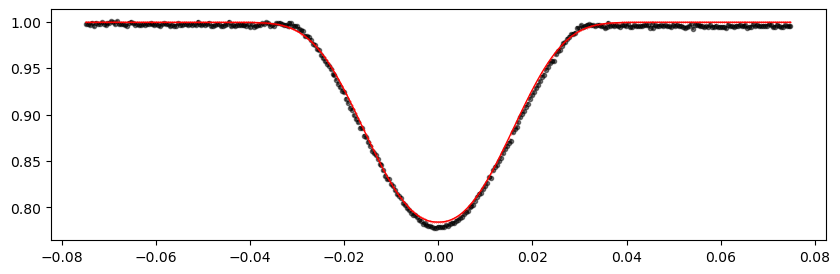

1917.9009800000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.30it/s]


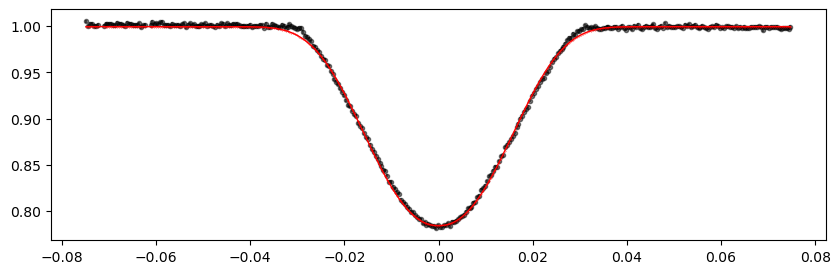

1921.242804 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.72it/s]


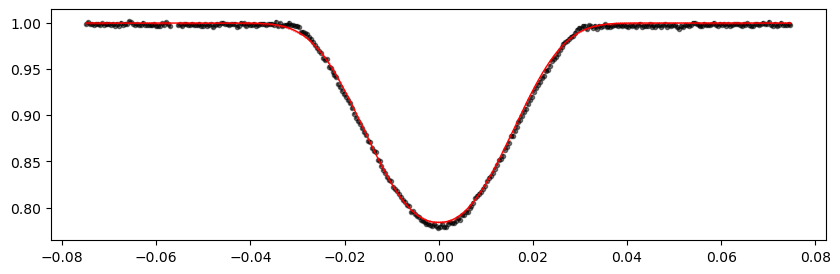

1924.584628 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.61it/s]


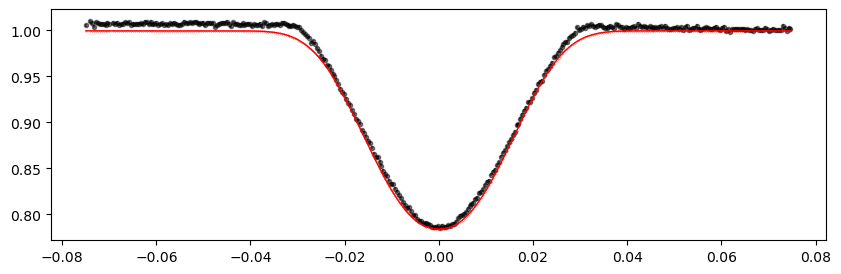

1931.268276 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.16it/s]


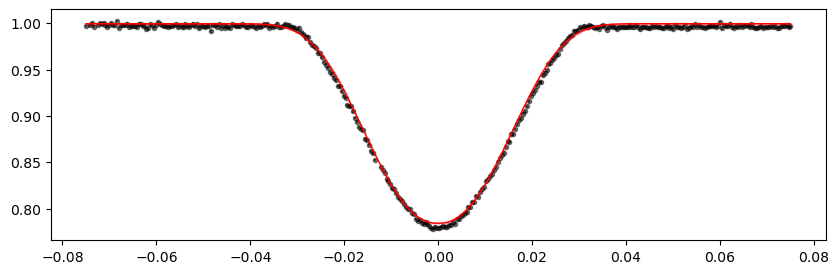

1934.6101 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.75it/s]


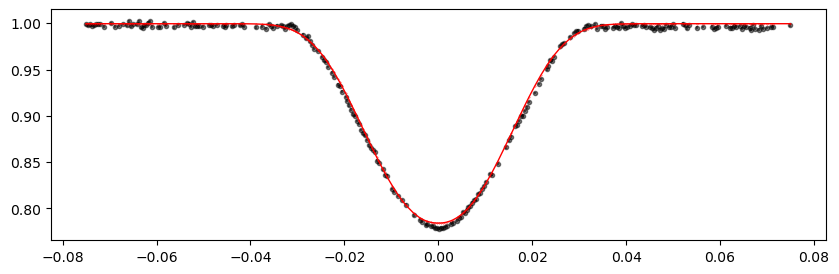

1937.9519240000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.31it/s]


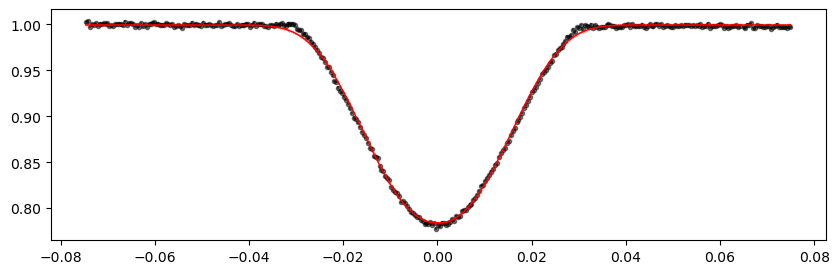

1944.6355720000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.45it/s]


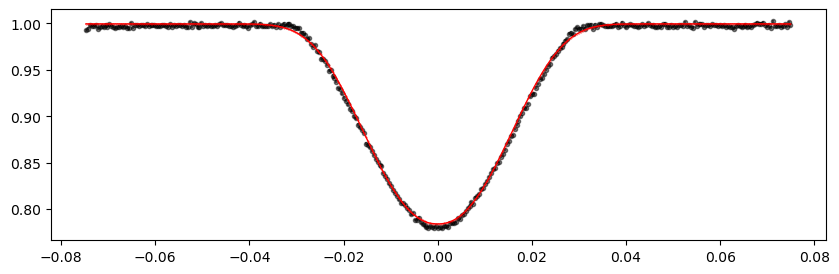

1947.9773960000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1333.74it/s]


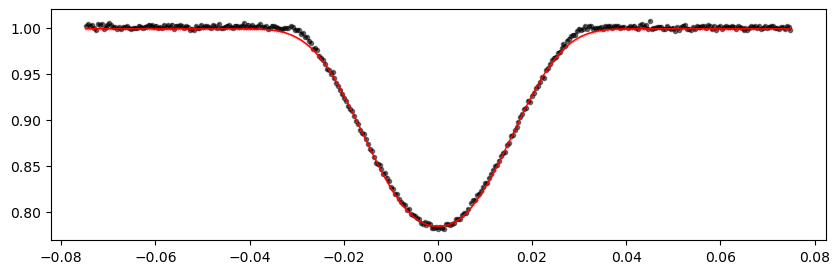

1951.31922 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1345.65it/s]


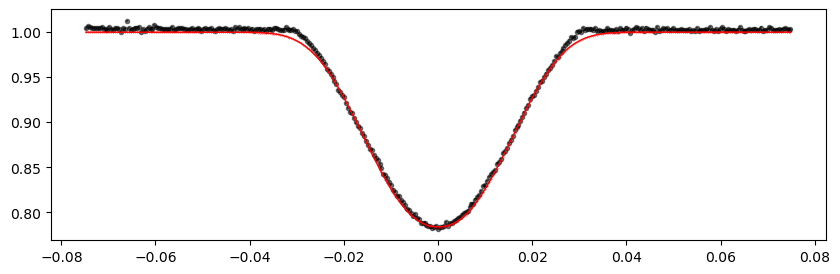

1954.6610440000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.30it/s]


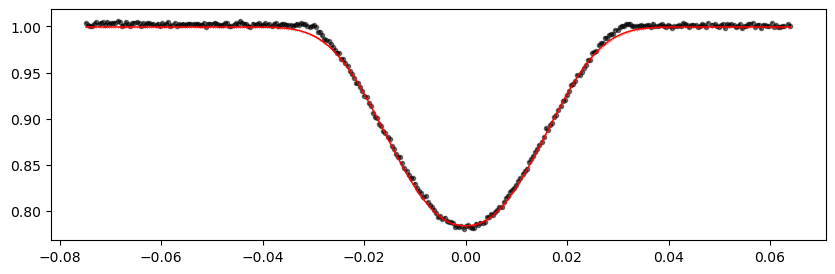

1958.002868 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.31it/s]


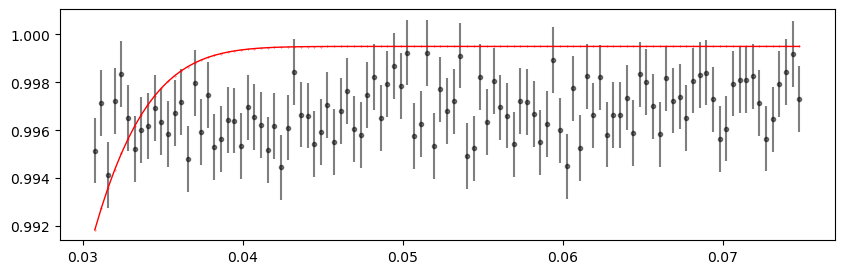

1961.3446920000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.30it/s]


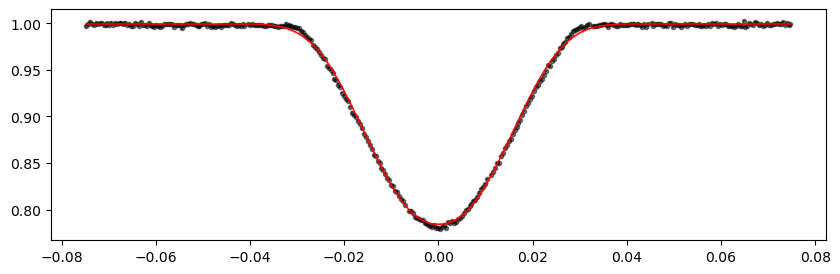

1964.6865160000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.26it/s]


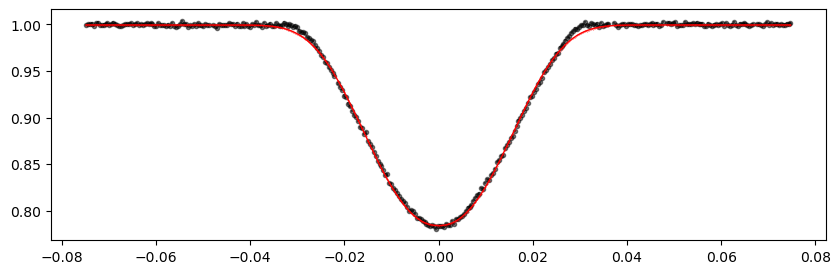

1968.02834 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1348.76it/s]


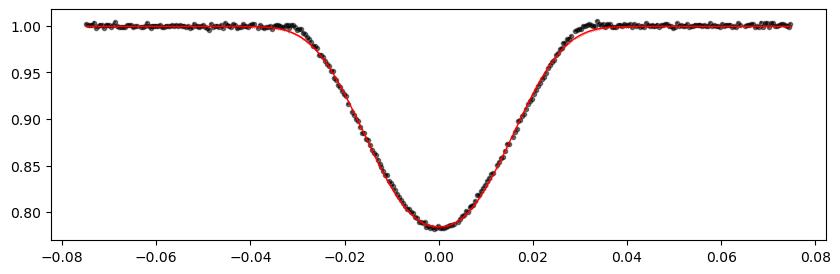

1974.711988 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.46it/s]


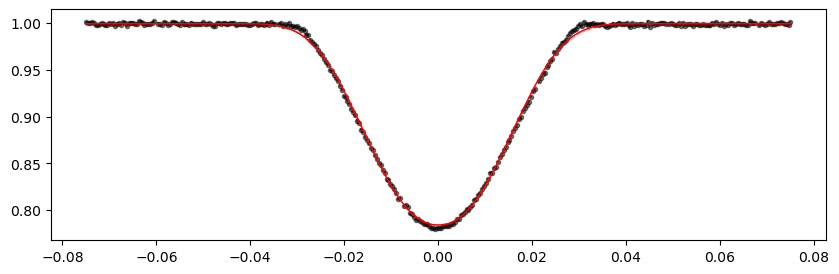

1978.053812 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.17it/s]


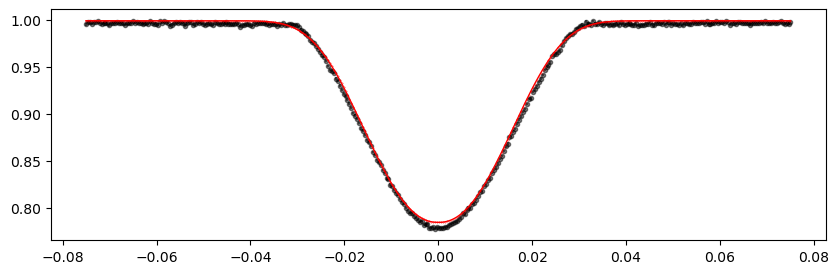

1981.3956360000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.08it/s]


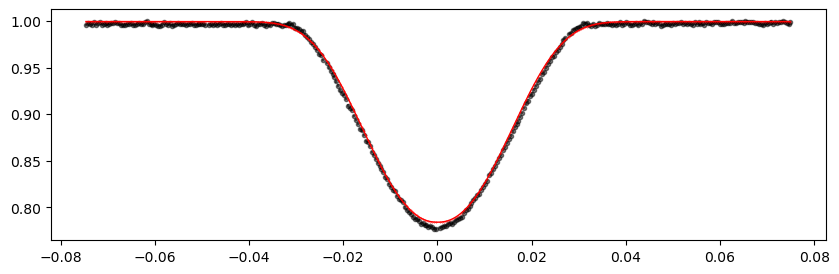

1988.0792840000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1344.89it/s]


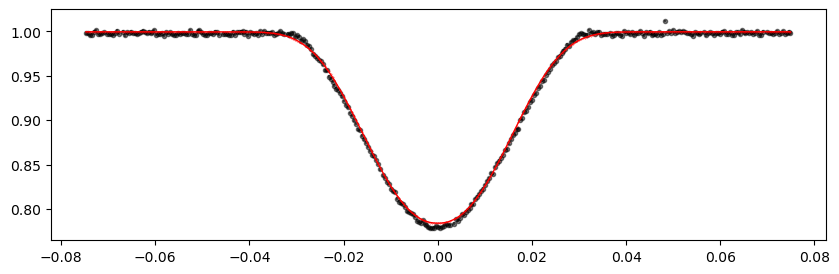

1991.421108 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.99it/s]


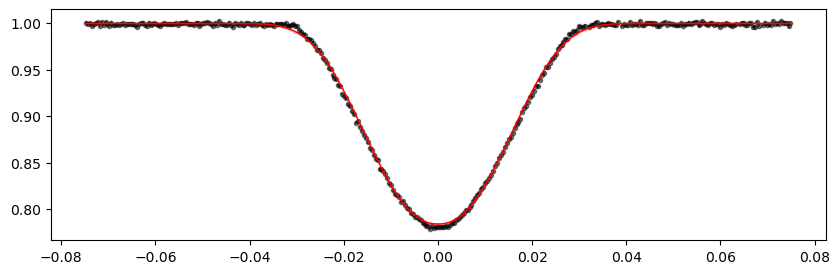

1994.762932 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.74it/s]


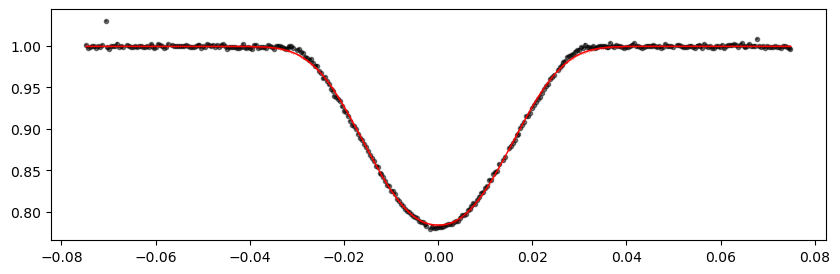

2001.44658 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1349.42it/s]


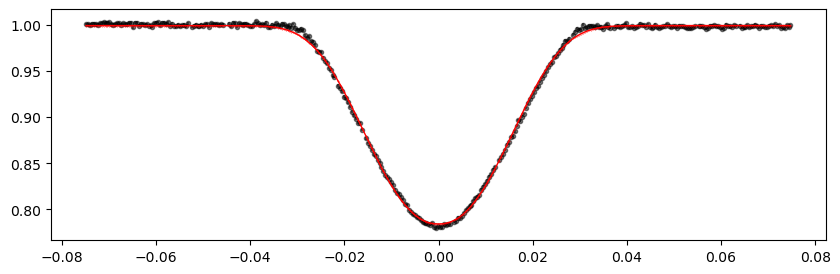

2004.7884040000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.65it/s]


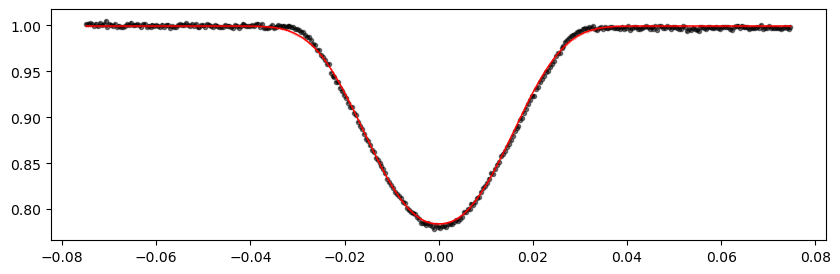

2008.130228 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1351.48it/s]


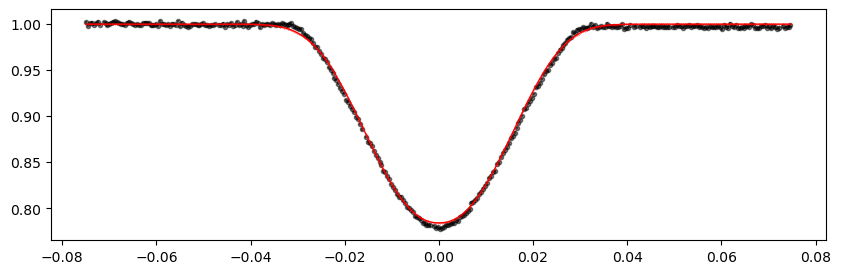

2011.472052 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1342.76it/s]


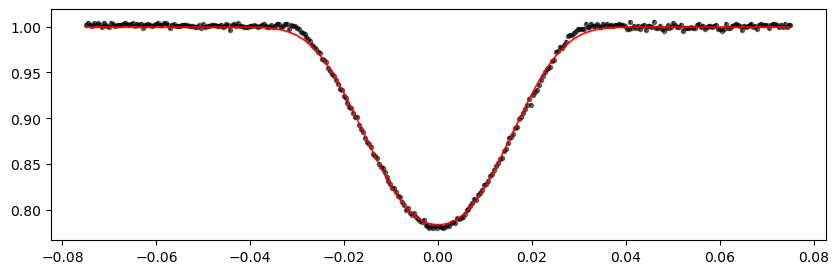

2014.8138760000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.63it/s]


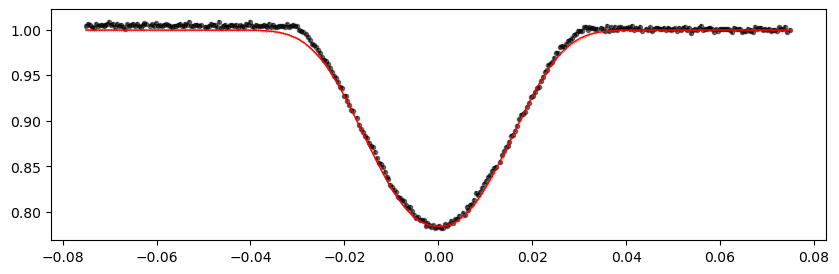

2018.1557 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1330.10it/s]


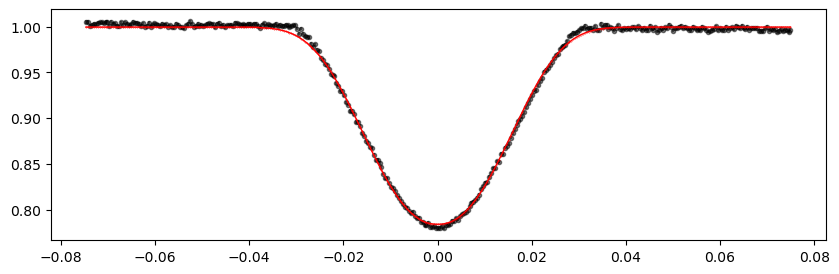

2021.497524 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1356.56it/s]


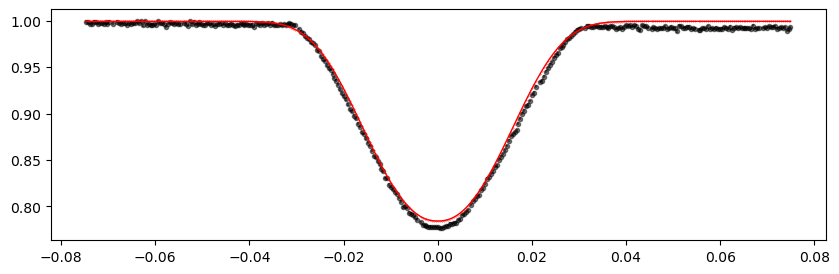

2024.839348 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.76it/s]


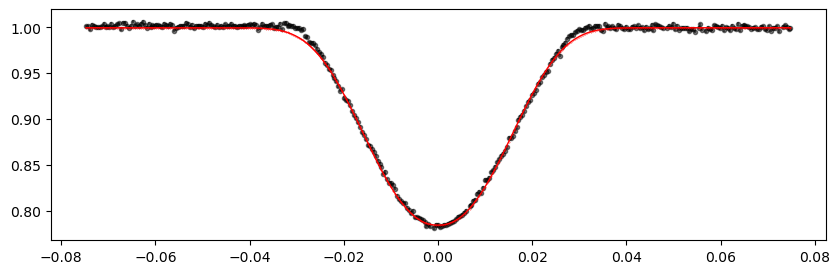

2028.181172 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.69it/s]


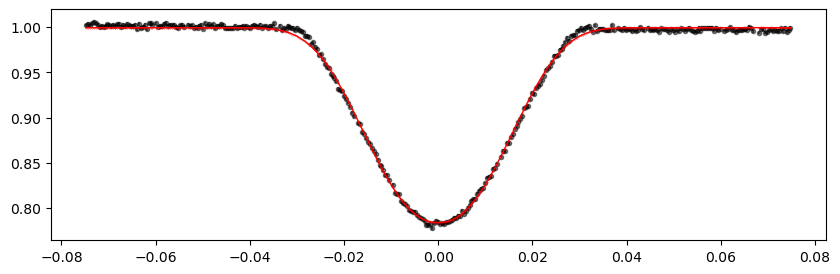

2031.5229960000001 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.93it/s]


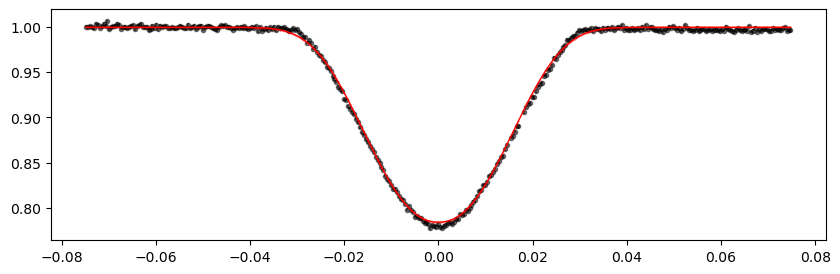

2034.8648200000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.75it/s]


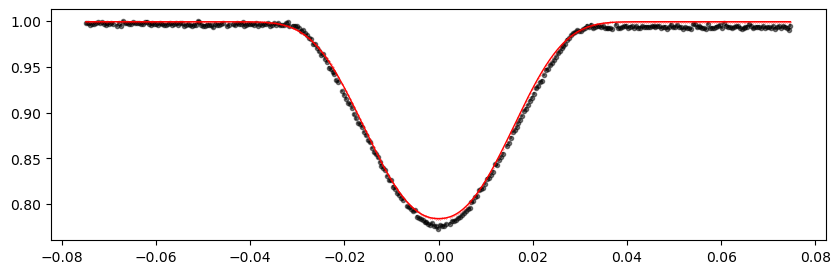

2392.439988 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.06it/s]


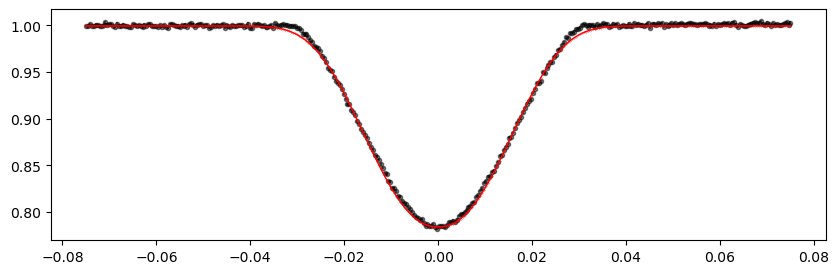

2395.781812 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.88it/s]


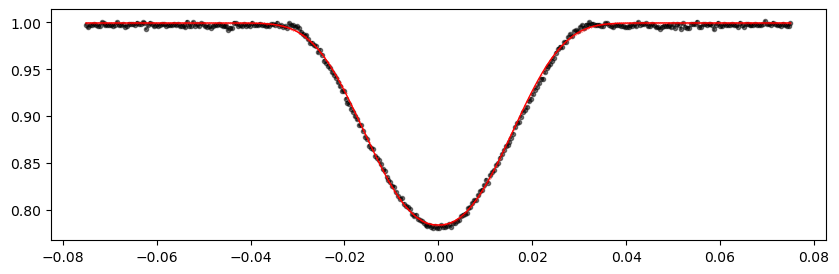

2399.1236360000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.82it/s]


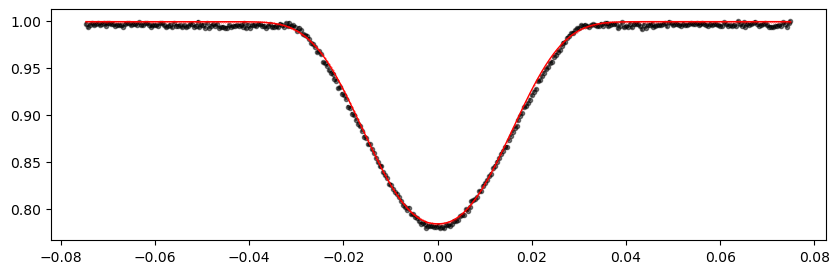

2402.4654600000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.68it/s]


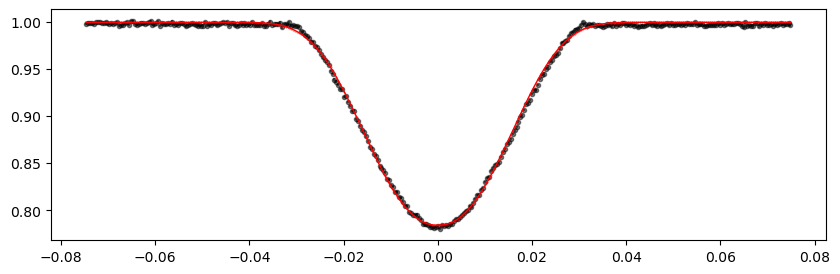

2405.807284 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.79it/s]


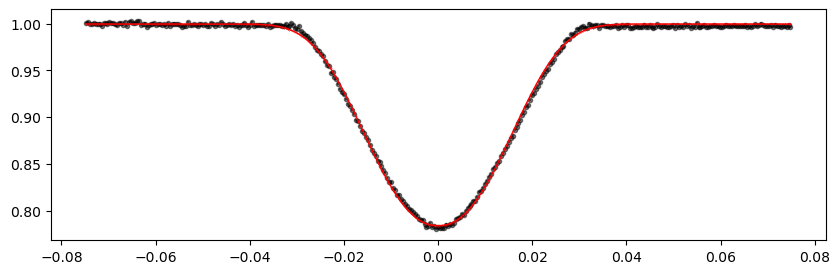

2409.149108 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1384.83it/s]


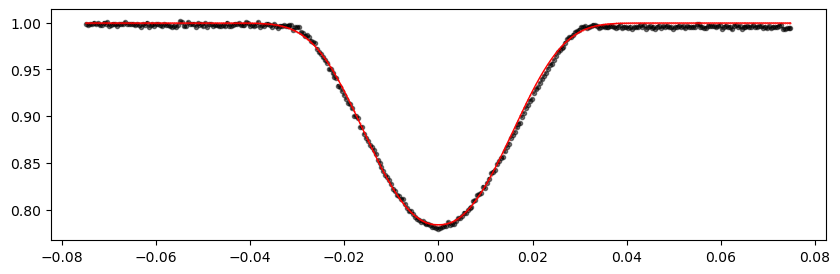

2412.490932 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.67it/s]


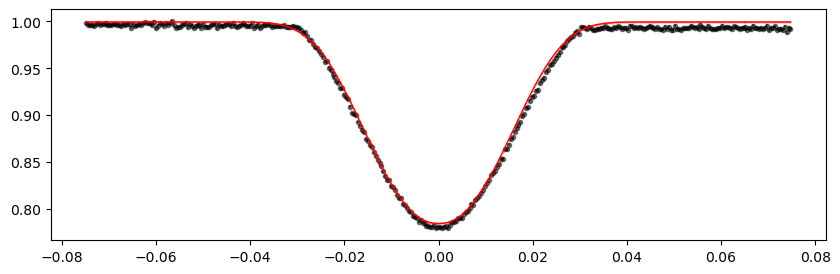

2415.8327560000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1373.87it/s]


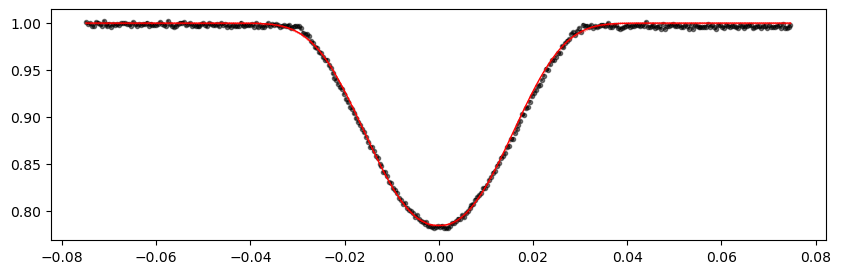

2422.516404 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.85it/s]


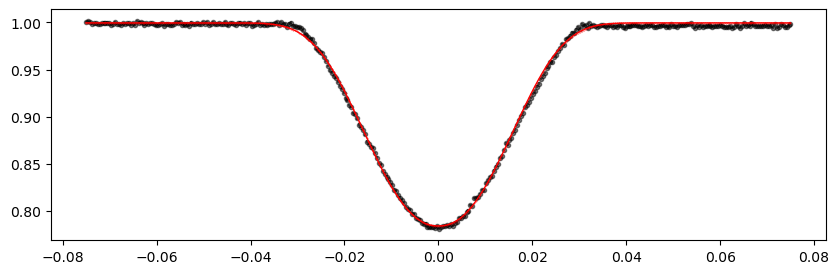

2425.858228 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.55it/s]


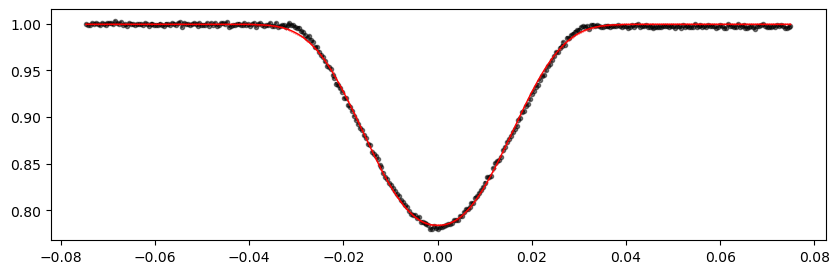

2429.200052 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.58it/s]


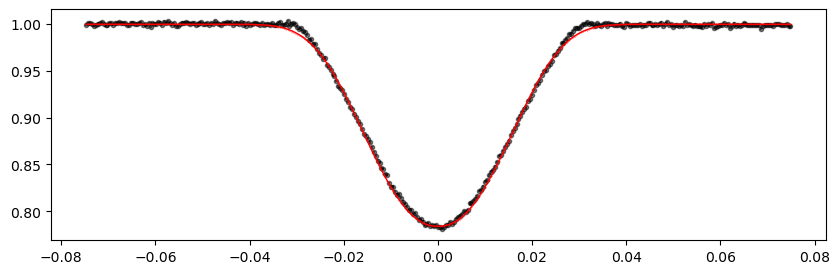

2432.5418760000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.86it/s]


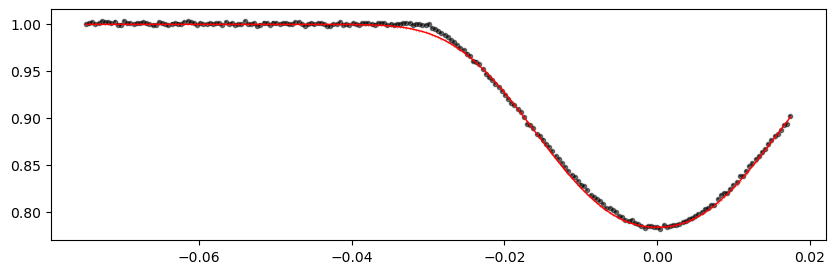

2435.8837000000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.79it/s]


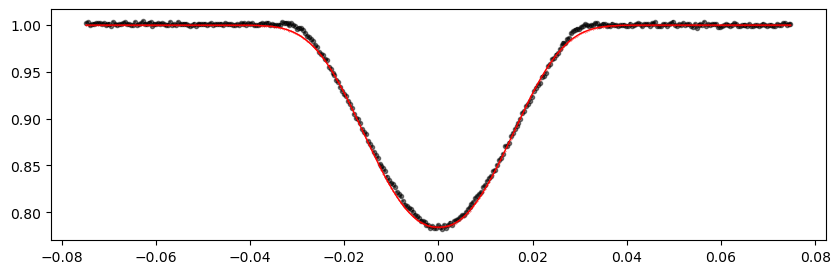

2439.225524 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.01it/s]


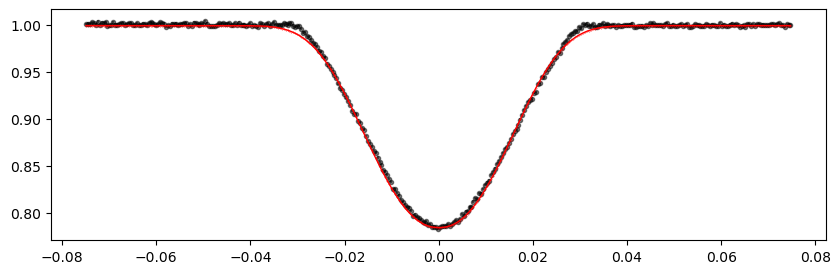

2442.567348 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.91it/s]


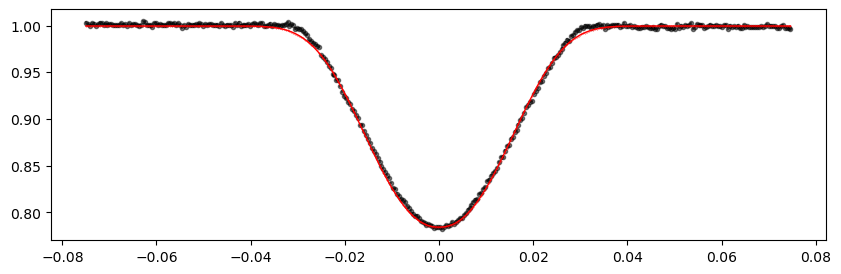

2445.909172 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.07it/s]


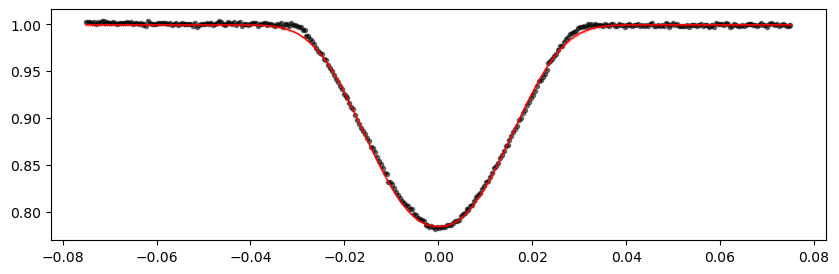

2582.923956 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.64it/s]


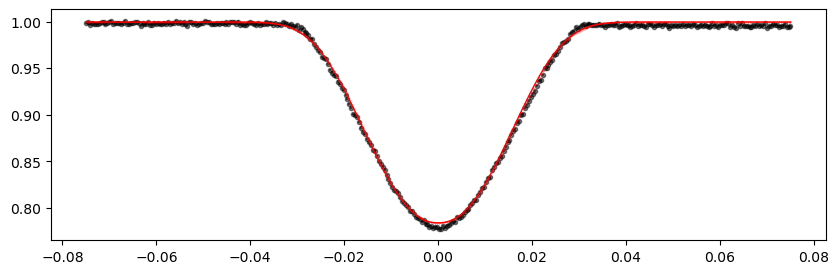

2586.26578 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1374.19it/s]


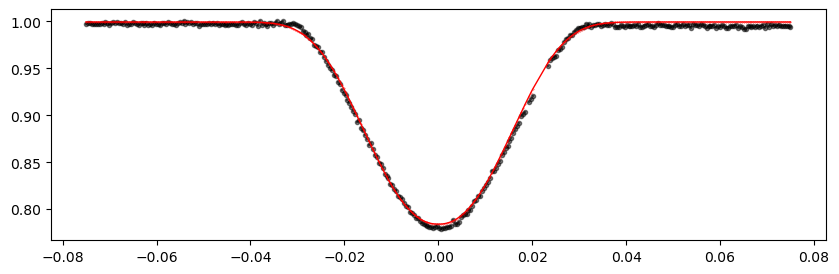

2589.607604 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.91it/s]


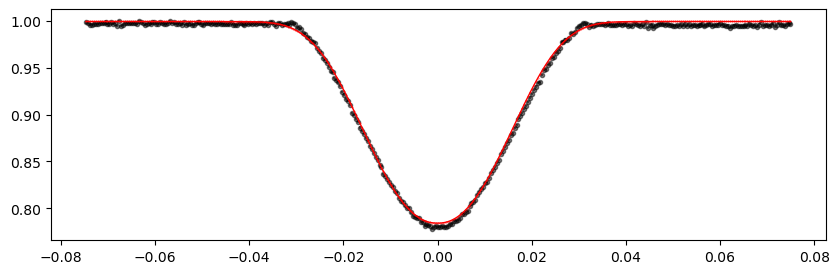

2592.949428 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.52it/s]


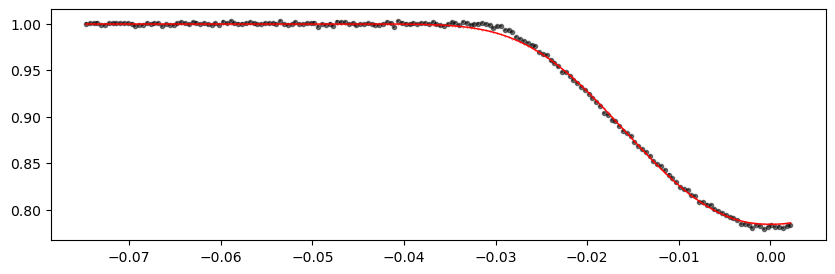

2596.291252 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.04it/s]


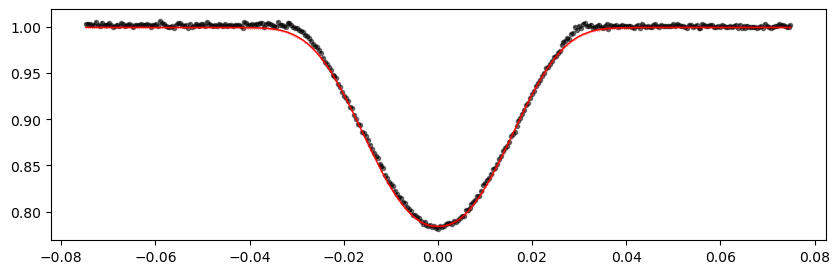

2599.633076 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1362.78it/s]


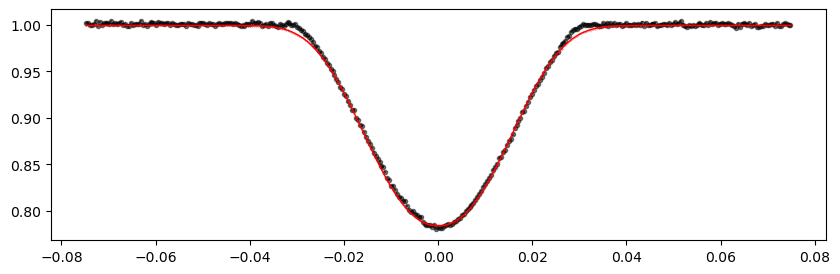

2602.9749 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1381.73it/s]


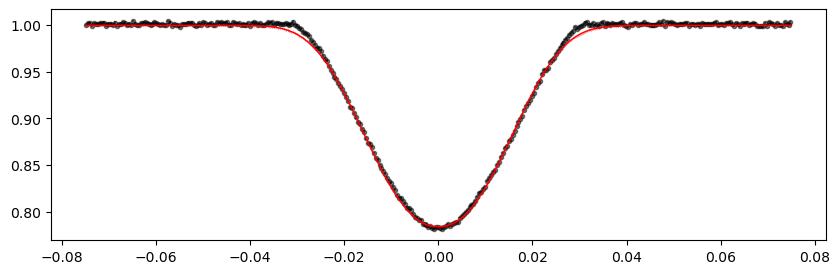

2606.3167240000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.86it/s]


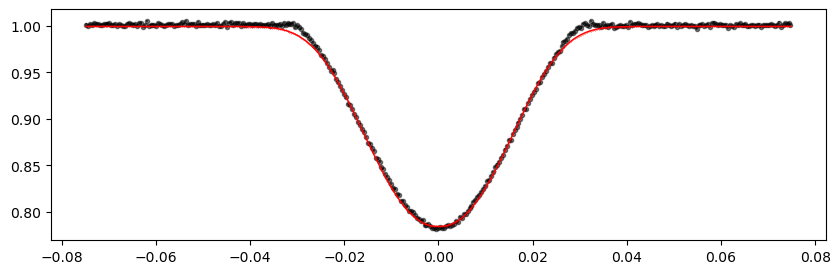

2613.000372 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.95it/s]


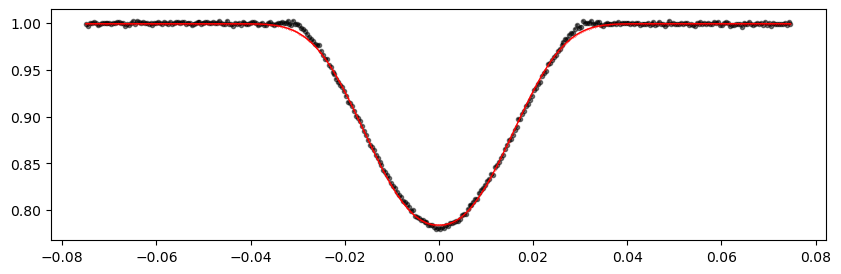

2616.342196 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.77it/s]


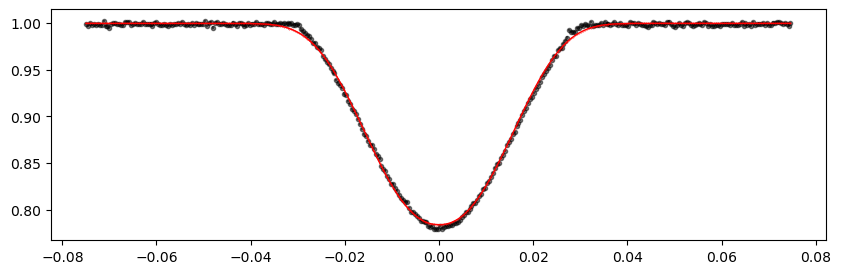

2619.68402 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.60it/s]


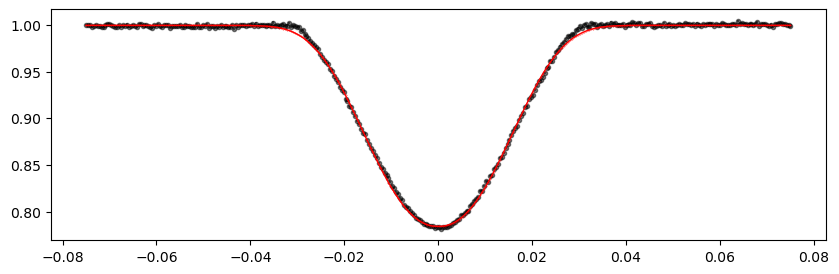

2626.367668 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.80it/s]


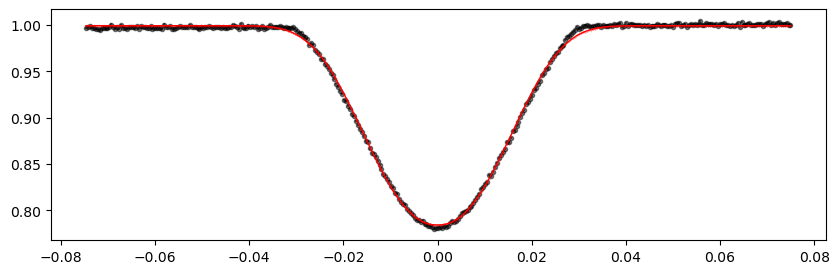

2629.709492 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.76it/s]


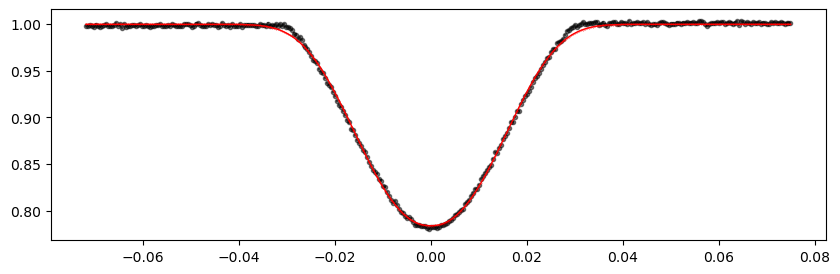

2633.051316 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.65it/s]


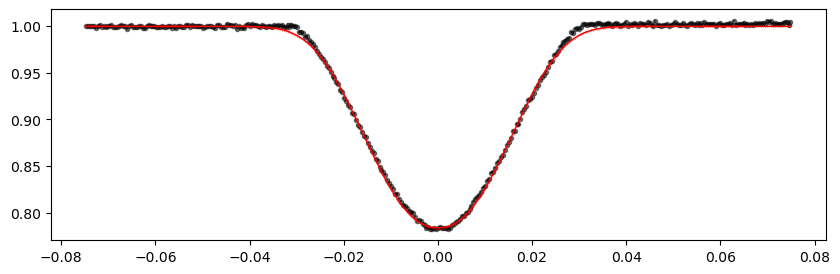

2643.0767880000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1365.13it/s]


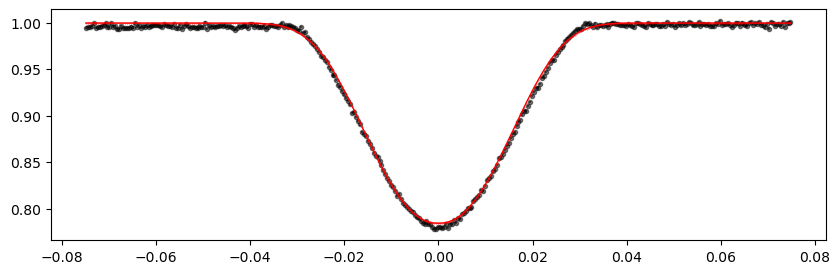

2646.418612 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1360.93it/s]


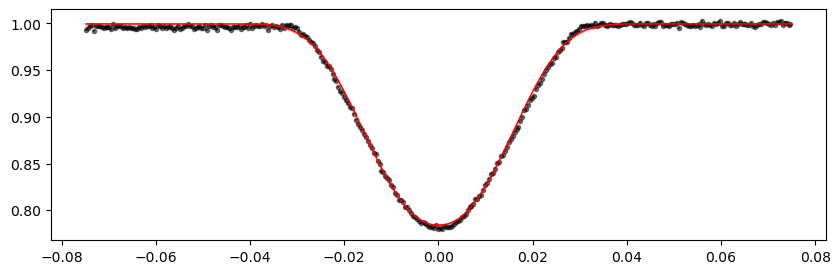

2649.760436 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.71it/s]


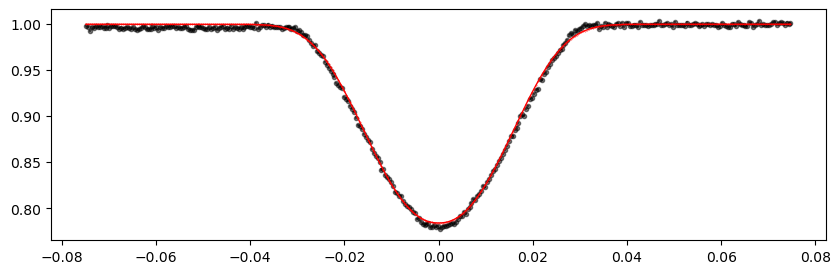

2656.444084 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1338.01it/s]


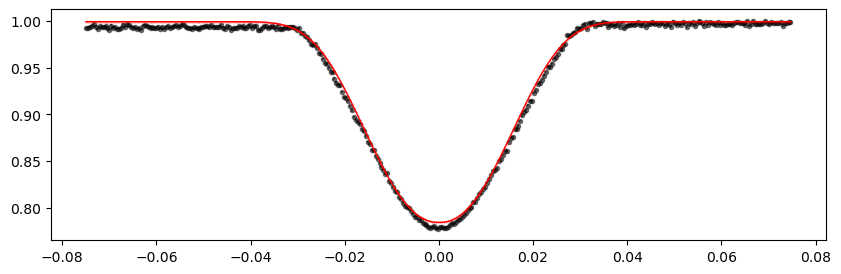

2659.785908 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1378.17it/s]


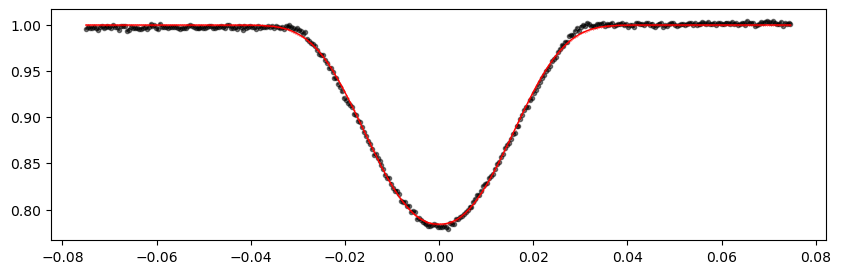

2663.127732 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.25it/s]


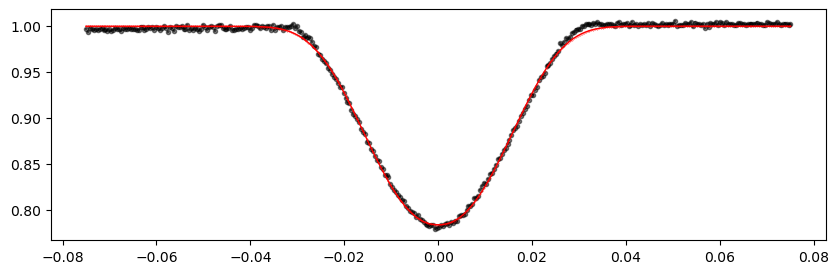

2669.81138 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.79it/s]


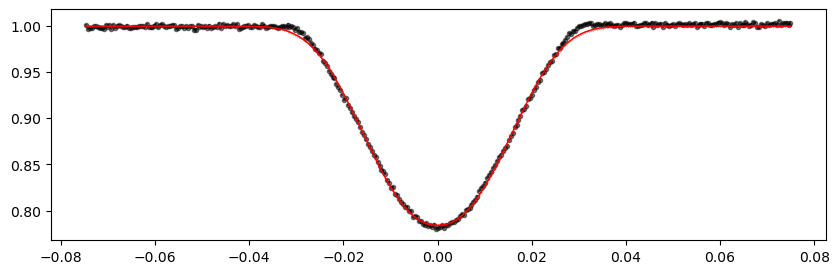

2673.153204 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.21it/s]


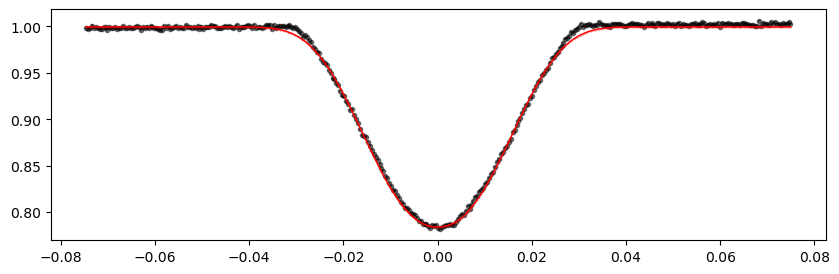

2676.4950280000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.20it/s]


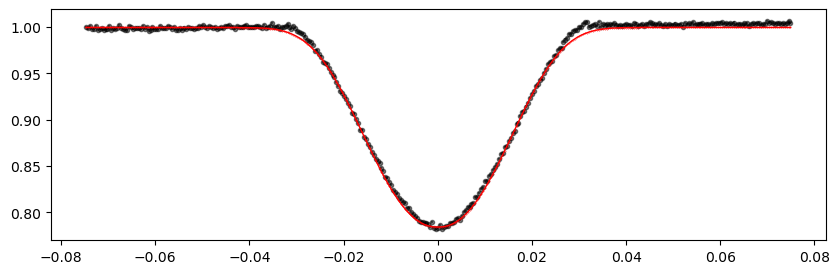

2683.178676 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1389.73it/s]


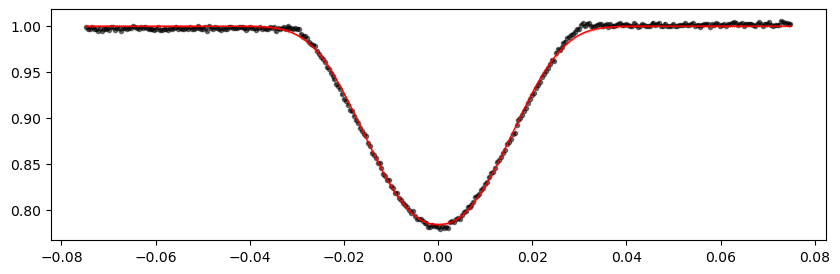

2686.5205 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.74it/s]


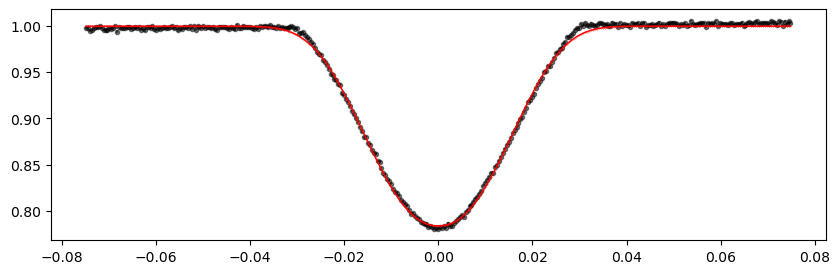

2689.862324 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.60it/s]


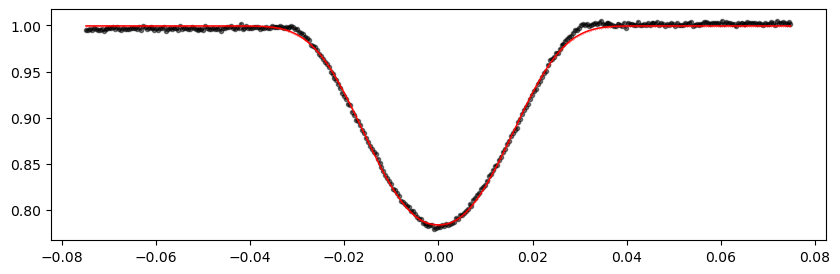

2696.545972 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.75it/s]


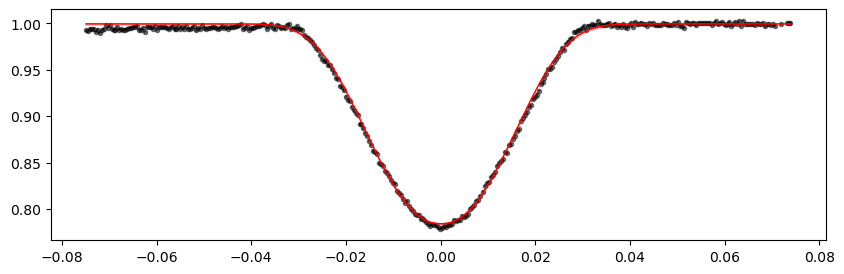

2699.887796 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.63it/s]


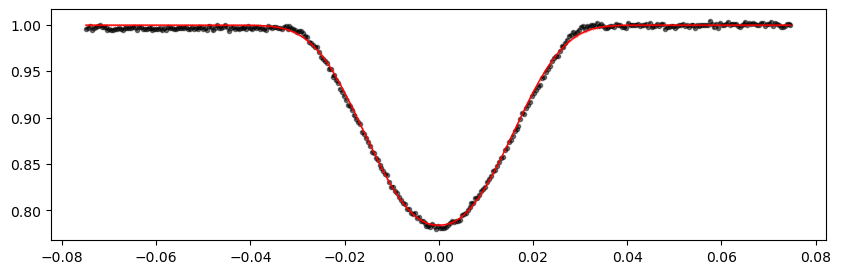

2703.22962 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.87it/s]


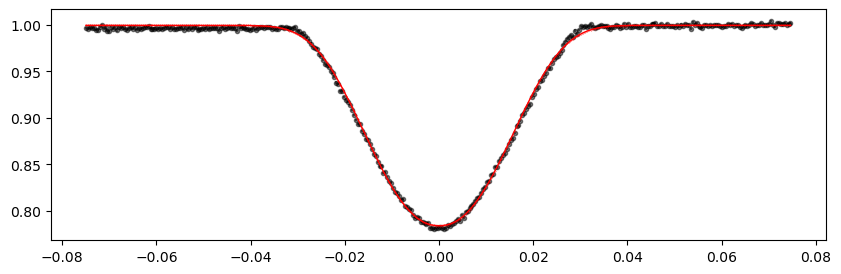

2709.9132680000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.74it/s]


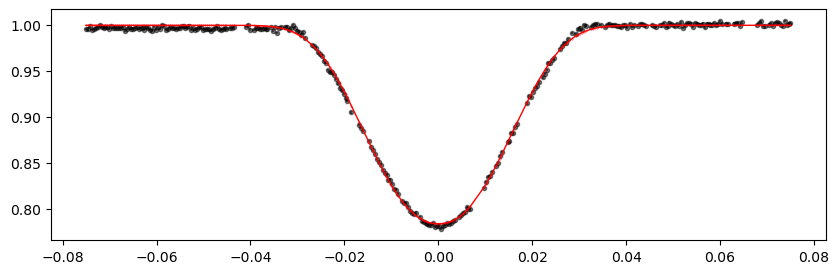

2713.2550920000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.98it/s]


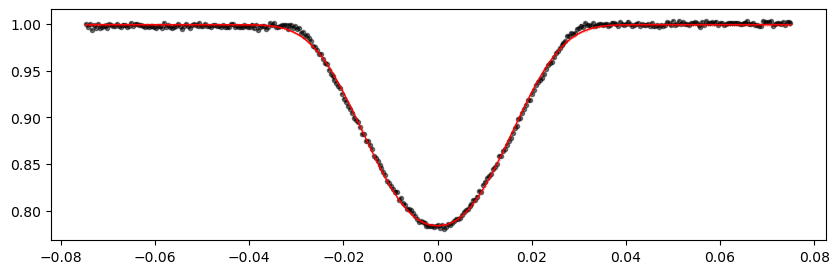

2716.5969160000004 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.94it/s]


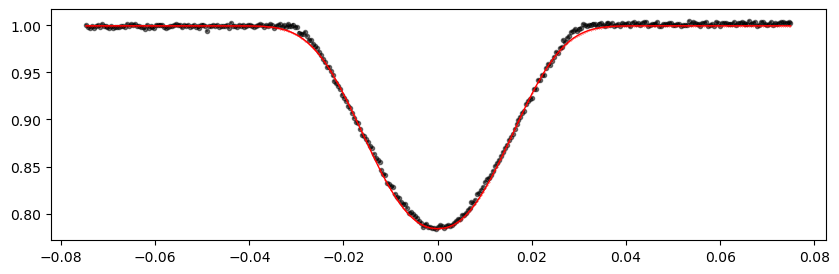

2719.93874 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.15it/s]


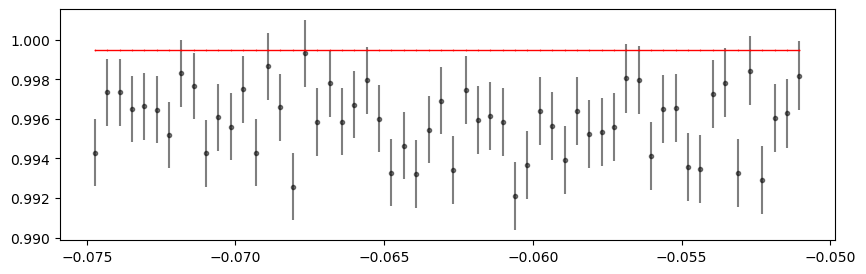

2723.280564 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1378.53it/s]


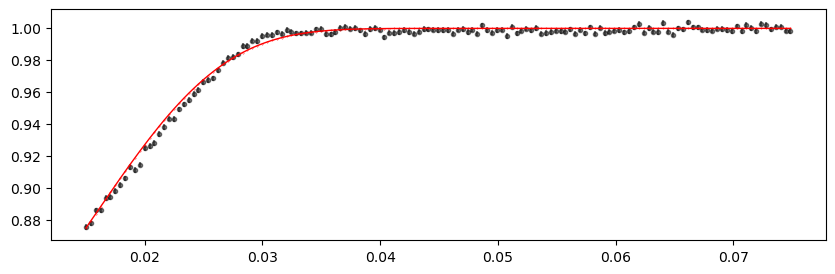

2726.622388 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1378.55it/s]


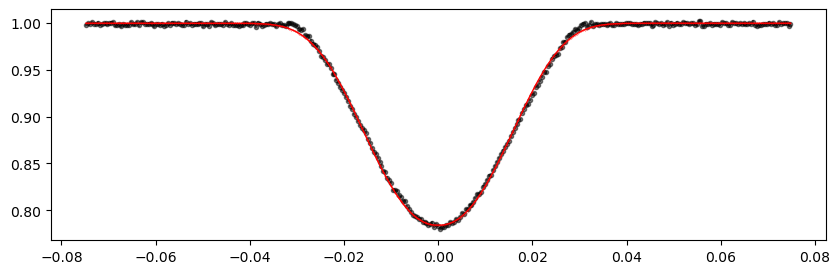

2729.964212 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.72it/s]


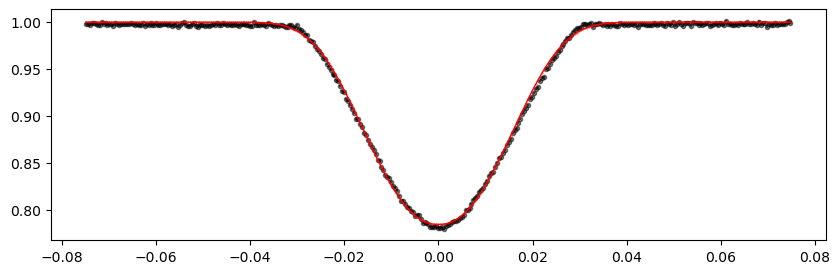

2736.64786 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1352.36it/s]


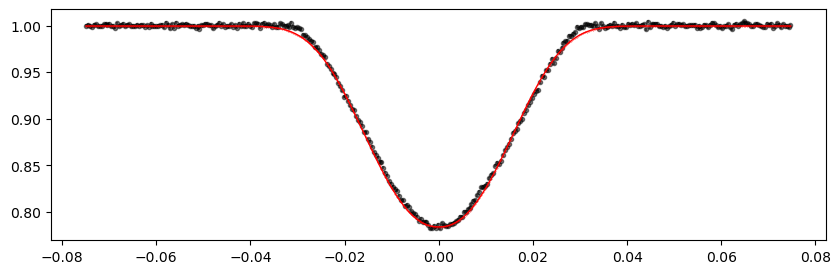

2739.989684 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.09it/s]


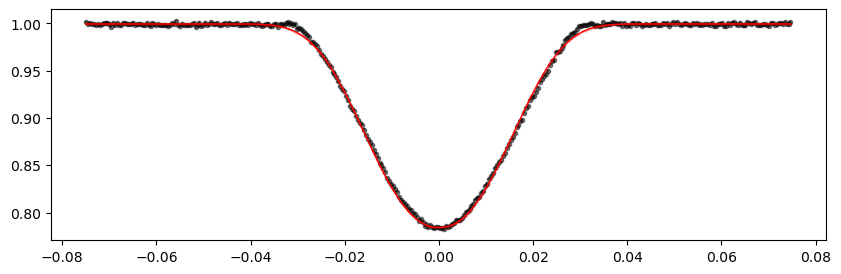

2770.0661 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.28it/s]


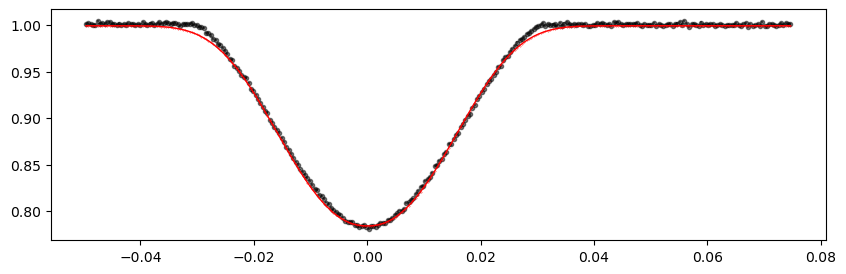

2773.407924 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.02it/s]


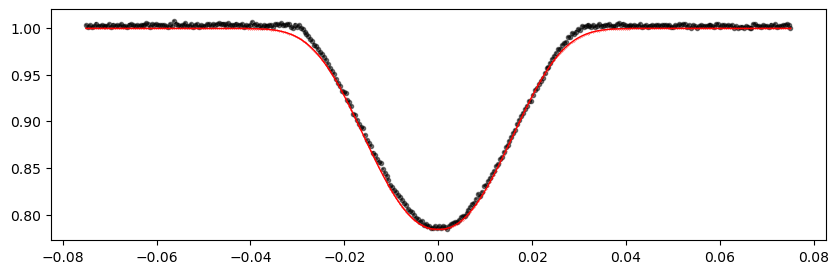

2776.749748 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1354.88it/s]


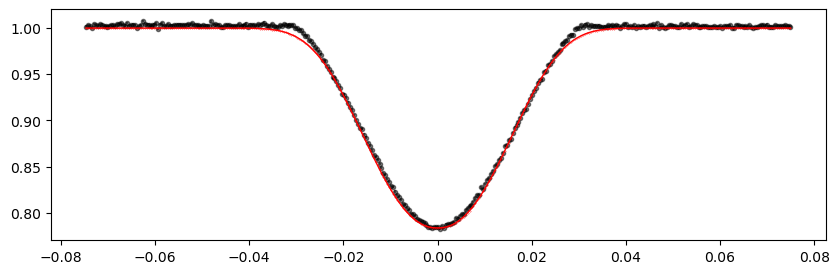

2780.0915720000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1387.68it/s]


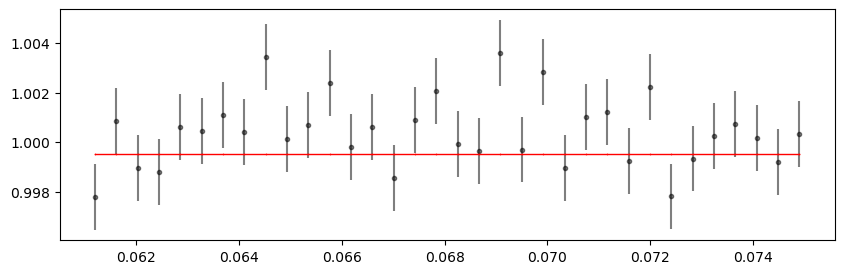

2783.4333960000004 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1379.54it/s]


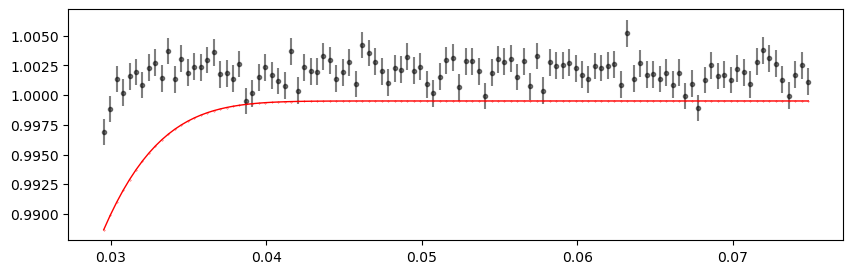

2786.77522 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.58it/s]


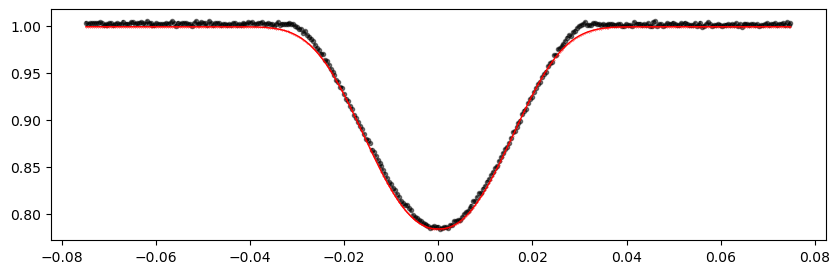

2790.117044 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.91it/s]


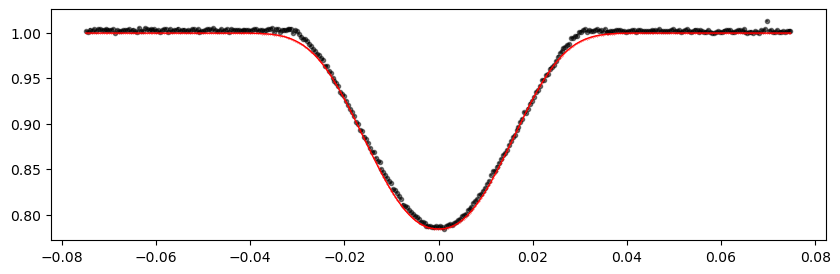

2793.458868 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.72it/s]


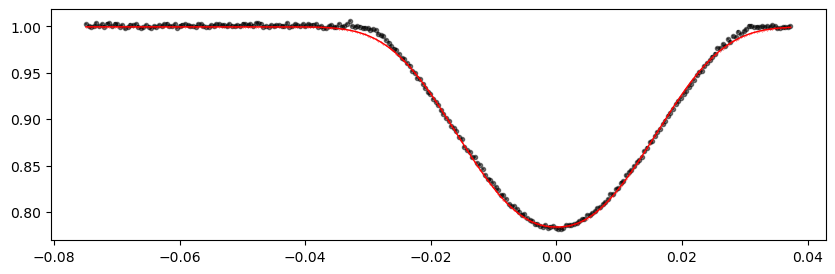

2800.142516 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1377.12it/s]


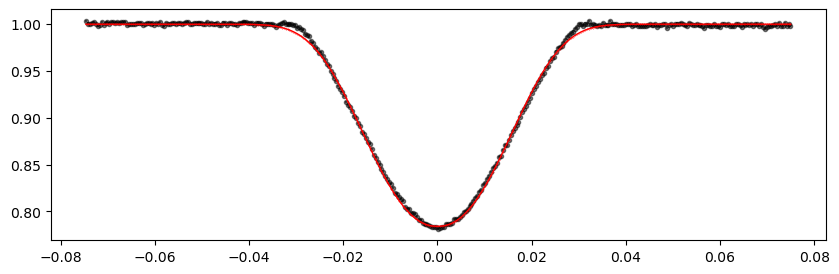

2803.48434 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.69it/s]


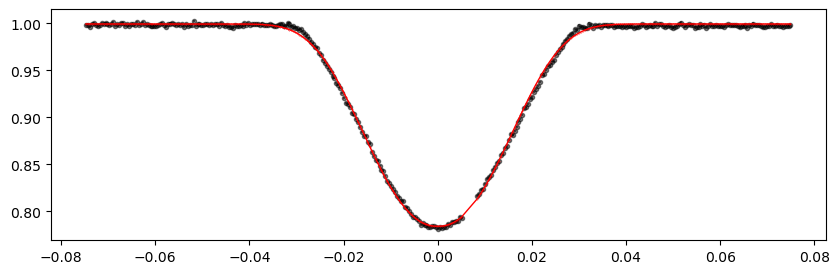

2806.826164 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.69it/s]


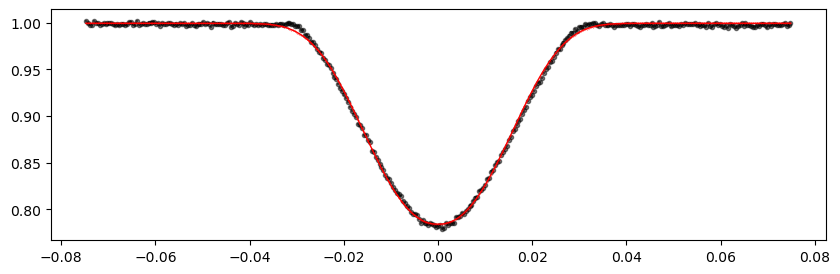

2810.167988 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.57it/s]


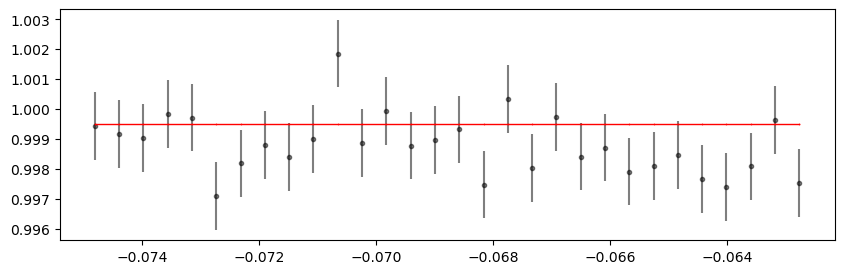

2813.5098120000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.72it/s]


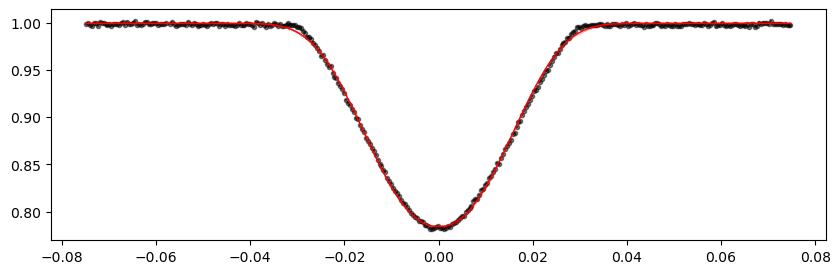

2816.8516360000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1371.52it/s]


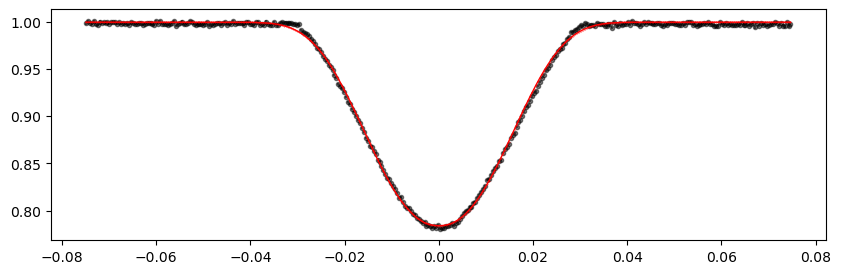

2820.1934600000004 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.09it/s]


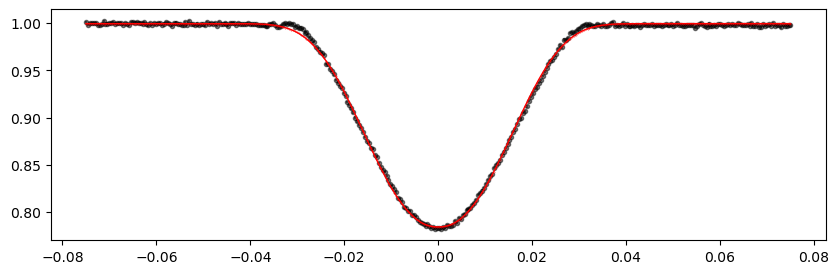

2823.535284 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.02it/s]


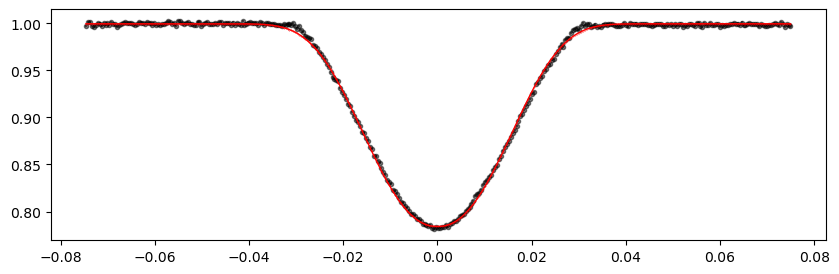

2826.877108 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.43it/s]


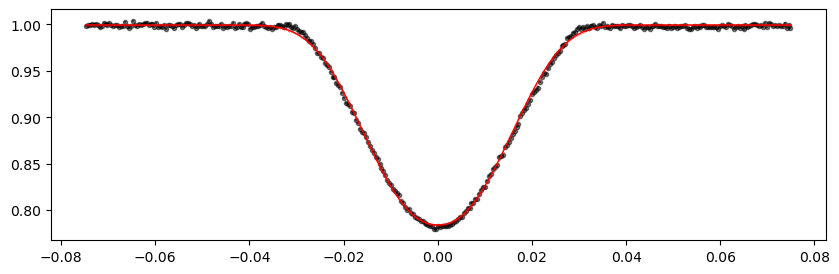

2830.2189319999998 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.39it/s]


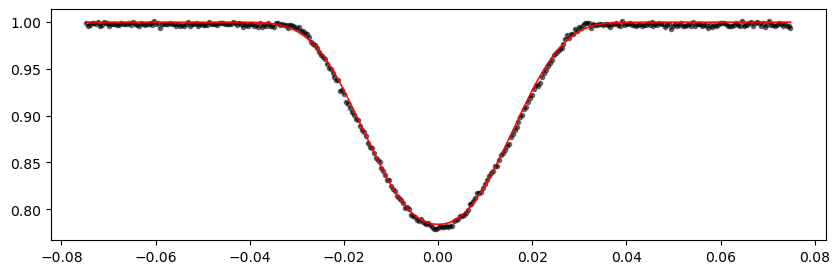

2833.560756 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1367.16it/s]


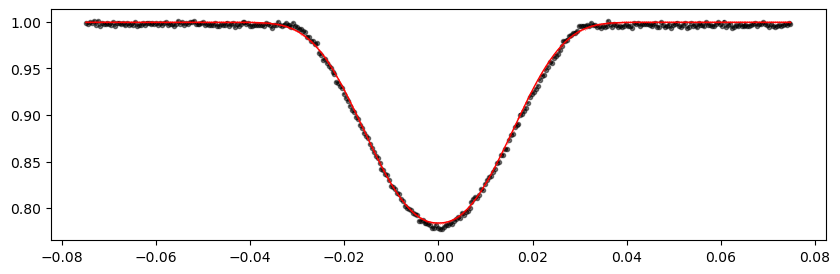

2836.90258 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.92it/s]


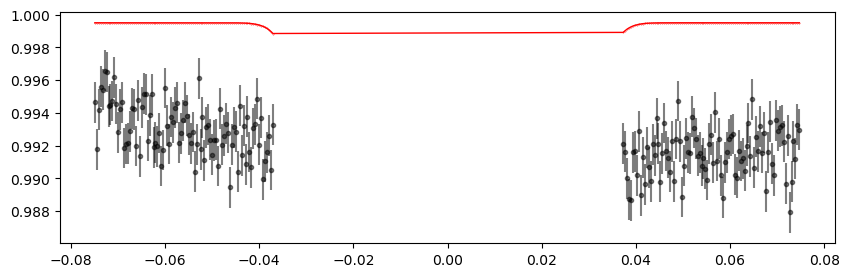

2840.244404 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1390.72it/s]


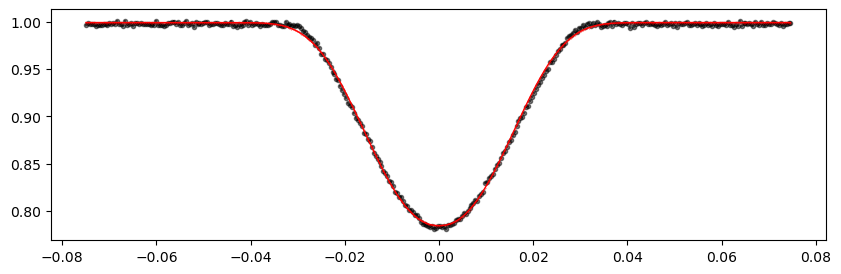

2843.586228 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1384.69it/s]


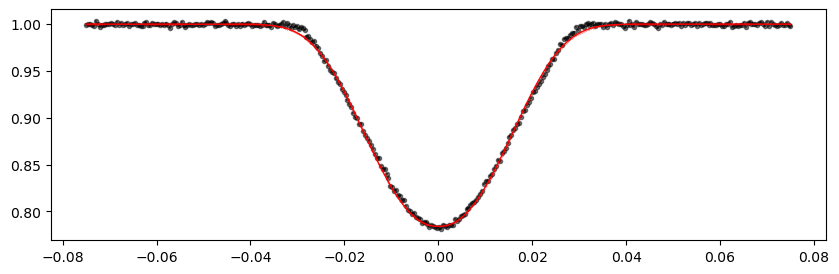

2846.928052 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.69it/s]


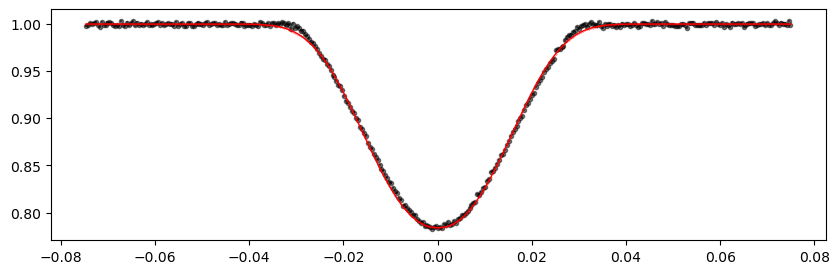

2850.2698760000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.48it/s]


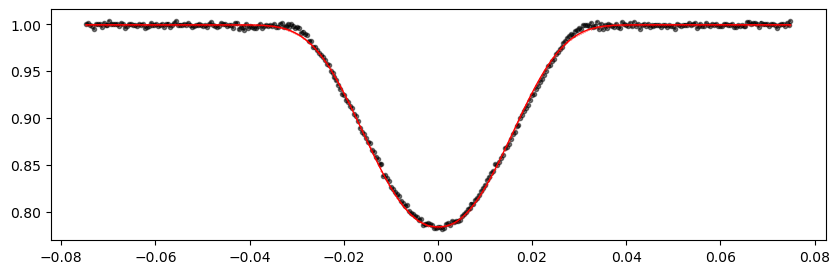

2853.6117000000004 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1370.92it/s]


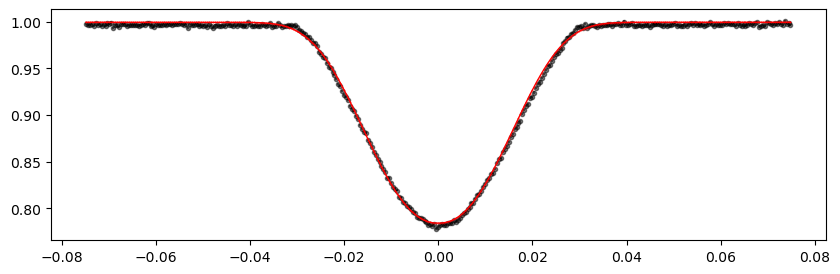

2856.953524 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.59it/s]


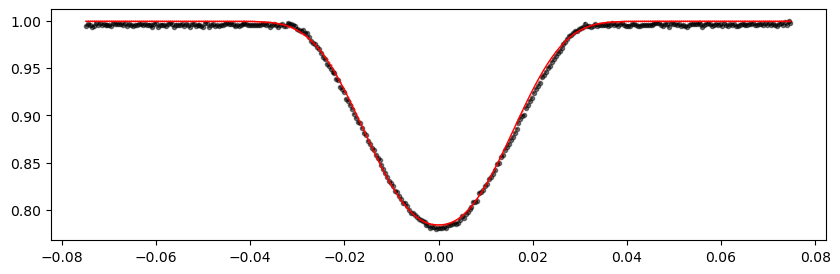

2860.295348 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1358.02it/s]


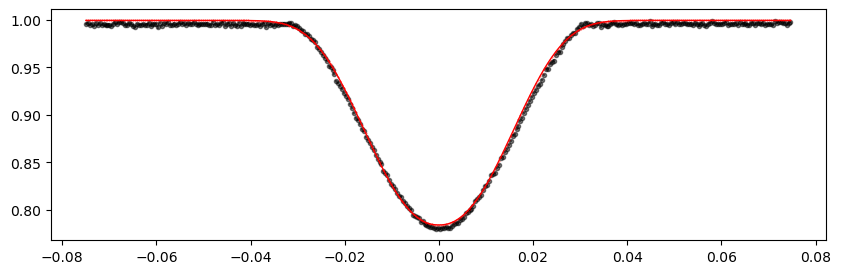

2866.978996 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.73it/s]


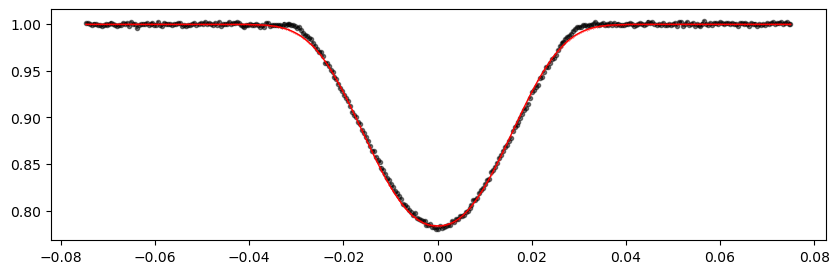

2870.32082 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.94it/s]


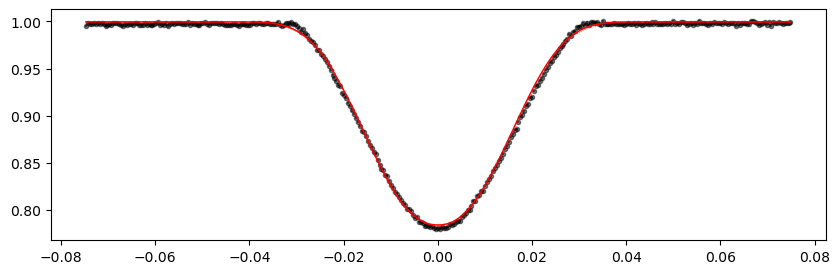

2873.662644 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.61it/s]


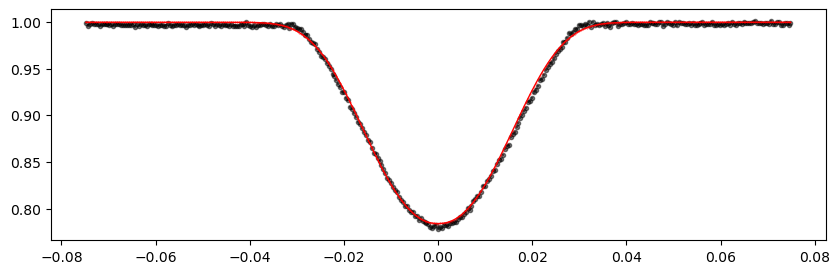

2877.004468 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1355.16it/s]


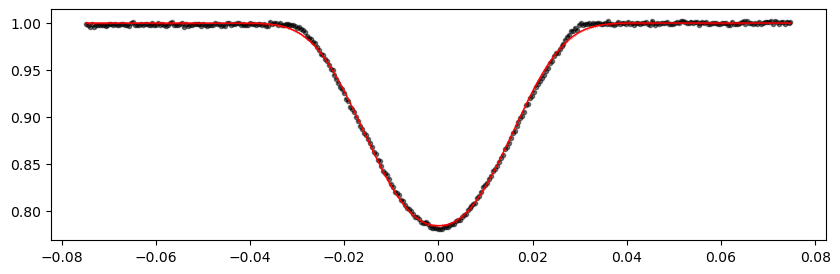

2880.346292 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.64it/s]


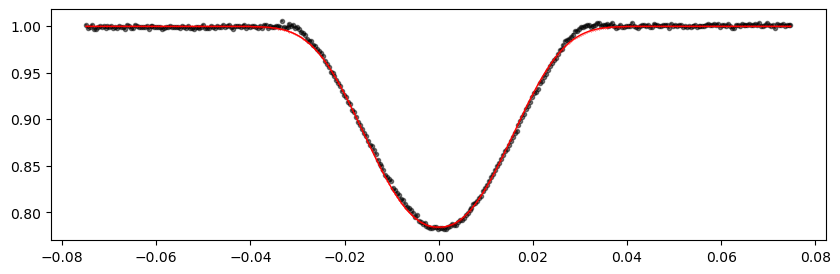

2883.6881160000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.55it/s]


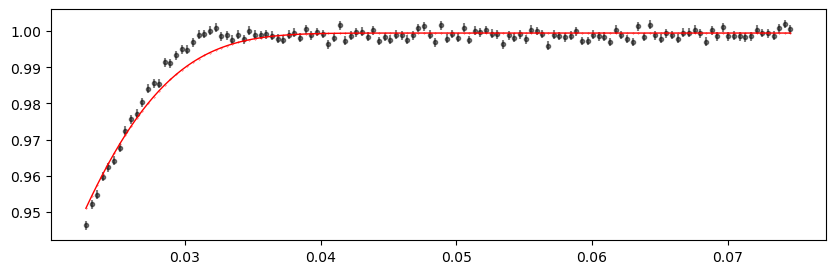

2887.0299400000004 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.51it/s]


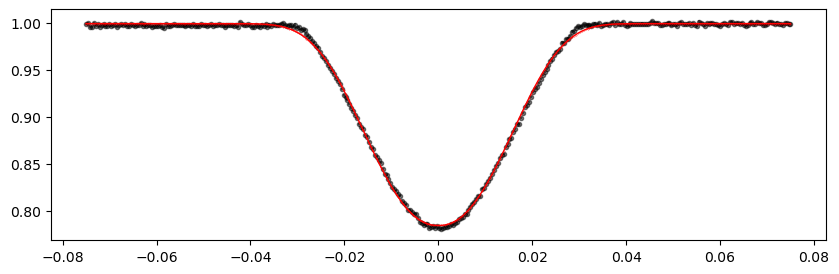

2890.371764 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.47it/s]


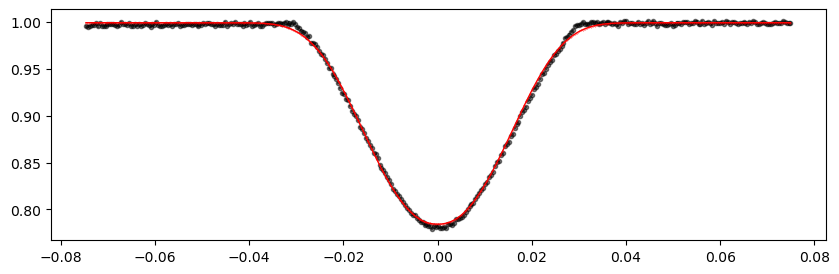

2893.713588 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.66it/s]


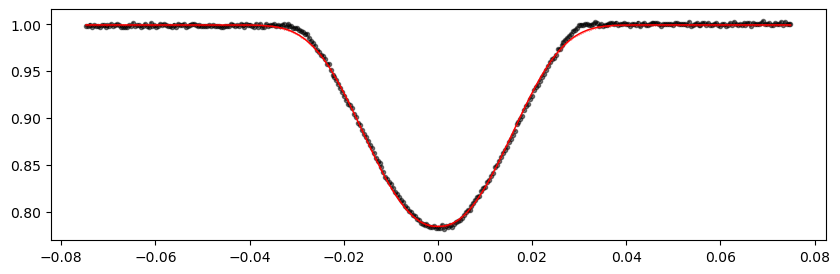

2900.397236 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.58it/s]


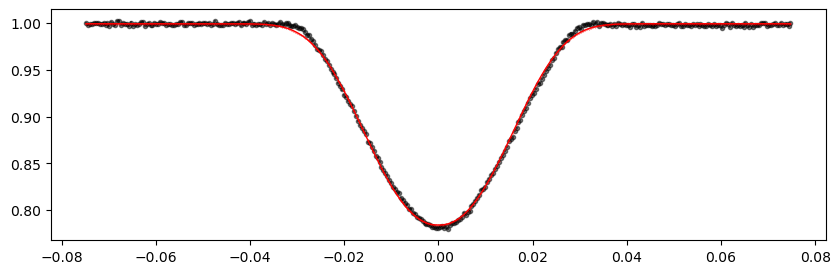

2903.73906 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1381.59it/s]


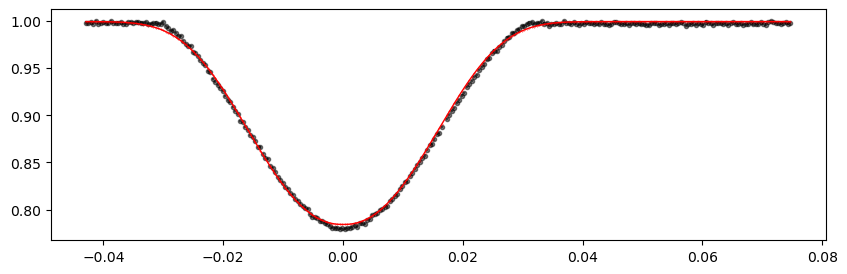

2907.080884 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.62it/s]


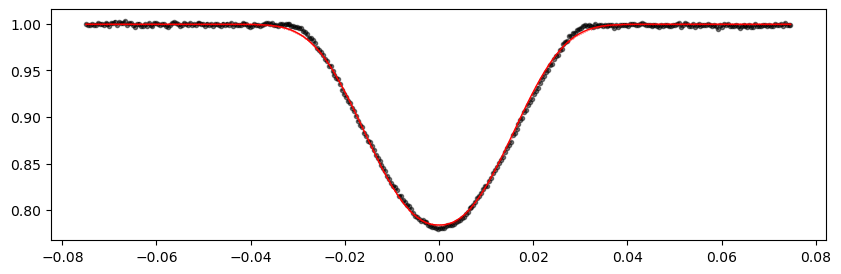

2913.764532 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.82it/s]


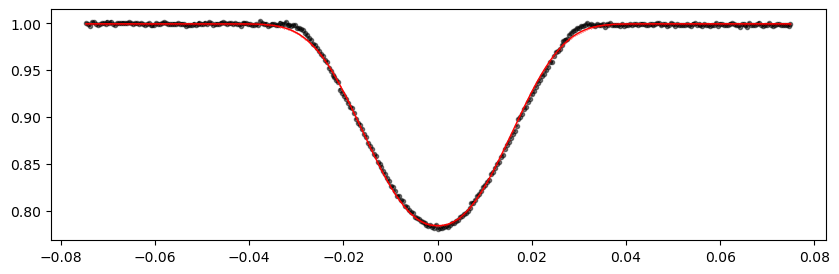

2917.1063560000002 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1364.53it/s]


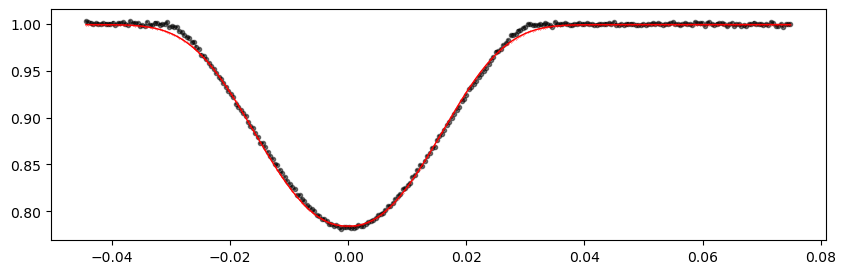

2920.4481800000003 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.57it/s]


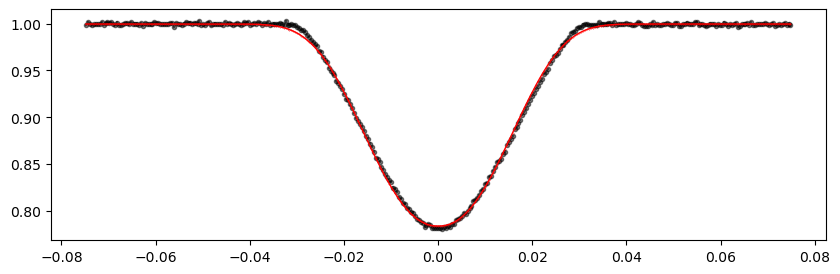

2927.131828 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1361.00it/s]


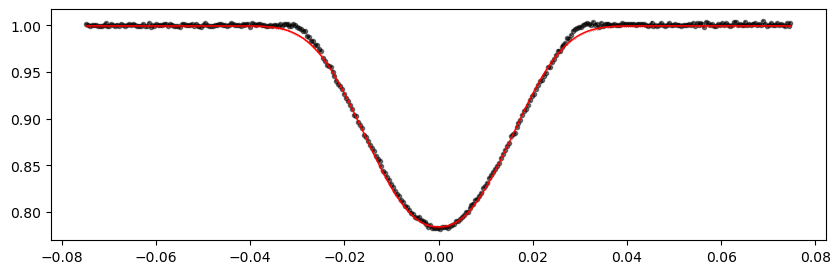

2930.473652 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1363.60it/s]


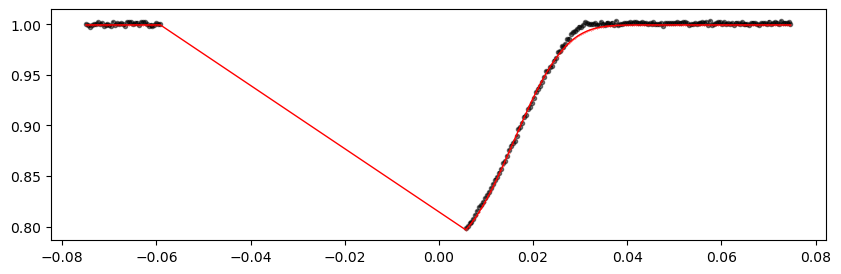

2933.8154759999998 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1372.86it/s]


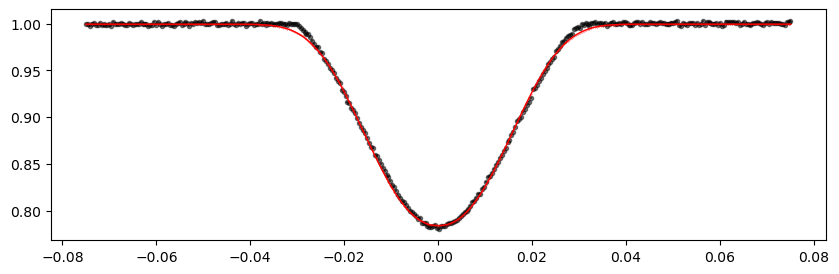

2940.499124 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1375.78it/s]


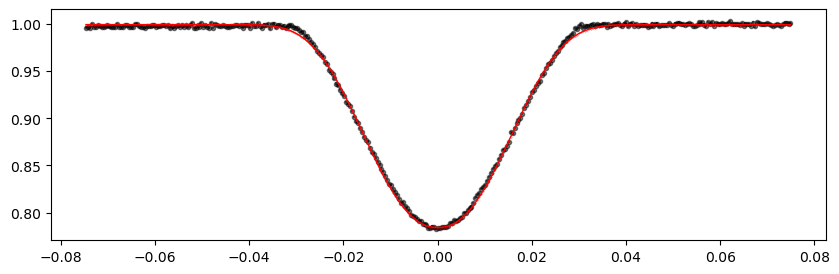

2943.840948 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.63it/s]


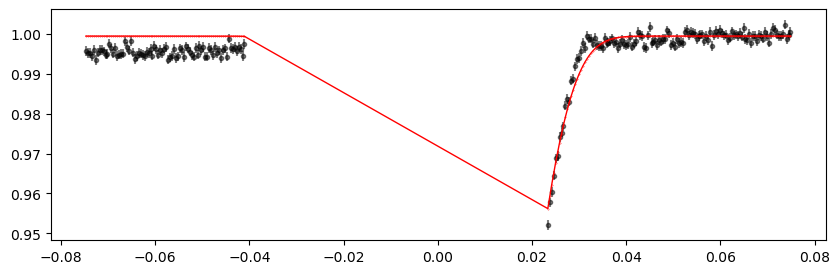

2947.182772 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1369.66it/s]


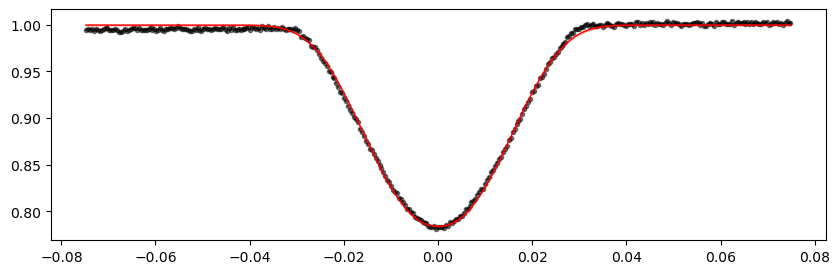

2957.2082440000004 0.9995033583125017 -0.2153388480950119 -0.09155924521145649


100%|██████████████████████████████████████████████████████| 10000/10000 [00:07<00:00, 1366.77it/s]


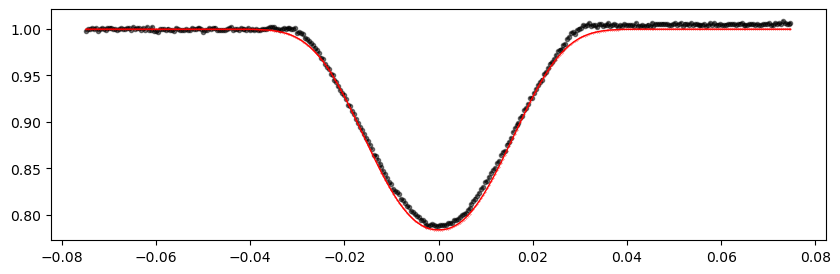

In [29]:
%matplotlib inline

print("Fitting individual secondary eclipses...")
etv_functions.fit_each_eclipse(data_secondary, n_transits, t0_secondary, period, mean_alpha0_s, mean_alpha1_s, mean_t0_s, mean_d_s, mean_Tau_s, outfile_path_s)
!$NOTIFY_CMD "Individual secondary eclipses fit done"

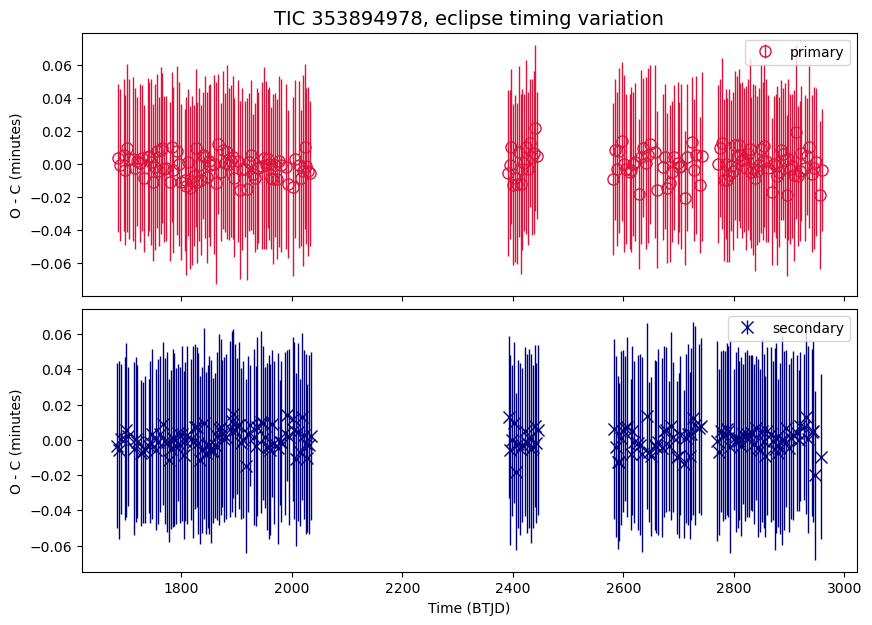

In [60]:
%matplotlib inline
# %matplotlib widget

#plot the extracted transit times to check for ETVs

fig, axs = plt.subplots(2, 1, figsize=(10, 7), sharex=True)

in_df_primary = pd.read_csv(outfile_path)
in_df_secondary = pd.read_csv(outfile_path_s)


in_df_primary['midpoint'] = in_df_primary['epoch'] + (in_df_primary['t0']*period)
in_df_primary['shift_mins'] = in_df_primary['t0']*period*24*60
in_df_primary['std_mins'] = in_df_primary['stdv_t0']*period*24*60

in_df_secondary['midpoint'] = in_df_secondary['epoch'] + (in_df_secondary['t0']*period)
in_df_secondary['shift_mins'] = in_df_secondary['t0']*period*24*60
in_df_secondary['std_mins'] = in_df_secondary['stdv_t0']*period*24*60

axs[0].errorbar(in_df_primary['epoch'], in_df_primary['shift_mins'], yerr = in_df_primary['std_mins'], 
             lw = 0, marker = 'o', elinewidth = 1, markersize = 8, color = 'None', ecolor='crimson', markeredgecolor = 'crimson', label="primary")
axs[1].errorbar(in_df_secondary['epoch'], in_df_secondary['shift_mins'], yerr = in_df_secondary['std_mins'], 
             lw = 0, marker = 'x', elinewidth = 1, markersize = 9, color = 'navy', zorder = -2, label="secondary" );

for ax in axs:
    ax.set_ylabel("O - C (minutes)")
    ax.legend();

axs[1].set_xlabel("Time (BTJD)")
axs[0].set_title(f"TIC {ticid}, eclipse timing variation", fontsize=14)

plt.subplots_adjust(hspace=0.05)
plt.show()

## make a periodogram 

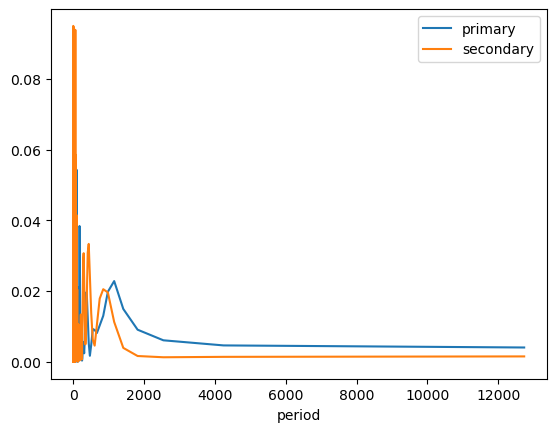

In [33]:
frequency, power = LombScargle(in_df_primary['epoch'], in_df_primary['shift_mins']).autopower()
frequency_s, power_s = LombScargle(in_df_secondary['epoch'], in_df_secondary['shift_mins']).autopower()

fig, ax = plt.subplots()

plt.plot(1/frequency, power, label = 'primary')    
plt.plot(1/frequency_s, power_s, label = 'secondary')    

plt.xlabel("period")

plt.legend()
plt.show()